In [1]:
import os
import subprocess

print("="*70)
print("CELL 2: CLONE REPOSITORY")
print("="*70)

os.chdir('/kaggle/working')

# Xóa clone cũ
if os.path.exists('cobl'):
    import shutil
    shutil.rmtree('cobl')
    print("🗑️  Removed old clone")

# Clone
print("🔽 Cloning...")
subprocess.run(['git', 'clone', 'https://github.com/traananhdat/cobl'], check=True)

print("✅ Clone successful!")
print("\n📂 Repository files:")
os.chdir('/kaggle/working/cobl')
subprocess.run(['ls', '-la'])

CELL 2: CLONE REPOSITORY
🗑️  Removed old clone
🔽 Cloning...


Cloning into 'cobl'...


✅ Clone successful!

📂 Repository files:
total 44
drwxr-xr-x 6 root root 4096 Dec 27 10:57 .
drwxr-xr-x 6 root root 4096 Dec 27 10:57 ..
drwxr-xr-x 7 root root 4096 Dec 27 10:57 cobl
drwxr-xr-x 2 root root 4096 Dec 27 10:57 demo
drwxr-xr-x 8 root root 4096 Dec 27 10:57 .git
-rw-r--r-- 1 root root  126 Dec 27 10:57 .gitignore
-rwxr-xr-x 1 root root 2252 Dec 27 10:57 install.sh
-rw-r--r-- 1 root root 1072 Dec 27 10:57 LICENSE
drwxr-xr-x 2 root root 4096 Dec 27 10:57 media
-rw-r--r-- 1 root root 1458 Dec 27 10:57 README.md
-rw-r--r-- 1 root root  949 Dec 27 10:57 setup.py


CompletedProcess(args=['ls', '-la'], returncode=0)

In [2]:
# ============================================================================
# CELL 0: RESET CUDA VÀ RESTART
# ============================================================================
import torch
import gc

# Clear CUDA cache
if torch.cuda.is_available():
    torch.cuda.empty_cache()
    torch.cuda.synchronize()
    gc.collect()

print("✅ CUDA cache cleared. Hãy RESTART KERNEL ngay!")
print("   Menu: Kernel → Restart Kernel")

✅ CUDA cache cleared. Hãy RESTART KERNEL ngay!
   Menu: Kernel → Restart Kernel


In [3]:
# ============================================================================
# CELL 1: IMPORTS
# ============================================================================
import sys
sys.path.insert(0, '/kaggle/working/cobl')

import os
import glob
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset
from torchvision import transforms
import numpy as np
from PIL import Image, ImageDraw, ImageFont
import matplotlib.pyplot as plt
from datetime import datetime
import json
from skimage import io, transform
import cv2
import warnings
warnings.filterwarnings('ignore')

print("="*70)
print("🔧 IMPORT U2NET")
print("="*70)

# Import U2Net
import importlib.util
spec_u2net = importlib.util.spec_from_file_location(
    "u2net_module", 
    "/kaggle/working/cobl/cobl/U2Net/u2net.py"
)
u2net_module = importlib.util.module_from_spec(spec_u2net)
spec_u2net.loader.exec_module(u2net_module)
U2NET = u2net_module.U2NET

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"✅ Device: {device}")

🔧 IMPORT U2NET
✅ Device: cuda


In [4]:
# ============================================================================
# CELL 2: CONFIGURATION
# ============================================================================
print("\n" + "="*70)
print("⚙️ CONFIGURATION")
print("="*70)

class Config:
    def __init__(self, dataset_name, train_img_dir, test_img_dir):
        self.dataset_name = dataset_name
        self.timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
        
        self.train_img_dir = train_img_dir
        self.test_img_dir = test_img_dir
        
        self.base_dir = f'/kaggle/working/experiments/{dataset_name}_{self.timestamp}'
        self.checkpoint_dir = f'{self.base_dir}/checkpoints'
        self.output_dir = f'{self.base_dir}/outputs'
        self.pseudo_labels_dir = f'{self.base_dir}/pseudo_labels'
        self.results_dir = f'{self.base_dir}/results'
        
        # Training params - ĐIỀU CHỈNH ĐỂ GIỮ SMALL OBJECTS
        self.num_epochs = 20
        self.batch_size = 4
        self.learning_rate = 0.0005  # LR thấp hơn để stable
        self.img_size = 320
        
        # Loss weights - QUAN TRỌNG
        self.use_dice_loss = True  # Dice loss tốt cho small objects
        self.dice_weight = 1.0
        self.bce_weight = 1.0
        self.edge_weight = 0.5
        
        # Pseudo label threshold - THẤP HƠN ĐỂ GIỮ SMALL OBJECTS
        self.pseudo_threshold = 0.3  # Từ 0.5 → 0.3
        
    def create_directories(self):
        for dir_path in [self.checkpoint_dir, self.output_dir, 
                         self.pseudo_labels_dir, self.results_dir]:
            os.makedirs(dir_path, exist_ok=True)
        os.makedirs(f'{self.pseudo_labels_dir}/train', exist_ok=True)
        os.makedirs(f'{self.pseudo_labels_dir}/test', exist_ok=True)
        print(f"✅ Created: {self.base_dir}")
    
    def save_config(self):
        config_dict = {k: v for k, v in self.__dict__.items() if not k.startswith('_')}
        with open(f'{self.base_dir}/config.json', 'w') as f:
            json.dump(config_dict, f, indent=4)

print("✅ Config ready!")


⚙️ CONFIGURATION
✅ Config ready!


In [5]:


# ============================================================================
# CELL 3: IMPROVED LOSS - DICE LOSS CHO SMALL OBJECTS
# ============================================================================
print("\n" + "="*70)
print("📐 LOSS FUNCTIONS")
print("="*70)

class DiceLoss(nn.Module):
    """Dice Loss - tốt cho small objects và imbalanced data"""
    def __init__(self, smooth=1.0):
        super().__init__()
        self.smooth = smooth
    
    def forward(self, pred, target):
        pred = pred.contiguous().view(-1)
        target = target.contiguous().view(-1)
        
        intersection = (pred * target).sum()
        dice = (2. * intersection + self.smooth) / (pred.sum() + target.sum() + self.smooth)
        
        return 1 - dice

class CombinedLoss(nn.Module):
    """Combined Loss: BCE + Dice + Edge"""
    
    def __init__(self, bce_weight=1.0, dice_weight=1.0, edge_weight=0.5):
        super().__init__()
        self.bce_weight = bce_weight
        self.dice_weight = dice_weight
        self.edge_weight = edge_weight
        
        self.bce = nn.BCELoss()
        self.dice = DiceLoss()
    
    def edge_loss(self, pred, target):
        """Edge loss với Sobel filter"""
        # Laplacian filter - đơn giản hơn Sobel
        laplacian = torch.tensor([
            [0, 1, 0],
            [1, -4, 1],
            [0, 1, 0]
        ], dtype=torch.float32, device=pred.device).view(1, 1, 3, 3)
        
        pred_edge = torch.abs(torch.nn.functional.conv2d(pred, laplacian, padding=1))
        target_edge = torch.abs(torch.nn.functional.conv2d(target, laplacian, padding=1))
        
        return torch.nn.functional.mse_loss(pred_edge, target_edge)
    
    def forward(self, d0, d1, d2, d3, d4, d5, d6, labels):
        # Clamp predictions
        d0 = torch.clamp(d0, 1e-7, 1.0 - 1e-7)
        d1 = torch.clamp(d1, 1e-7, 1.0 - 1e-7)
        d2 = torch.clamp(d2, 1e-7, 1.0 - 1e-7)
        d3 = torch.clamp(d3, 1e-7, 1.0 - 1e-7)
        d4 = torch.clamp(d4, 1e-7, 1.0 - 1e-7)
        d5 = torch.clamp(d5, 1e-7, 1.0 - 1e-7)
        d6 = torch.clamp(d6, 1e-7, 1.0 - 1e-7)
        
        # Multi-scale BCE loss
        bce0 = self.bce(d0, labels)
        bce1 = self.bce(d1, labels)
        bce2 = self.bce(d2, labels)
        bce3 = self.bce(d3, labels)
        bce4 = self.bce(d4, labels)
        bce5 = self.bce(d5, labels)
        bce6 = self.bce(d6, labels)
        
        # Multi-scale Dice loss (QUAN TRỌNG cho small objects)
        dice0 = self.dice(d0, labels)
        dice1 = self.dice(d1, labels)
        dice2 = self.dice(d2, labels)
        dice3 = self.dice(d3, labels)
        dice4 = self.dice(d4, labels)
        dice5 = self.dice(d5, labels)
        dice6 = self.dice(d6, labels)
        
        # Edge loss
        edge = self.edge_loss(d0, labels)
        
        # Combined
        bce_total = bce0 + bce1 + bce2 + bce3 + bce4 + bce5 + bce6
        dice_total = dice0 + dice1 + dice2 + dice3 + dice4 + dice5 + dice6
        
        total_loss = (self.bce_weight * bce_total + 
                     self.dice_weight * dice_total + 
                     self.edge_weight * edge)
        
        return total_loss, bce0, dice0, edge

print("✅ Loss functions ready!")



📐 LOSS FUNCTIONS
✅ Loss functions ready!


In [6]:
# ============================================================================
# CELL 4: DATASET
# ============================================================================
print("\n" + "="*70)
print("📦 DATASET CLASS")
print("="*70)

class SafeDataset(Dataset):
    """Dataset an toàn với validation"""
    
    def __init__(self, img_list, mask_list, img_size=320, augment=True):
        self.img_list = img_list
        self.mask_list = mask_list
        self.img_size = img_size
        self.augment = augment
        self._validate()
    
    def _validate(self):
        valid = []
        for img, mask in zip(self.img_list, self.mask_list):
            if os.path.exists(img) and os.path.exists(mask):
                valid.append((img, mask))
        
        self.img_list = [v[0] for v in valid]
        self.mask_list = [v[1] for v in valid]
    
    def __len__(self):
        return len(self.img_list)
    
    def __getitem__(self, idx):
        # Load
        image = io.imread(self.img_list[idx]).astype(np.float32)
        if len(image.shape) == 2:
            image = np.stack([image]*3, axis=2)
        elif image.shape[2] == 4:
            image = image[:, :, :3]
        
        mask = io.imread(self.mask_list[idx]).astype(np.float32)
        if len(mask.shape) == 3:
            mask = mask[:, :, 0]
        
        # Resize
        image = transform.resize(image, (self.img_size, self.img_size), 
                               mode='constant', anti_aliasing=True)
        mask = transform.resize(mask, (self.img_size, self.img_size), 
                              mode='constant', order=0, anti_aliasing=False)
        
        # Augment
        if self.augment and np.random.rand() > 0.5:
            image = np.fliplr(image).copy()
            mask = np.fliplr(mask).copy()
        
        # Normalize image
        image = np.clip(image / (image.max() + 1e-6), 0, 1)
        tmpImg = np.zeros((self.img_size, self.img_size, 3), dtype=np.float32)
        tmpImg[:, :, 0] = (image[:, :, 0] - 0.485) / 0.229
        tmpImg[:, :, 1] = (image[:, :, 1] - 0.456) / 0.224
        tmpImg[:, :, 2] = (image[:, :, 2] - 0.406) / 0.225
        tmpImg = np.clip(tmpImg, -10, 10)
        
        # Normalize mask - GIỮ SOFT LABEL (không threshold cứng)
        mask = np.clip(mask / 255.0 if mask.max() > 1 else mask, 0, 1)
        
        # To tensor
        img_tensor = torch.from_numpy(tmpImg).permute(2, 0, 1).float()
        mask_tensor = torch.from_numpy(mask).unsqueeze(0).float()
        
        return {'image': img_tensor, 'label': mask_tensor}

print("✅ Dataset ready!")



📦 DATASET CLASS
✅ Dataset ready!


In [7]:
# ============================================================================
# CELL 5: KHỞI TẠO CONFIG
# ============================================================================
print("\n" + "="*70)
print("🎯 KHỞI TẠO")
print("="*70)

config = Config(
    dataset_name='tabletop',
    train_img_dir='/kaggle/input/tabletop-dataset/kaggle/working/tabletop_dataset/train/',
    test_img_dir='/kaggle/input/tabletop-dataset/kaggle/working/tabletop_dataset/test/'
)

config.create_directories()
config.save_config()

print(f"📂 Base dir: {config.base_dir}")


🎯 KHỞI TẠO
✅ Created: /kaggle/working/experiments/tabletop_20251227_105800
📂 Base dir: /kaggle/working/experiments/tabletop_20251227_105800


In [8]:
# ============================================================================
# CELL 6: LOAD DATA
# ============================================================================
print("\n" + "="*70)
print("📦 LOAD DATA")
print("="*70)

train_img_list = sorted(glob.glob(config.train_img_dir + '*.png'))
test_img_list = sorted(glob.glob(config.test_img_dir + '*.png'))

print(f"✅ Found:")
print(f"   Train: {len(train_img_list)}")
print(f"   Test: {len(test_img_list)}")

# ============================================================================
# CELL 6.5: DOWNLOAD MODEL
# ============================================================================
print("\n" + "="*70)
print("📥 CHECK PRETRAINED MODEL")
print("="*70)

model_path = '/kaggle/working/cobl/cobl/U2Net/u2net.pth'

if not os.path.exists(model_path):
    print("📥 Downloading...")
    os.makedirs(os.path.dirname(model_path), exist_ok=True)
    import subprocess
    url = 'https://www.dropbox.com/scl/fi/obpwapfgjl6gwmmwpc1le/u2net.pth?rlkey=0q0dqx17fk9yve3ve98ws9zy9&st=z6uuzf1c&dl=1'
    subprocess.run(['curl', '-L', '-o', model_path, url])

print(f"✅ Model: {model_path}")


📦 LOAD DATA
✅ Found:
   Train: 1119
   Test: 20

📥 CHECK PRETRAINED MODEL
📥 Downloading...


  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100    17  100    17    0     0     33      0 --:--:-- --:--:-- --:--:--    33
100   496    0   496    0     0    453      0 --:--:--  0:00:01 --:--:--  1012
 43  168M   43 72.7M    0     0  27.8M      0  0:00:06  0:00:02  0:00:04 79.0M

✅ Model: /kaggle/working/cobl/cobl/U2Net/u2net.pth


100  168M  100  168M    0     0  46.1M      0  0:00:03  0:00:03 --:--:-- 86.3M


In [9]:
# ============================================================================
# CELL 7: TẠO PSEUDO LABELS - THRESHOLD THẤP ĐỂ GIỮ SMALL OBJECTS
# ============================================================================
print("\n" + "="*70)
print("📝 TẠO PSEUDO LABELS (Low threshold = giữ small objects)")
print("="*70)

pretrained_model = U2NET(3, 1)
pretrained_model.load_state_dict(torch.load(model_path, map_location=device))
pretrained_model.to(device)
pretrained_model.eval()

def create_pseudo_label(model, img_path, save_path, threshold=0.3):
    """Tạo pseudo label với threshold thấp"""
    image = io.imread(img_path).astype(np.float32)
    if len(image.shape) == 2:
        image = np.stack([image]*3, axis=2)
    elif image.shape[2] == 4:
        image = image[:, :, :3]
    
    original_size = image.shape[:2]
    
    image = transform.resize(image, (320, 320), mode='constant')
    image = np.clip(image / (image.max() + 1e-6), 0, 1)
    
    tmpImg = np.zeros((320, 320, 3), dtype=np.float32)
    tmpImg[:, :, 0] = (image[:, :, 0] - 0.485) / 0.229
    tmpImg[:, :, 1] = (image[:, :, 1] - 0.456) / 0.224
    tmpImg[:, :, 2] = (image[:, :, 2] - 0.406) / 0.225
    tmpImg = np.clip(tmpImg, -10, 10)
    
    img_tensor = torch.from_numpy(tmpImg).permute(2, 0, 1).unsqueeze(0).float().to(device)
    
    with torch.no_grad():
        d1, _, _, _, _, _, _ = model(img_tensor)
        pred = d1[:, 0, :, :]
        pred = torch.clamp(pred, 0, 1)
        pred = (pred - pred.min()) / (pred.max() - pred.min() + 1e-6)
        
        # THRESHOLD THẤP để giữ small objects
        pred = (pred > threshold).float()
        pred_np = pred.squeeze().cpu().numpy()
    
    # Morphology để làm sạch noise nhưng GIỮ small objects
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3, 3))
    pred_np = cv2.morphologyEx(pred_np, cv2.MORPH_CLOSE, kernel)
    
    pred_img = Image.fromarray((pred_np * 255).astype(np.uint8))
    pred_img = pred_img.resize(original_size[::-1], Image.NEAREST)
    pred_img.save(save_path)

print(f"🔄 Creating with threshold={config.pseudo_threshold}...")

for i, img_path in enumerate(train_img_list):
    save_path = f'{config.pseudo_labels_dir}/train/{os.path.basename(img_path)}'
    create_pseudo_label(pretrained_model, img_path, save_path, config.pseudo_threshold)
    if (i + 1) % 100 == 0:
        print(f"   ✓ {i+1}/{len(train_img_list)}")

for i, img_path in enumerate(test_img_list):
    save_path = f'{config.pseudo_labels_dir}/test/{os.path.basename(img_path)}'
    create_pseudo_label(pretrained_model, img_path, save_path, config.pseudo_threshold)
    if (i + 1) % 5 == 0:
        print(f"   ✓ {i+1}/{len(test_img_list)}")

train_mask_list = sorted(glob.glob(f'{config.pseudo_labels_dir}/train/*.png'))
test_mask_list = sorted(glob.glob(f'{config.pseudo_labels_dir}/test/*.png'))

print(f"✅ Created: {len(train_mask_list)} train, {len(test_mask_list)} test")



📝 TẠO PSEUDO LABELS (Low threshold = giữ small objects)
🔄 Creating with threshold=0.3...
   ✓ 100/1119
   ✓ 200/1119
   ✓ 300/1119
   ✓ 400/1119
   ✓ 500/1119
   ✓ 600/1119
   ✓ 700/1119
   ✓ 800/1119
   ✓ 900/1119
   ✓ 1000/1119
   ✓ 1100/1119
   ✓ 5/20
   ✓ 10/20
   ✓ 15/20
   ✓ 20/20
✅ Created: 1119 train, 20 test


In [11]:
# ============================================================================
# CELL 8: DATALOADER
# ============================================================================
print("\n" + "="*70)
print("🔧 DATALOADER")
print("="*70)

train_dataset = SafeDataset(train_img_list, train_mask_list, config.img_size, augment=True)
test_dataset = SafeDataset(test_img_list, test_mask_list, config.img_size, augment=False)

train_loader = DataLoader(train_dataset, batch_size=config.batch_size, 
                          shuffle=True, num_workers=2)
test_loader = DataLoader(test_dataset, batch_size=1, 
                         shuffle=False, num_workers=2)

print(f"✅ Train batches: {len(train_loader)}")
print(f"✅ Test batches: {len(test_loader)}")



🔧 DATALOADER
✅ Train batches: 280
✅ Test batches: 20


In [12]:
# ============================================================================
# CELL 9: TRAINING
# ============================================================================
print("\n" + "="*70)
print("🚀 TRAINING")
print("="*70)

model = U2NET(3, 1)
model.load_state_dict(torch.load(model_path, map_location=device))
model.to(device)

criterion = CombinedLoss(
    bce_weight=config.bce_weight,
    dice_weight=config.dice_weight,
    edge_weight=config.edge_weight
)

optimizer = optim.Adam(model.parameters(), lr=config.learning_rate)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'min', factor=0.5, patience=3, verbose=True)

print(f"⚙️ Config: {config.num_epochs} epochs, LR={config.learning_rate}")

def train_epoch(model, loader, criterion, optimizer, epoch):
    model.train()
    losses = {'total': 0, 'bce': 0, 'dice': 0, 'edge': 0}
    
    for i, data in enumerate(loader):
        images = data['image'].to(device)
        labels = data['label'].to(device)
        
        optimizer.zero_grad()
        d0, d1, d2, d3, d4, d5, d6 = model(images)
        loss, bce, dice, edge = criterion(d0, d1, d2, d3, d4, d5, d6, labels)
        loss.backward()
        optimizer.step()
        
        losses['total'] += loss.item()
        losses['bce'] += bce.item()
        losses['dice'] += dice.item()
        losses['edge'] += edge.item()
        
        if (i + 1) % 50 == 0:
            print(f"   [{epoch}][{i+1}/{len(loader)}] Loss: {loss.item():.4f} "
                  f"(BCE:{bce.item():.3f} Dice:{dice.item():.3f} Edge:{edge.item():.3f})")
    
    return {k: v/len(loader) for k, v in losses.items()}

history = {'total': [], 'bce': [], 'dice': [], 'edge': [], 'lr': []}

for epoch in range(1, config.num_epochs + 1):
    print(f"\n{'='*70}")
    print(f"EPOCH {epoch}/{config.num_epochs}")
    print(f"{'='*70}")
    
    losses = train_epoch(model, train_loader, criterion, optimizer, epoch)
    
    for k in losses:
        history[k].append(losses[k])
    history['lr'].append(optimizer.param_groups[0]['lr'])
    
    scheduler.step(losses['total'])
    
    print(f"\n✅ Epoch {epoch}: Total={losses['total']:.4f} "
          f"BCE={losses['bce']:.4f} Dice={losses['dice']:.4f} "
          f"Edge={losses['edge']:.4f}")
    
    if epoch % 5 == 0:
        torch.save(model.state_dict(), f'{config.checkpoint_dir}/epoch_{epoch}.pth')

final_path = f'{config.checkpoint_dir}/final.pth'
torch.save(model.state_dict(), final_path)
print(f"\n✅ Training done! Saved: {final_path}")



🚀 TRAINING
⚙️ Config: 20 epochs, LR=0.0005

EPOCH 1/20
   [1][50/280] Loss: 0.9360 (BCE:0.046 Dice:0.039 Edge:0.040)
   [1][100/280] Loss: 1.2938 (BCE:0.085 Dice:0.073 Edge:0.031)
   [1][150/280] Loss: 0.6212 (BCE:0.024 Dice:0.039 Edge:0.029)
   [1][200/280] Loss: 0.8640 (BCE:0.037 Dice:0.048 Edge:0.030)
   [1][250/280] Loss: 1.2948 (BCE:0.060 Dice:0.079 Edge:0.034)

✅ Epoch 1: Total=1.7813 BCE=0.1275 Dice=0.0841 Edge=0.0343

EPOCH 2/20
   [2][50/280] Loss: 1.0435 (BCE:0.056 Dice:0.052 Edge:0.037)
   [2][100/280] Loss: 0.6188 (BCE:0.026 Dice:0.029 Edge:0.025)
   [2][150/280] Loss: 1.1064 (BCE:0.062 Dice:0.064 Edge:0.037)
   [2][200/280] Loss: 1.3779 (BCE:0.079 Dice:0.073 Edge:0.044)
   [2][250/280] Loss: 1.6702 (BCE:0.113 Dice:0.071 Edge:0.019)

✅ Epoch 2: Total=1.3310 BCE=0.0786 Dice=0.0692 Edge=0.0283

EPOCH 3/20
   [3][50/280] Loss: 1.4835 (BCE:0.078 Dice:0.084 Edge:0.031)
   [3][100/280] Loss: 0.6727 (BCE:0.022 Dice:0.027 Edge:0.022)
   [3][150/280] Loss: 1.0865 (BCE:0.051 Dice:0.


📊 PLOT


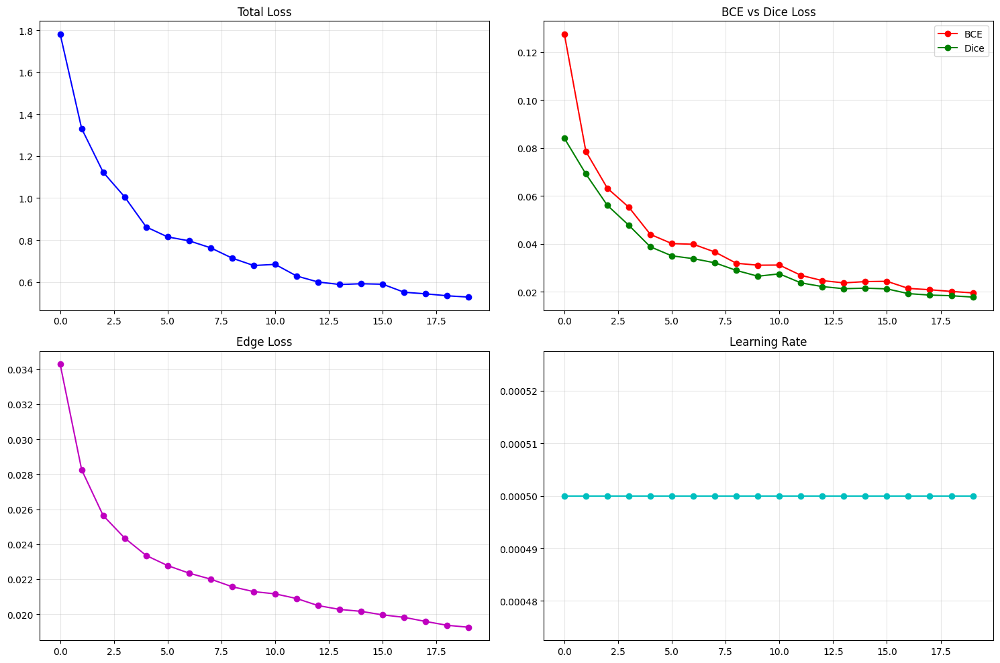

In [18]:
# ============================================================================
# CELL 10: PLOT
# ============================================================================
print("\n" + "="*70)
print("📊 PLOT")
print("="*70)

fig, axes = plt.subplots(2, 2, figsize=(15, 10))

axes[0, 0].plot(history['total'], 'b-o')
axes[0, 0].set_title('Total Loss')
axes[0, 0].grid(True, alpha=0.3)

axes[0, 1].plot(history['bce'], 'r-o', label='BCE')
axes[0, 1].plot(history['dice'], 'g-o', label='Dice')
axes[0, 1].set_title('BCE vs Dice Loss')
axes[0, 1].legend()
axes[0, 1].grid(True, alpha=0.3)

axes[1, 0].plot(history['edge'], 'm-o')
axes[1, 0].set_title('Edge Loss')
axes[1, 0].grid(True, alpha=0.3)

axes[1, 1].plot(history['lr'], 'c-o')
axes[1, 1].set_title('Learning Rate')
axes[1, 1].grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig(f'{config.output_dir}/training.png', dpi=150)
plt.show()


📥 LOADING U2NET
✅ Device: cuda

🔧 LOADING MODEL WEIGHTS
✅ Loaded pretrained model from: /kaggle/working/cobl/cobl/U2Net/u2net.pth

🧪 TESTING
📸 Testing image: /kaggle/working/cobl/demo/tabletop_sample.png

🔍 Running inference with intermediate outputs...


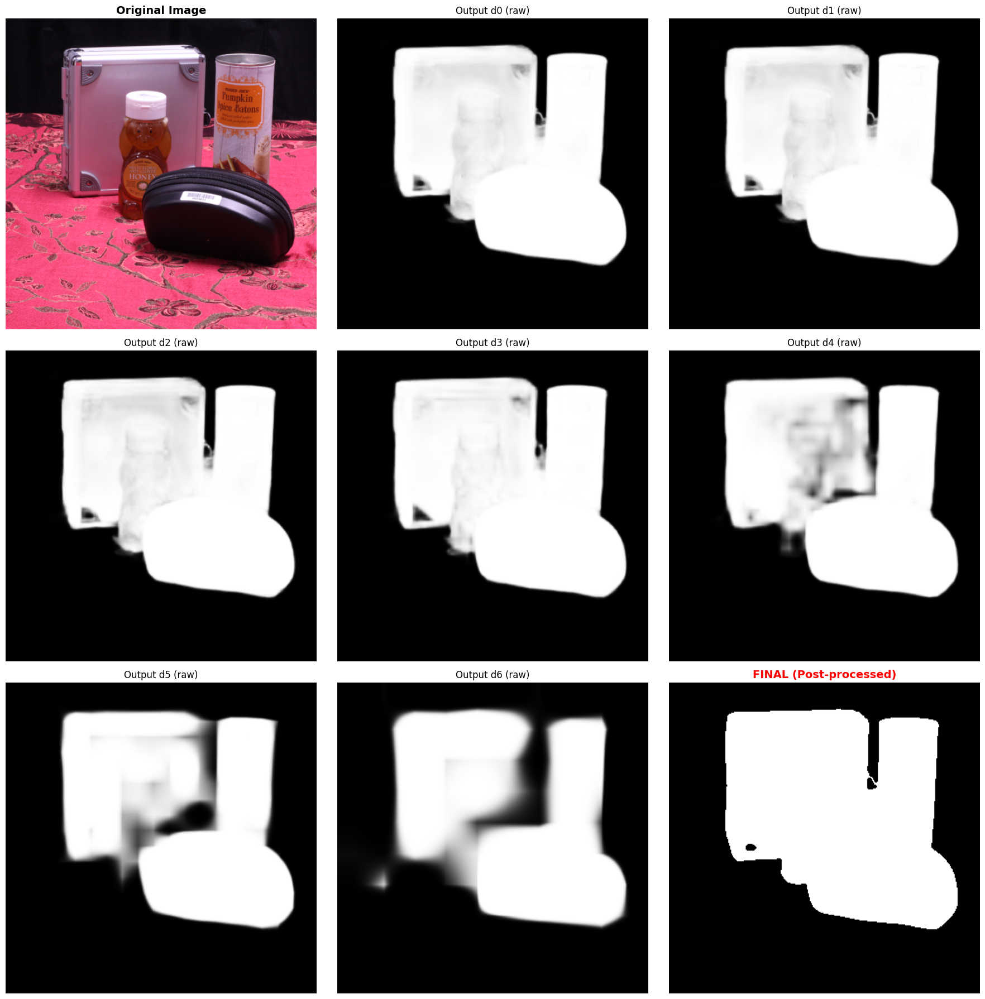


✅ Done!


In [29]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from torchvision import transforms
import cv2
import os
import importlib.util

# ========================================================
# 0. LOAD U2NET MODEL ARCHITECTURE
# ========================================================
print("="*70)
print("📥 LOADING U2NET")
print("="*70)

# Import U2Net architecture
spec_u2net = importlib.util.spec_from_file_location(
    "u2net_module", 
    "/kaggle/working/cobl/cobl/U2Net/u2net.py"
)
u2net_module = importlib.util.module_from_spec(spec_u2net)
spec_u2net.loader.exec_module(u2net_module)
U2NET = u2net_module.U2NET

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"✅ Device: {device}")

# ========================================================
# 0.5. LOAD TRAINED MODEL WEIGHTS
# ========================================================
print("\n" + "="*70)
print("🔧 LOADING MODEL WEIGHTS")
print("="*70)

# Option 1: Load pretrained model
pretrained_path = '/kaggle/working/cobl/cobl/U2Net/u2net.pth'

# Option 2: Load your fine-tuned model (uncomment nếu đã train xong)
# finetuned_path = '/kaggle/working/experiments/tabletop_XXXXXX_XXXXXX/checkpoints/final.pth'

if os.path.exists(pretrained_path):
    model_test = U2NET(3, 1)
    model_test.load_state_dict(torch.load(pretrained_path, map_location=device))
    model_test.to(device)
    model_test.eval()
    print(f"✅ Loaded pretrained model from: {pretrained_path}")
else:
    raise FileNotFoundError(f"❌ Model not found at: {pretrained_path}")

# Nếu bạn muốn so sánh pretrained vs finetuned, uncomment:
# if os.path.exists(finetuned_path):
#     finetuned_model = U2NET(3, 1)
#     finetuned_model.load_state_dict(torch.load(finetuned_path, map_location=device))
#     finetuned_model.to(device)
#     finetuned_model.eval()
#     print(f"✅ Loaded finetuned model from: {finetuned_path}")

# ========================================================
# 1. TIỀN XỬ LÝ - GIỐNG TRAINING
# ========================================================
def preprocess_image(image_path, img_size=320):
    """Tiền xử lý CHÍNH XÁC như training script"""
    img = Image.open(image_path).convert('RGB')
    img_np = np.array(img).astype(np.float32)
    
    # Resize
    img_resized = cv2.resize(img_np, (img_size, img_size))
    
    # Normalize - GIỐNG TRAINING
    img_normalized = np.clip(img_resized / (img_resized.max() + 1e-6), 0, 1)
    
    tmpImg = np.zeros((img_size, img_size, 3), dtype=np.float32)
    tmpImg[:, :, 0] = (img_normalized[:, :, 0] - 0.485) / 0.229
    tmpImg[:, :, 1] = (img_normalized[:, :, 1] - 0.456) / 0.224
    tmpImg[:, :, 2] = (img_normalized[:, :, 2] - 0.406) / 0.225
    tmpImg = np.clip(tmpImg, -10, 10)
    
    # To tensor
    input_tensor = torch.from_numpy(tmpImg).permute(2, 0, 1).unsqueeze(0).float()
    
    return input_tensor, np.array(img)

# ========================================================
# 2. HẬU XỬ LÝ - GIỐNG TRAINING (QUAN TRỌNG!)
# ========================================================
def postprocess_output(pred, use_otsu=True, morphology=True):
    """
    Post-processing giống training script
    
    Args:
        pred: tensor đầu ra từ model [1, 1, H, W]
        use_otsu: dùng OTSU threshold (adaptive) hay fixed threshold
        morphology: áp dụng morphology để làm sạch
    """
    # Normalize về [0, 1]
    pred = torch.clamp(pred, 0, 1)
    pred = (pred - pred.min()) / (pred.max() - pred.min() + 1e-6)
    pred_np = pred.squeeze().cpu().numpy()
    
    # Convert to uint8
    pred_uint8 = (pred_np * 255).astype(np.uint8)
    
    if use_otsu:
        # OTSU - adaptive threshold (tự động tìm threshold tốt nhất)
        _, pred_binary = cv2.threshold(pred_uint8, 0, 255, 
                                       cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    else:
        # Fixed threshold (như training: 0.3)
        pred_binary = (pred_np > 0.3).astype(np.uint8) * 255
    
    if morphology:
        # Morphology closing - loại bỏ noise nhỏ
        kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3, 3))
        pred_binary = cv2.morphologyEx(pred_binary, cv2.MORPH_CLOSE, kernel)
    
    return pred_binary / 255.0  # Return [0, 1]

# ========================================================
# 3. HÀM DỰ ĐOÁN VÀ HIỂN THỊ - FIXED
# ========================================================
def predict_custom_image(image_path, model, device, show_intermediate=True):
    """
    Dự đoán với post-processing đúng
    
    Args:
        image_path: đường dẫn ảnh
        model: U2Net model
        device: cuda/cpu
        show_intermediate: hiện các output trung gian (d0-d6)
    """
    # Preprocess
    inputs, original_img = preprocess_image(image_path)
    inputs = inputs.to(device)
    
    with torch.no_grad():
        # Forward
        d0, d1, d2, d3, d4, d5, d6 = model(inputs)
        
        # Post-process d0 (output chính)
        final_mask = postprocess_output(d0[:, 0:1, :, :], 
                                        use_otsu=True, 
                                        morphology=True)
        
        if show_intermediate:
            # ===== HIỂN THỊ ĐẦY ĐỦ =====
            fig, axes = plt.subplots(3, 3, figsize=(18, 18))
            axes = axes.flatten()
            
            # 1. Original
            axes[0].imshow(original_img)
            axes[0].set_title("Original Image", fontsize=14, fontweight='bold')
            axes[0].axis('off')
            
            # 2-8. Intermediate outputs (d0-d6) - RAW
            d_list = [d0, d1, d2, d3, d4, d5, d6]
            for j, d in enumerate(d_list):
                pred = d[:, 0, :, :]
                pred = (pred - torch.min(pred)) / (torch.max(pred) - torch.min(pred) + 1e-8)
                pred_show = pred[0].cpu().numpy()
                
                axes[j+1].imshow(pred_show, cmap='gray')
                axes[j+1].set_title(f"Output d{j} (raw)", fontsize=12)
                axes[j+1].axis('off')
            
            # 9. FINAL - ĐÃ POST-PROCESS (QUAN TRỌNG!)
            axes[8].imshow(final_mask, cmap='gray')
            axes[8].set_title("FINAL (Post-processed)", 
                            fontsize=14, fontweight='bold', color='red')
            axes[8].axis('off')
            
            plt.tight_layout()
            plt.show()
        
        else:
            # ===== HIỂN THỊ COMPACT =====
            fig, axes = plt.subplots(1, 2, figsize=(12, 6))
            
            # Original
            axes[0].imshow(original_img)
            axes[0].set_title("Original Image", fontsize=14, fontweight='bold')
            axes[0].axis('off')
            
            # Final mask
            axes[1].imshow(final_mask, cmap='gray')
            axes[1].set_title("Segmentation Result", fontsize=14, fontweight='bold')
            axes[1].axis('off')
            
            plt.tight_layout()
            plt.show()
        
        return final_mask

# ========================================================
# 4. HÀM SO SÁNH PRETRAINED VS FINETUNED
# ========================================================
def compare_models(image_path, pretrained_model, finetuned_model, device):
    """So sánh 2 models"""
    inputs, original_img = preprocess_image(image_path)
    inputs = inputs.to(device)
    
    with torch.no_grad():
        # Pretrained
        d0_pre, _, _, _, _, _, _ = pretrained_model(inputs)
        mask_pre = postprocess_output(d0_pre[:, 0:1, :, :])
        
        # Finetuned
        d0_fine, _, _, _, _, _, _ = finetuned_model(inputs)
        mask_fine = postprocess_output(d0_fine[:, 0:1, :, :])
    
    # Plot
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))
    
    axes[0].imshow(original_img)
    axes[0].set_title("Original", fontsize=14, fontweight='bold')
    axes[0].axis('off')
    
    axes[1].imshow(mask_pre, cmap='gray')
    axes[1].set_title("Pretrained Model", fontsize=14, fontweight='bold')
    axes[1].axis('off')
    
    axes[2].imshow(mask_fine, cmap='gray')
    axes[2].set_title("Fine-tuned Model", fontsize=14, fontweight='bold', color='red')
    axes[2].axis('off')
    
    plt.tight_layout()
    plt.show()
    
    return mask_pre, mask_fine

# ========================================================
# 5. CHẠY TEST
# ========================================================
print("\n" + "="*70)
print("🧪 TESTING")
print("="*70)

my_image_path = "/kaggle/working/cobl/demo/tabletop_sample.png"

# Kiểm tra file tồn tại
if not os.path.exists(my_image_path):
    print(f"❌ Image not found: {my_image_path}")
    print("💡 Thay đổi đường dẫn hoặc upload ảnh của bạn!")
else:
    print(f"📸 Testing image: {my_image_path}")
    
    # CÁCH 1: Hiển thị đầy đủ (như ảnh bạn gửi nhưng CÓ FINAL)
    print("\n🔍 Running inference with intermediate outputs...")
    final_mask = predict_custom_image(my_image_path, model_test, device, 
                                      show_intermediate=True)
    
    # CÁCH 2: Chỉ hiện kết quả cuối (uncomment nếu muốn)
    # print("\n🔍 Running inference (clean view)...")
    # final_mask = predict_custom_image(my_image_path, model_test, device, 
    #                                   show_intermediate=False)
    
    # CÁCH 3: So sánh pretrained vs finetuned (uncomment nếu có finetuned model)
    # print("\n⚖️ Comparing pretrained vs finetuned...")
    # mask_pre, mask_fine = compare_models(my_image_path, model_test, 
    #                                      finetuned_model, device)
    
    print("\n✅ Done!")

🚀 U2NET COMPLETE SYSTEM
✅ Device: cuda
EXAMPLE 1: SINGLE DATASET
✅ Found: 1119 train, 20 test
✅ Created experiment: tabletop_20251227_124657
💾 Saved config: /kaggle/working/experiments/tabletop_20251227_124657/config.json

📥 Loading pretrained model...
✅ Pretrained model loaded

STEP 1: GENERATE PSEUDO LABELS

🔄 Generating pseudo labels for train...
   ✓ 50/1119
   ✓ 100/1119
   ✓ 150/1119
   ✓ 200/1119
   ✓ 250/1119
   ✓ 300/1119
   ✓ 350/1119
   ✓ 400/1119
   ✓ 450/1119
   ✓ 500/1119
   ✓ 550/1119
   ✓ 600/1119
   ✓ 650/1119
   ✓ 700/1119
   ✓ 750/1119
   ✓ 800/1119
   ✓ 850/1119
   ✓ 900/1119
   ✓ 950/1119
   ✓ 1000/1119
   ✓ 1050/1119
   ✓ 1100/1119
✅ Done: 1119 labels

🔄 Generating pseudo labels for test...
✅ Done: 20 labels

STEP 2: CREATE DATASETS
📦 Train dataset:
   Valid samples: 1119
📦 Test dataset:
   Valid samples: 20
✅ Train batches: 280
✅ Test samples: 20

STEP 3: TRAINING

🚀 TRAINING START

EPOCH 1/20
   [1][50/280] Loss: 1.1529 (BCE:0.082 Dice:0.066)
   [1][100/280] Los

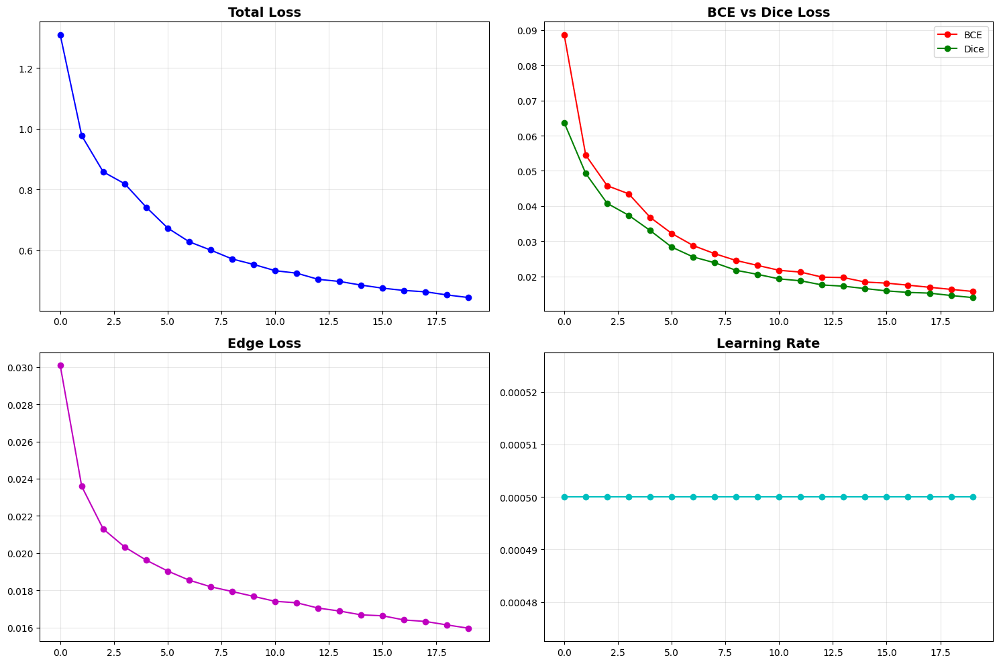

💾 Saved: /kaggle/working/experiments/tabletop_20251227_124657/visualizations/training_curves/history.png

STEP 4: TESTING

📸 Testing sample images with decoder outputs...

[1/3] test_0000.png
💾 Saved decoder outputs: /kaggle/working/experiments/tabletop_20251227_124657/results/decoder_outputs/test_0000.png


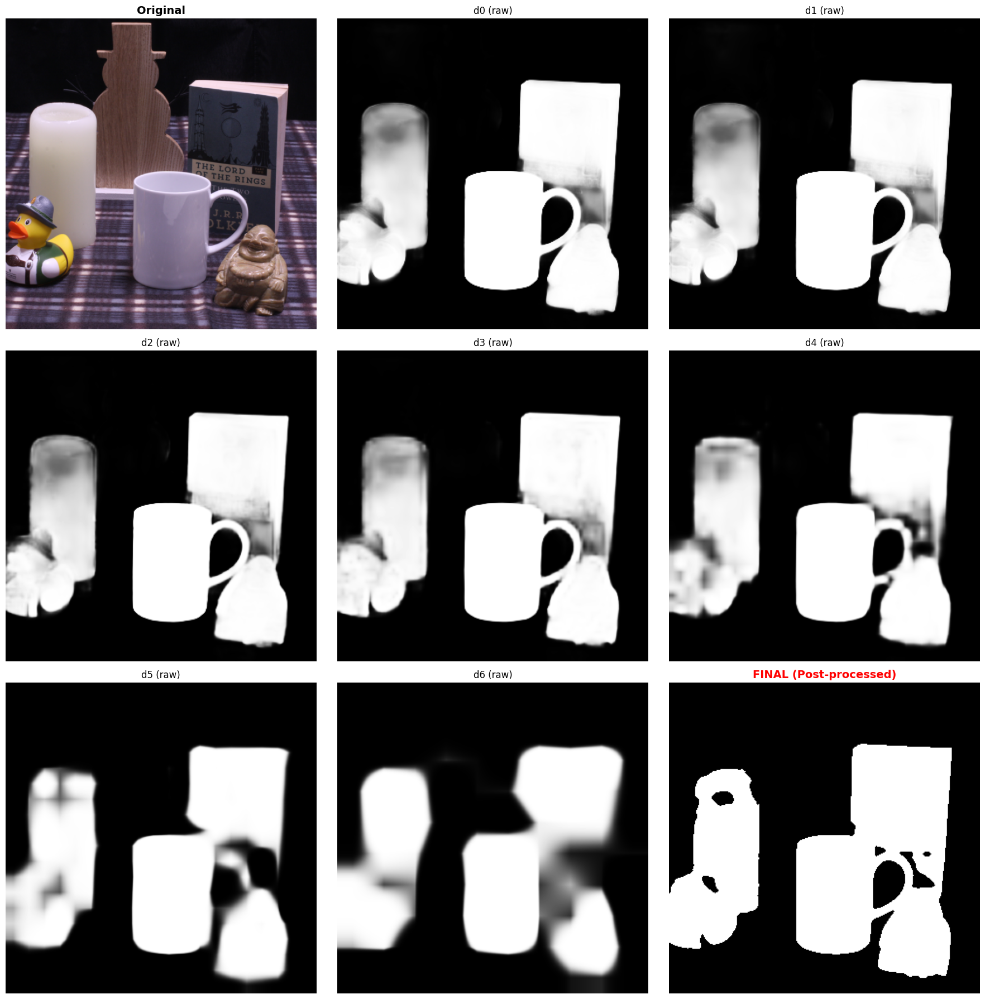


[2/3] test_0001.png
💾 Saved decoder outputs: /kaggle/working/experiments/tabletop_20251227_124657/results/decoder_outputs/test_0001.png


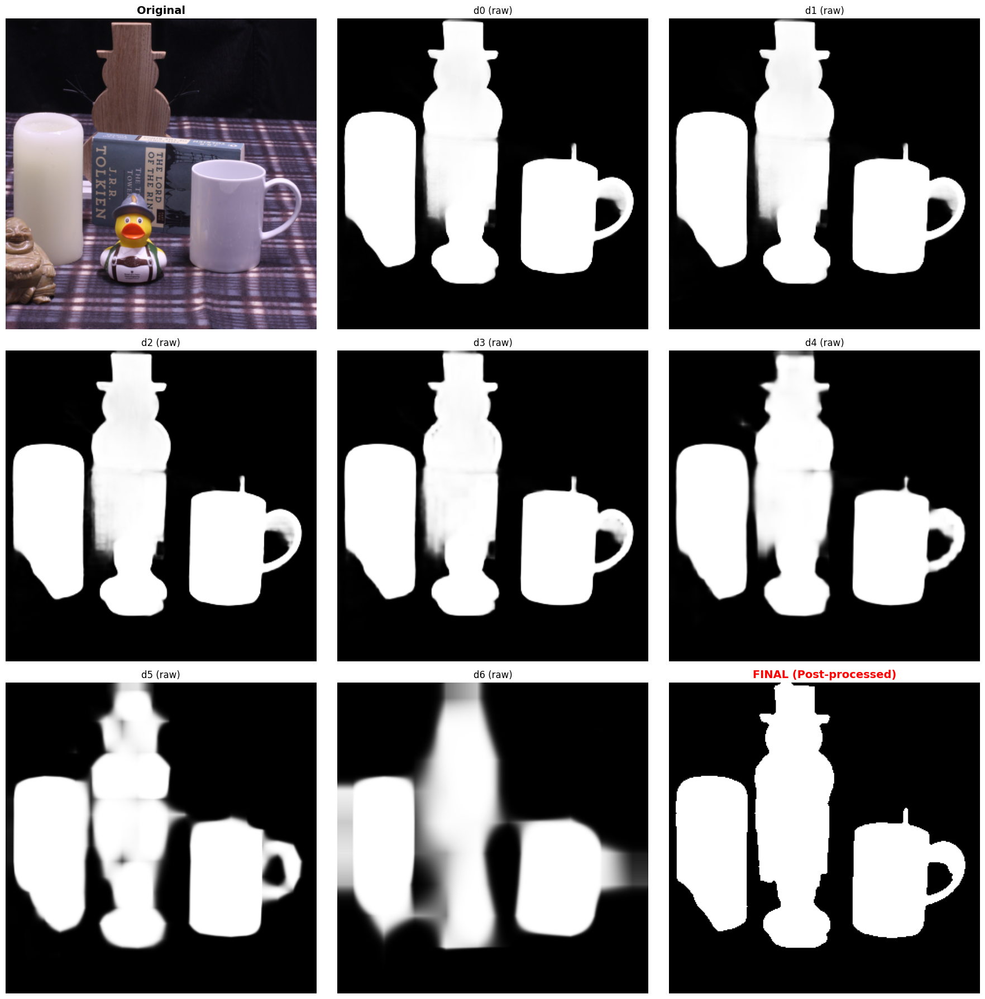


[3/3] test_0002.png
💾 Saved decoder outputs: /kaggle/working/experiments/tabletop_20251227_124657/results/decoder_outputs/test_0002.png


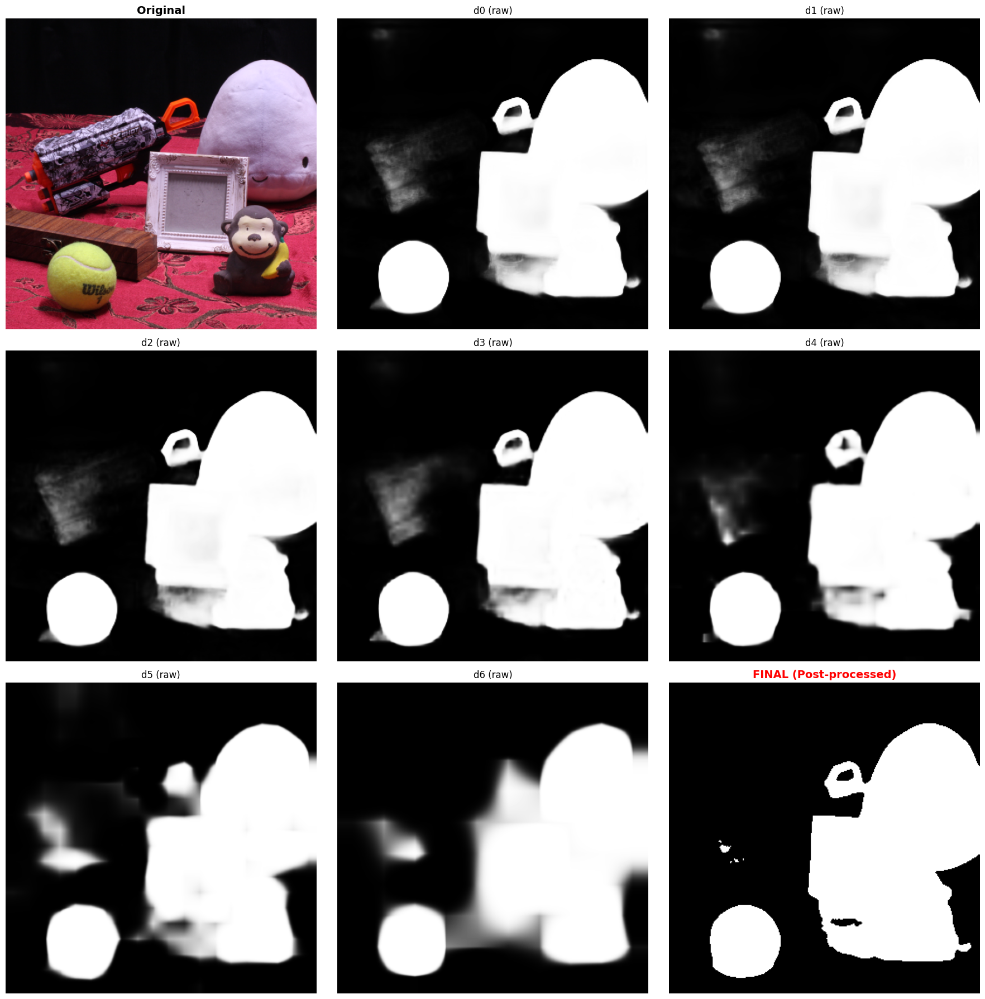


⚖️ Comparing pretrained vs fine-tuned...

[1/3] test_0000.png
💾 Saved comparison: /kaggle/working/experiments/tabletop_20251227_124657/results/comparisons/test_0000.png


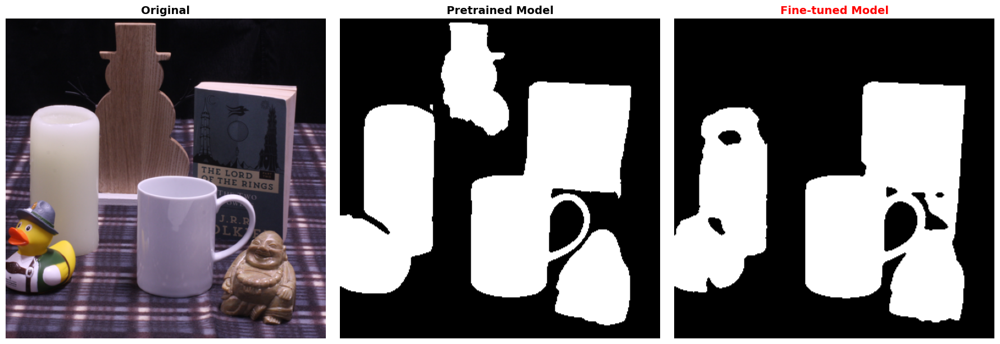


[2/3] test_0001.png
💾 Saved comparison: /kaggle/working/experiments/tabletop_20251227_124657/results/comparisons/test_0001.png


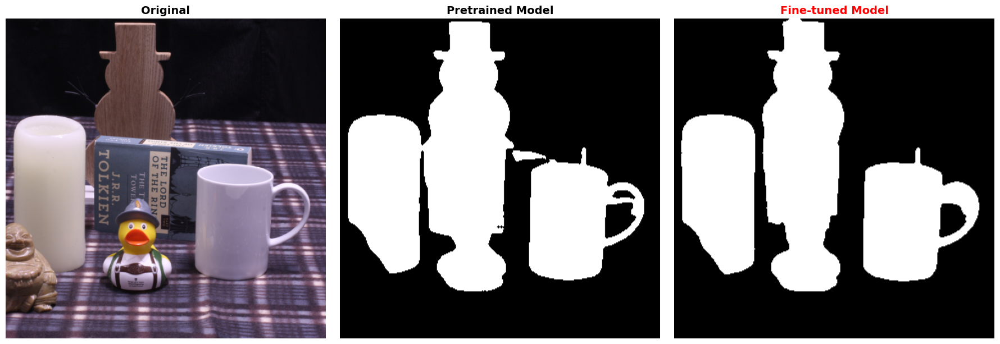


[3/3] test_0002.png
💾 Saved comparison: /kaggle/working/experiments/tabletop_20251227_124657/results/comparisons/test_0002.png


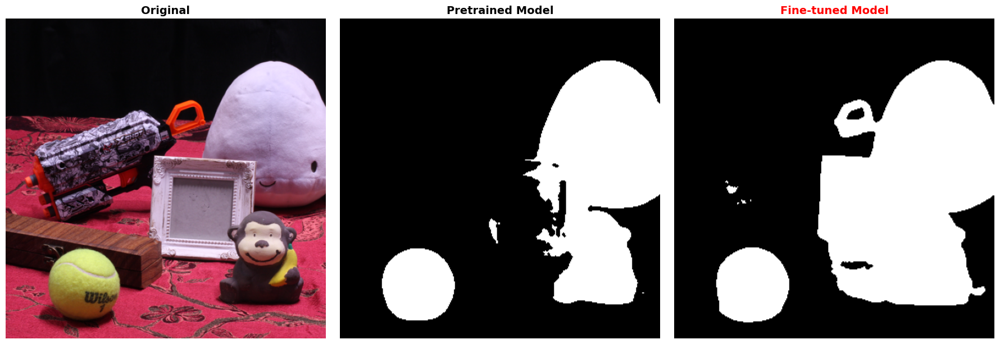


✅ EXPERIMENT COMPLETE!
📂 Results saved in: /kaggle/working/experiments/tabletop_20251227_124657
   - Checkpoints: /kaggle/working/experiments/tabletop_20251227_124657/checkpoints
   - Results: /kaggle/working/experiments/tabletop_20251227_124657/results
   - Visualizations: /kaggle/working/experiments/tabletop_20251227_124657/visualizations


"\n═══════════════════════════════════════════════════════════════════════════\n                        HƯỚNG DẪN SỬ DỤNG\n═══════════════════════════════════════════════════════════════════════════\n\n1. TRAIN & TEST 1 DATASET:\n   -------------------------------------------\n   example_single_dataset()\n   \n   → Tự động: generate pseudo labels → train → test → save results\n\n2. TRAIN & TEST NHIỀU DATASETS:\n   -------------------------------------------\n   example_multiple_datasets()\n   \n   → Loop qua các datasets, mỗi dataset 1 experiment riêng\n\n3. TEST MODEL ĐÃ TRAIN:\n   -------------------------------------------\n   example_test_only()\n   \n   → Load model đã train và test\n\n4. TEST NHANH 1 ẢNH:\n   -------------------------------------------\n   # Dùng pretrained:\n   quick_test_image('/path/to/image.png')\n   \n   # Dùng model đã train:\n   quick_test_image('/path/to/image.png', '/path/to/model.pth')\n\n5. XEM TẤT CẢ EXPERIMENTS:\n   ----------------------------------

In [31]:
# ============================================================================
# U2NET COMPLETE SYSTEM - TRAIN & TEST MULTIPLE DATASETS
# ============================================================================

# ============================================================================
# CELL 1: IMPORTS & SETUP
# ============================================================================
import sys
import os
import glob
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset
from torch.autograd import Variable
import numpy as np
from PIL import Image, ImageDraw, ImageFont
import matplotlib.pyplot as plt
from datetime import datetime
import json
import cv2
from skimage import io, transform
import warnings
warnings.filterwarnings('ignore')

print("="*80)
print("🚀 U2NET COMPLETE SYSTEM")
print("="*80)

# Import U2Net architecture
import importlib.util
spec_u2net = importlib.util.spec_from_file_location(
    "u2net_module", 
    "/kaggle/working/cobl/cobl/U2Net/u2net.py"
)
u2net_module = importlib.util.module_from_spec(spec_u2net)
spec_u2net.loader.exec_module(u2net_module)
U2NET = u2net_module.U2NET

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"✅ Device: {device}")

# ============================================================================
# CELL 2: CONFIGURATION MANAGER
# ============================================================================
class ExperimentConfig:
    """Quản lý config cho nhiều experiments"""
    
    def __init__(self, dataset_name, train_img_dir, test_img_dir=None):
        self.dataset_name = dataset_name
        self.timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
        
        # Paths
        self.train_img_dir = train_img_dir
        self.test_img_dir = test_img_dir if test_img_dir else train_img_dir
        
        # Experiment directory structure
        self.exp_name = f"{dataset_name}_{self.timestamp}"
        self.base_dir = f'/kaggle/working/experiments/{self.exp_name}'
        self.checkpoint_dir = f'{self.base_dir}/checkpoints'
        self.pseudo_labels_dir = f'{self.base_dir}/pseudo_labels'
        self.results_dir = f'{self.base_dir}/results'
        self.visualization_dir = f'{self.base_dir}/visualizations'
        
        # Training hyperparameters
        self.num_epochs = 20
        self.batch_size = 4
        self.learning_rate = 0.0005
        self.img_size = 320
        
        # Loss weights
        self.bce_weight = 1.0
        self.dice_weight = 1.0
        self.edge_weight = 0.5
        
        # Pseudo label threshold
        self.pseudo_threshold = 0.3  # Low threshold cho small objects
        
        # Model paths
        self.pretrained_model_path = '/kaggle/working/cobl/cobl/U2Net/u2net.pth'
    
    def create_directories(self):
        """Tạo cấu trúc thư mục"""
        dirs = [
            self.checkpoint_dir,
            self.pseudo_labels_dir,
            self.results_dir,
            self.visualization_dir,
            f'{self.pseudo_labels_dir}/train',
            f'{self.pseudo_labels_dir}/test',
            f'{self.results_dir}/decoder_outputs',
            f'{self.results_dir}/comparisons',
            f'{self.visualization_dir}/training_curves'
        ]
        for dir_path in dirs:
            os.makedirs(dir_path, exist_ok=True)
        print(f"✅ Created experiment: {self.exp_name}")
    
    def save_config(self):
        """Lưu config"""
        config_dict = {k: v for k, v in self.__dict__.items() 
                      if not k.startswith('_') and not callable(v)}
        with open(f'{self.base_dir}/config.json', 'w') as f:
            json.dump(config_dict, f, indent=4)
        print(f"💾 Saved config: {self.base_dir}/config.json")

# ============================================================================
# CELL 3: LOSS FUNCTIONS
# ============================================================================
class DiceLoss(nn.Module):
    """Dice Loss - tốt cho small objects"""
    def __init__(self, smooth=1.0):
        super().__init__()
        self.smooth = smooth
    
    def forward(self, pred, target):
        pred = pred.contiguous().view(-1)
        target = target.contiguous().view(-1)
        intersection = (pred * target).sum()
        dice = (2. * intersection + self.smooth) / (pred.sum() + target.sum() + self.smooth)
        return 1 - dice

class CombinedLoss(nn.Module):
    """Combined Loss: BCE + Dice + Edge"""
    def __init__(self, bce_weight=1.0, dice_weight=1.0, edge_weight=0.5):
        super().__init__()
        self.bce_weight = bce_weight
        self.dice_weight = dice_weight
        self.edge_weight = edge_weight
        self.bce = nn.BCELoss()
        self.dice = DiceLoss()
    
    def edge_loss(self, pred, target):
        """Edge detection với Laplacian"""
        laplacian = torch.tensor([
            [0, 1, 0],
            [1, -4, 1],
            [0, 1, 0]
        ], dtype=torch.float32, device=pred.device).view(1, 1, 3, 3)
        
        pred_edge = torch.abs(F.conv2d(pred, laplacian, padding=1))
        target_edge = torch.abs(F.conv2d(target, laplacian, padding=1))
        return F.mse_loss(pred_edge, target_edge)
    
    def forward(self, d0, d1, d2, d3, d4, d5, d6, labels):
        # Clamp predictions
        outputs = [torch.clamp(d, 1e-7, 1.0 - 1e-7) 
                   for d in [d0, d1, d2, d3, d4, d5, d6]]
        
        # Multi-scale losses
        bce_losses = [self.bce(out, labels) for out in outputs]
        dice_losses = [self.dice(out, labels) for out in outputs]
        edge_loss = self.edge_loss(outputs[0], labels)
        
        bce_total = sum(bce_losses)
        dice_total = sum(dice_losses)
        
        total_loss = (self.bce_weight * bce_total + 
                     self.dice_weight * dice_total + 
                     self.edge_weight * edge_loss)
        
        return total_loss, bce_losses[0], dice_losses[0], edge_loss

# ============================================================================
# CELL 4: DATASET
# ============================================================================
class U2NetDataset(Dataset):
    """Dataset với validation"""
    def __init__(self, img_list, mask_list, img_size=320, augment=True):
        self.img_list = img_list
        self.mask_list = mask_list
        self.img_size = img_size
        self.augment = augment
        self._validate()
    
    def _validate(self):
        """Validate files exist"""
        valid = [(img, mask) for img, mask in zip(self.img_list, self.mask_list)
                 if os.path.exists(img) and os.path.exists(mask)]
        self.img_list = [v[0] for v in valid]
        self.mask_list = [v[1] for v in valid]
        print(f"   Valid samples: {len(self.img_list)}")
    
    def __len__(self):
        return len(self.img_list)
    
    def __getitem__(self, idx):
        # Load image
        image = io.imread(self.img_list[idx]).astype(np.float32)
        if len(image.shape) == 2:
            image = np.stack([image]*3, axis=2)
        elif image.shape[2] == 4:
            image = image[:, :, :3]
        
        # Load mask
        mask = io.imread(self.mask_list[idx]).astype(np.float32)
        if len(mask.shape) == 3:
            mask = mask[:, :, 0]
        
        # Resize
        image = transform.resize(image, (self.img_size, self.img_size), 
                               mode='constant', anti_aliasing=True)
        mask = transform.resize(mask, (self.img_size, self.img_size), 
                              mode='constant', order=0, anti_aliasing=False)
        
        # Augmentation
        if self.augment and np.random.rand() > 0.5:
            image = np.fliplr(image).copy()
            mask = np.fliplr(mask).copy()
        
        # Normalize image
        image = np.clip(image / (image.max() + 1e-6), 0, 1)
        tmpImg = np.zeros((self.img_size, self.img_size, 3), dtype=np.float32)
        tmpImg[:, :, 0] = (image[:, :, 0] - 0.485) / 0.229
        tmpImg[:, :, 1] = (image[:, :, 1] - 0.456) / 0.224
        tmpImg[:, :, 2] = (image[:, :, 2] - 0.406) / 0.225
        tmpImg = np.clip(tmpImg, -10, 10)
        
        # Normalize mask
        mask = np.clip(mask / 255.0 if mask.max() > 1 else mask, 0, 1)
        
        # To tensor
        img_tensor = torch.from_numpy(tmpImg).permute(2, 0, 1).float()
        mask_tensor = torch.from_numpy(mask).unsqueeze(0).float()
        
        return {'image': img_tensor, 'label': mask_tensor}

# ============================================================================
# CELL 5: PSEUDO LABEL GENERATOR
# ============================================================================
class PseudoLabelGenerator:
    """Generate pseudo labels từ pretrained model"""
    
    def __init__(self, model, device, threshold=0.3):
        self.model = model
        self.device = device
        self.threshold = threshold
    
    def normPRED(self, d):
        """Normalize prediction"""
        ma = torch.max(d)
        mi = torch.min(d)
        dn = (d - mi) / (ma - mi + 1e-8)
        return dn
    
    def create_pseudo_label(self, img_path, save_path):
        """Generate và save pseudo label"""
        # Load image
        image = io.imread(img_path).astype(np.float32)
        if len(image.shape) == 2:
            image = np.stack([image]*3, axis=2)
        elif image.shape[2] == 4:
            image = image[:, :, :3]
        
        original_size = image.shape[:2]
        
        # Preprocess
        image = transform.resize(image, (320, 320), mode='constant')
        image = np.clip(image / (image.max() + 1e-6), 0, 1)
        
        tmpImg = np.zeros((320, 320, 3), dtype=np.float32)
        tmpImg[:, :, 0] = (image[:, :, 0] - 0.485) / 0.229
        tmpImg[:, :, 1] = (image[:, :, 1] - 0.456) / 0.224
        tmpImg[:, :, 2] = (image[:, :, 2] - 0.406) / 0.225
        tmpImg = np.clip(tmpImg, -10, 10)
        
        img_tensor = torch.from_numpy(tmpImg).permute(2, 0, 1).unsqueeze(0).float().to(self.device)
        
        # Inference
        with torch.no_grad():
            d1, _, _, _, _, _, _ = self.model(img_tensor)
            pred = d1[:, 0, :, :]
            pred = self.normPRED(pred)
            
            # Threshold
            pred = (pred > self.threshold).float()
            pred_np = pred.squeeze().cpu().numpy()
        
        # Morphology
        kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3, 3))
        pred_np = cv2.morphologyEx(pred_np, cv2.MORPH_CLOSE, kernel)
        
        # Save
        pred_img = Image.fromarray((pred_np * 255).astype(np.uint8))
        pred_img = pred_img.resize(original_size[::-1], Image.NEAREST)
        pred_img.save(save_path)
    
    def generate_all(self, img_list, save_dir, split_name='train'):
        """Generate tất cả pseudo labels"""
        print(f"\n🔄 Generating pseudo labels for {split_name}...")
        os.makedirs(f'{save_dir}/{split_name}', exist_ok=True)
        
        for i, img_path in enumerate(img_list):
            save_path = f'{save_dir}/{split_name}/{os.path.basename(img_path)}'
            self.create_pseudo_label(img_path, save_path)
            if (i + 1) % 50 == 0:
                print(f"   ✓ {i+1}/{len(img_list)}")
        
        print(f"✅ Done: {len(img_list)} labels")
        return sorted(glob.glob(f'{save_dir}/{split_name}/*.png'))

# ============================================================================
# CELL 6: TRAINER
# ============================================================================
class U2NetTrainer:
    """Training manager"""
    
    def __init__(self, model, config, device):
        self.model = model
        self.config = config
        self.device = device
        
        # Loss & Optimizer
        self.criterion = CombinedLoss(
            config.bce_weight, config.dice_weight, config.edge_weight
        )
        self.optimizer = optim.Adam(model.parameters(), lr=config.learning_rate)
        self.scheduler = optim.lr_scheduler.ReduceLROnPlateau(
            self.optimizer, 'min', factor=0.5, patience=3, verbose=True
        )
        
        # History
        self.history = {
            'total': [], 'bce': [], 'dice': [], 'edge': [], 'lr': []
        }
    
    def train_epoch(self, loader, epoch):
        """Train 1 epoch"""
        self.model.train()
        losses = {'total': 0, 'bce': 0, 'dice': 0, 'edge': 0}
        
        for i, data in enumerate(loader):
            images = data['image'].to(self.device)
            labels = data['label'].to(self.device)
            
            self.optimizer.zero_grad()
            d0, d1, d2, d3, d4, d5, d6 = self.model(images)
            loss, bce, dice, edge = self.criterion(d0, d1, d2, d3, d4, d5, d6, labels)
            loss.backward()
            self.optimizer.step()
            
            losses['total'] += loss.item()
            losses['bce'] += bce.item()
            losses['dice'] += dice.item()
            losses['edge'] += edge.item()
            
            if (i + 1) % 50 == 0:
                print(f"   [{epoch}][{i+1}/{len(loader)}] "
                      f"Loss: {loss.item():.4f} "
                      f"(BCE:{bce.item():.3f} Dice:{dice.item():.3f})")
        
        return {k: v/len(loader) for k, v in losses.items()}
    
    def train(self, train_loader):
        """Full training loop"""
        print("\n" + "="*80)
        print("🚀 TRAINING START")
        print("="*80)
        
        for epoch in range(1, self.config.num_epochs + 1):
            print(f"\n{'='*80}")
            print(f"EPOCH {epoch}/{self.config.num_epochs}")
            print(f"{'='*80}")
            
            losses = self.train_epoch(train_loader, epoch)
            
            for k in losses:
                self.history[k].append(losses[k])
            self.history['lr'].append(self.optimizer.param_groups[0]['lr'])
            
            self.scheduler.step(losses['total'])
            
            print(f"\n✅ Epoch {epoch}: Total={losses['total']:.4f} "
                  f"BCE={losses['bce']:.4f} Dice={losses['dice']:.4f}")
            
            # Save checkpoint
            if epoch % 5 == 0:
                torch.save(self.model.state_dict(), 
                          f'{self.config.checkpoint_dir}/epoch_{epoch}.pth')
        
        # Save final
        final_path = f'{self.config.checkpoint_dir}/final.pth'
        torch.save(self.model.state_dict(), final_path)
        print(f"\n✅ Training done! Saved: {final_path}")
    
    def plot_history(self):
        """Plot training curves"""
        fig, axes = plt.subplots(2, 2, figsize=(15, 10))
        
        axes[0, 0].plot(self.history['total'], 'b-o')
        axes[0, 0].set_title('Total Loss', fontsize=14, fontweight='bold')
        axes[0, 0].grid(True, alpha=0.3)
        
        axes[0, 1].plot(self.history['bce'], 'r-o', label='BCE')
        axes[0, 1].plot(self.history['dice'], 'g-o', label='Dice')
        axes[0, 1].set_title('BCE vs Dice Loss', fontsize=14, fontweight='bold')
        axes[0, 1].legend()
        axes[0, 1].grid(True, alpha=0.3)
        
        axes[1, 0].plot(self.history['edge'], 'm-o')
        axes[1, 0].set_title('Edge Loss', fontsize=14, fontweight='bold')
        axes[1, 0].grid(True, alpha=0.3)
        
        axes[1, 1].plot(self.history['lr'], 'c-o')
        axes[1, 1].set_title('Learning Rate', fontsize=14, fontweight='bold')
        axes[1, 1].grid(True, alpha=0.3)
        
        plt.tight_layout()
        save_path = f'{self.config.visualization_dir}/training_curves/history.png'
        plt.savefig(save_path, dpi=150)
        plt.show()
        print(f"💾 Saved: {save_path}")

# ============================================================================
# CELL 7: TESTER WITH DECODER VISUALIZATION
# ============================================================================
class U2NetTester:
    """Testing với visualization đầy đủ"""
    
    def __init__(self, model, device):
        self.model = model
        self.device = device
        self.model.eval()
    
    def normPRED(self, d):
        """Normalize"""
        ma = torch.max(d)
        mi = torch.min(d)
        dn = (d - mi) / (ma - mi + 1e-8)
        return dn
    
    def postprocess(self, pred, use_otsu=True):
        """Post-processing"""
        pred = torch.clamp(pred, 0, 1)
        pred = self.normPRED(pred)
        pred_np = pred.squeeze().cpu().numpy()
        
        pred_uint8 = (pred_np * 255).astype(np.uint8)
        
        if use_otsu:
            _, pred_binary = cv2.threshold(pred_uint8, 0, 255, 
                                          cv2.THRESH_BINARY + cv2.THRESH_OTSU)
        else:
            pred_binary = (pred_np > 0.3).astype(np.uint8) * 255
        
        kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3, 3))
        pred_binary = cv2.morphologyEx(pred_binary, cv2.MORPH_CLOSE, kernel)
        
        return pred_binary / 255.0
    
    def test_single_image(self, img_path, save_dir=None, show_decoders=True):
        """Test 1 ảnh với visualization đầy đủ"""
        # Preprocess
        image = io.imread(img_path).astype(np.float32)
        if len(image.shape) == 2:
            image = np.stack([image]*3, axis=2)
        elif image.shape[2] == 4:
            image = image[:, :, :3]
        
        original_size = image.shape[:2]
        
        image = transform.resize(image, (320, 320), mode='constant')
        image = np.clip(image / (image.max() + 1e-6), 0, 1)
        
        tmpImg = np.zeros((320, 320, 3), dtype=np.float32)
        tmpImg[:, :, 0] = (image[:, :, 0] - 0.485) / 0.229
        tmpImg[:, :, 1] = (image[:, :, 1] - 0.456) / 0.224
        tmpImg[:, :, 2] = (image[:, :, 2] - 0.406) / 0.225
        tmpImg = np.clip(tmpImg, -10, 10)
        
        img_tensor = torch.from_numpy(tmpImg).permute(2, 0, 1).unsqueeze(0).float().to(self.device)
        
        # Inference
        with torch.no_grad():
            d0, d1, d2, d3, d4, d5, d6 = self.model(img_tensor)
            
            # Post-process final output
            final_mask = self.postprocess(d0[:, 0:1, :, :])
            
            if show_decoders:
                # Visualize all decoder outputs
                fig, axes = plt.subplots(3, 3, figsize=(18, 18))
                axes = axes.flatten()
                
                # Original
                original_img = Image.open(img_path).convert('RGB')
                axes[0].imshow(original_img)
                axes[0].set_title("Original", fontsize=14, fontweight='bold')
                axes[0].axis('off')
                
                # d0-d6 (raw)
                d_list = [d0, d1, d2, d3, d4, d5, d6]
                for j, d in enumerate(d_list):
                    pred = self.normPRED(d[:, 0, :, :])
                    pred_show = pred[0].cpu().numpy()
                    
                    axes[j+1].imshow(pred_show, cmap='gray')
                    axes[j+1].set_title(f"d{j} (raw)", fontsize=12)
                    axes[j+1].axis('off')
                
                # Final (post-processed)
                axes[8].imshow(final_mask, cmap='gray')
                axes[8].set_title("FINAL (Post-processed)", 
                                fontsize=14, fontweight='bold', color='red')
                axes[8].axis('off')
                
                plt.tight_layout()
                
                if save_dir:
                    save_path = f'{save_dir}/decoder_outputs/{os.path.basename(img_path)}'
                    plt.savefig(save_path, dpi=150, bbox_inches='tight')
                    print(f"💾 Saved decoder outputs: {save_path}")
                
                plt.show()
            
            return final_mask, original_img
    
    def compare_models(self, img_path, pretrained_model, save_dir=None):
        """So sánh pretrained vs finetuned"""
        # Test with both models
        with torch.no_grad():
            # Preprocess
            image = io.imread(img_path).astype(np.float32)
            if len(image.shape) == 2:
                image = np.stack([image]*3, axis=2)
            elif image.shape[2] == 4:
                image = image[:, :, :3]
            
            image = transform.resize(image, (320, 320), mode='constant')
            image = np.clip(image / (image.max() + 1e-6), 0, 1)
            
            tmpImg = np.zeros((320, 320, 3), dtype=np.float32)
            tmpImg[:, :, 0] = (image[:, :, 0] - 0.485) / 0.229
            tmpImg[:, :, 1] = (image[:, :, 1] - 0.456) / 0.224
            tmpImg[:, :, 2] = (image[:, :, 2] - 0.406) / 0.225
            tmpImg = np.clip(tmpImg, -10, 10)
            
            img_tensor = torch.from_numpy(tmpImg).permute(2, 0, 1).unsqueeze(0).float().to(self.device)
            
            # Pretrained
            pretrained_model.eval()
            d0_pre, _, _, _, _, _, _ = pretrained_model(img_tensor)
            mask_pre = self.postprocess(d0_pre[:, 0:1, :, :])
            
            # Finetuned
            d0_fine, _, _, _, _, _, _ = self.model(img_tensor)
            mask_fine = self.postprocess(d0_fine[:, 0:1, :, :])
        
        # Plot comparison
        fig, axes = plt.subplots(1, 3, figsize=(18, 6))
        
        original_img = Image.open(img_path).convert('RGB')
        axes[0].imshow(original_img)
        axes[0].set_title("Original", fontsize=14, fontweight='bold')
        axes[0].axis('off')
        
        axes[1].imshow(mask_pre, cmap='gray')
        axes[1].set_title("Pretrained Model", fontsize=14, fontweight='bold')
        axes[1].axis('off')
        
        axes[2].imshow(mask_fine, cmap='gray')
        axes[2].set_title("Fine-tuned Model", fontsize=14, fontweight='bold', color='red')
        axes[2].axis('off')
        
        plt.tight_layout()
        
        if save_dir:
            save_path = f'{save_dir}/comparisons/{os.path.basename(img_path)}'
            plt.savefig(save_path, dpi=150, bbox_inches='tight')
            print(f"💾 Saved comparison: {save_path}")
        
        plt.show()
        
        return mask_pre, mask_fine

# ============================================================================
# CELL 8: EXPERIMENT MANAGER
# ============================================================================
class ExperimentManager:
    """Quản lý toàn bộ experiment"""
    
    def __init__(self, config):
        self.config = config
        self.device = device
        
        # Create directories
        config.create_directories()
        config.save_config()
        
        # Load pretrained model
        print("\n📥 Loading pretrained model...")
        self.pretrained_model = U2NET(3, 1)
        self.pretrained_model.load_state_dict(
            torch.load(config.pretrained_model_path, map_location=device)
        )
        self.pretrained_model.to(device)
        print("✅ Pretrained model loaded")
        
        # Initialize finetuned model
        self.finetuned_model = U2NET(3, 1)
        self.finetuned_model.load_state_dict(
            torch.load(config.pretrained_model_path, map_location=device)
        )
        self.finetuned_model.to(device)
        
    def run_full_experiment(self, train_img_list, test_img_list):
        """Chạy full experiment: pseudo labels → train → test"""
        
        # 1. Generate pseudo labels
        print("\n" + "="*80)
        print("STEP 1: GENERATE PSEUDO LABELS")
        print("="*80)
        
        label_gen = PseudoLabelGenerator(
            self.pretrained_model, self.device, self.config.pseudo_threshold
        )
        
        train_mask_list = label_gen.generate_all(
            train_img_list, self.config.pseudo_labels_dir, 'train'
        )
        test_mask_list = label_gen.generate_all(
            test_img_list, self.config.pseudo_labels_dir, 'test'
        )
        
        # 2. Create datasets
        print("\n" + "="*80)
        print("STEP 2: CREATE DATASETS")
        print("="*80)
        
        print("📦 Train dataset:")
        train_dataset = U2NetDataset(train_img_list, train_mask_list, 
                                     self.config.img_size, augment=True)
        print("📦 Test dataset:")
        test_dataset = U2NetDataset(test_img_list, test_mask_list, 
                                    self.config.img_size, augment=False)
        
        train_loader = DataLoader(train_dataset, batch_size=self.config.batch_size,
                                 shuffle=True, num_workers=2)
        
        print(f"✅ Train batches: {len(train_loader)}")
        print(f"✅ Test samples: {len(test_dataset)}")
        
        # 3. Train
        print("\n" + "="*80)
        print("STEP 3: TRAINING")
        print("="*80)
        
        trainer = U2NetTrainer(self.finetuned_model, self.config, self.device)
        trainer.train(train_loader)
        trainer.plot_history()
        
        # 4. Test
        print("\n" + "="*80)
        print("STEP 4: TESTING")
        print("="*80)
        
        tester = U2NetTester(self.finetuned_model, self.device)
        
        # Test sample images with decoder visualization
        print("\n📸 Testing sample images with decoder outputs...")
        for i, img_path in enumerate(test_img_list[:3]):
            print(f"\n[{i+1}/3] {os.path.basename(img_path)}")
            tester.test_single_image(img_path, self.config.results_dir, 
                                    show_decoders=True)
        
        # Compare pretrained vs finetuned
        print("\n⚖️ Comparing pretrained vs fine-tuned...")
        for i, img_path in enumerate(test_img_list[:3]):
            print(f"\n[{i+1}/3] {os.path.basename(img_path)}")
            tester.compare_models(img_path, self.pretrained_model, 
                                 self.config.results_dir)
        
        print("\n" + "="*80)
        print("✅ EXPERIMENT COMPLETE!")
        print("="*80)
        print(f"📂 Results saved in: {self.config.base_dir}")
        print(f"   - Checkpoints: {self.config.checkpoint_dir}")
        print(f"   - Results: {self.config.results_dir}")
        print(f"   - Visualizations: {self.config.visualization_dir}")

# ============================================================================
# CELL 9: USAGE EXAMPLES
# ============================================================================

def example_single_dataset():
    """Example: Train & test trên 1 dataset"""
    
    print("="*80)
    print("EXAMPLE 1: SINGLE DATASET")
    print("="*80)
    
    # Config
    config = ExperimentConfig(
        dataset_name='tabletop',
        train_img_dir='/kaggle/input/tabletop-dataset/kaggle/working/tabletop_dataset/train/',
        test_img_dir='/kaggle/input/tabletop-dataset/kaggle/working/tabletop_dataset/test/'
    )
    
    # Get image lists
    train_img_list = sorted(glob.glob(config.train_img_dir + '*.png'))
    test_img_list = sorted(glob.glob(config.test_img_dir + '*.png'))
    
    print(f"✅ Found: {len(train_img_list)} train, {len(test_img_list)} test")
    
    # Run experiment
    manager = ExperimentManager(config)
    manager.run_full_experiment(train_img_list, test_img_list)

def example_multiple_datasets():
    """Example: Test trên nhiều datasets"""
    
    print("="*80)
    print("EXAMPLE 2: MULTIPLE DATASETS")
    print("="*80)
    
    datasets = [
        {
            'name': 'tabletop',
            'train': '/kaggle/input/tabletop-dataset/kaggle/working/tabletop_dataset/train/',
            'test': '/kaggle/input/tabletop-dataset/kaggle/working/tabletop_dataset/test/'
        },
        # Thêm datasets khác ở đây
        # {
        #     'name': 'dataset2',
        #     'train': '/path/to/dataset2/train/',
        #     'test': '/path/to/dataset2/test/'
        # },
    ]
    
    for ds in datasets:
        print(f"\n{'='*80}")
        print(f"PROCESSING: {ds['name']}")
        print(f"{'='*80}")
        
        config = ExperimentConfig(
            dataset_name=ds['name'],
            train_img_dir=ds['train'],
            test_img_dir=ds['test']
        )
        
        train_img_list = sorted(glob.glob(config.train_img_dir + '*.png'))
        test_img_list = sorted(glob.glob(config.test_img_dir + '*.png'))
        
        if len(train_img_list) == 0:
            print(f"❌ No images found in {ds['train']}")
            continue
        
        print(f"✅ Found: {len(train_img_list)} train, {len(test_img_list)} test")
        
        manager = ExperimentManager(config)
        manager.run_full_experiment(train_img_list, test_img_list)
        
        print(f"\n✅ Completed: {ds['name']}")

def example_test_only():
    """Example: Chỉ test model đã train"""
    
    print("="*80)
    print("EXAMPLE 3: TEST ONLY (Model đã train)")
    print("="*80)
    
    # Load model
    model_path = '/kaggle/working/experiments/tabletop_20231227_123456/checkpoints/final.pth'
    
    if not os.path.exists(model_path):
        print(f"❌ Model not found: {model_path}")
        return
    
    model = U2NET(3, 1)
    model.load_state_dict(torch.load(model_path, map_location=device))
    model.to(device)
    model.eval()
    print(f"✅ Loaded model: {model_path}")
    
    # Test images
    test_img_dir = '/kaggle/input/tabletop-dataset/kaggle/working/tabletop_dataset/test/'
    test_img_list = sorted(glob.glob(test_img_dir + '*.png'))
    
    print(f"✅ Found: {len(test_img_list)} test images")
    
    # Create tester
    tester = U2NetTester(model, device)
    
    # Test with decoder visualization
    save_dir = '/kaggle/working/test_results'
    os.makedirs(f'{save_dir}/decoder_outputs', exist_ok=True)
    
    for i, img_path in enumerate(test_img_list[:5]):
        print(f"\n[{i+1}/5] Testing: {os.path.basename(img_path)}")
        tester.test_single_image(img_path, save_dir, show_decoders=True)
    
    print(f"\n✅ Results saved: {save_dir}")

# ============================================================================
# CELL 10: MAIN - CHẠY Ở ĐÂY
# ============================================================================

if __name__ == "__main__":
    
    # =====================================================================
    # CHỌN 1 TRONG CÁC EXAMPLE ĐỂ CHẠY:
    # =====================================================================
    
    # CÁCH 1: Train & test trên 1 dataset
    example_single_dataset()
    
    # CÁCH 2: Train & test trên nhiều datasets (uncomment để chạy)
    # example_multiple_datasets()
    
    # CÁCH 3: Chỉ test model đã train (uncomment để chạy)
    # example_test_only()

# ============================================================================
# CELL 11: QUICK TEST - TEST NHANH 1 ẢNH
# ============================================================================

def quick_test_image(img_path, model_path=None):
    """
    Test nhanh 1 ảnh với model
    
    Usage:
        quick_test_image('/path/to/image.png')  # Dùng pretrained
        quick_test_image('/path/to/image.png', '/path/to/model.pth')  # Dùng model đã train
    """
    
    print(f"📸 Testing: {img_path}")
    
    # Load model
    model = U2NET(3, 1)
    
    if model_path is None:
        # Dùng pretrained
        model_path = '/kaggle/working/cobl/cobl/U2Net/u2net.pth'
        print(f"🔧 Using pretrained model")
    else:
        print(f"🔧 Using custom model: {model_path}")
    
    model.load_state_dict(torch.load(model_path, map_location=device))
    model.to(device)
    model.eval()
    
    # Test
    tester = U2NetTester(model, device)
    final_mask, original_img = tester.test_single_image(img_path, show_decoders=True)
    
    return final_mask, original_img

# ============================================================================
# CELL 12: UTILITIES - HÀM HỖ TRỢ
# ============================================================================

def list_all_experiments():
    """List tất cả experiments đã chạy"""
    exp_dir = '/kaggle/working/experiments'
    if not os.path.exists(exp_dir):
        print("❌ No experiments found")
        return []
    
    experiments = sorted([d for d in os.listdir(exp_dir) 
                         if os.path.isdir(os.path.join(exp_dir, d))])
    
    print("="*80)
    print("📂 ALL EXPERIMENTS")
    print("="*80)
    
    for i, exp in enumerate(experiments):
        exp_path = os.path.join(exp_dir, exp)
        config_path = os.path.join(exp_path, 'config.json')
        
        if os.path.exists(config_path):
            with open(config_path, 'r') as f:
                config = json.load(f)
            print(f"\n[{i+1}] {exp}")
            print(f"    Dataset: {config.get('dataset_name', 'Unknown')}")
            print(f"    Epochs: {config.get('num_epochs', 'Unknown')}")
            print(f"    Path: {exp_path}")
        else:
            print(f"\n[{i+1}] {exp} (no config)")
    
    print(f"\n✅ Total: {len(experiments)} experiments")
    return experiments

def load_experiment_config(exp_name):
    """Load config từ experiment"""
    config_path = f'/kaggle/working/experiments/{exp_name}/config.json'
    
    if not os.path.exists(config_path):
        print(f"❌ Config not found: {config_path}")
        return None
    
    with open(config_path, 'r') as f:
        config_dict = json.load(f)
    
    print(f"✅ Loaded config from: {exp_name}")
    return config_dict

def compare_experiments(exp_names, test_img_path):
    """So sánh kết quả từ nhiều experiments"""
    
    print("="*80)
    print("⚖️ COMPARING EXPERIMENTS")
    print("="*80)
    
    models = []
    for exp_name in exp_names:
        model_path = f'/kaggle/working/experiments/{exp_name}/checkpoints/final.pth'
        
        if not os.path.exists(model_path):
            print(f"❌ Model not found: {exp_name}")
            continue
        
        model = U2NET(3, 1)
        model.load_state_dict(torch.load(model_path, map_location=device))
        model.to(device)
        model.eval()
        models.append((exp_name, model))
        print(f"✅ Loaded: {exp_name}")
    
    if len(models) == 0:
        print("❌ No models loaded")
        return
    
    # Test image
    tester = U2NetTester(models[0][1], device)
    
    # Preprocess
    image = io.imread(test_img_path).astype(np.float32)
    if len(image.shape) == 2:
        image = np.stack([image]*3, axis=2)
    elif image.shape[2] == 4:
        image = image[:, :, :3]
    
    image = transform.resize(image, (320, 320), mode='constant')
    image = np.clip(image / (image.max() + 1e-6), 0, 1)
    
    tmpImg = np.zeros((320, 320, 3), dtype=np.float32)
    tmpImg[:, :, 0] = (image[:, :, 0] - 0.485) / 0.229
    tmpImg[:, :, 1] = (image[:, :, 1] - 0.456) / 0.224
    tmpImg[:, :, 2] = (image[:, :, 2] - 0.406) / 0.225
    tmpImg = np.clip(tmpImg, -10, 10)
    
    img_tensor = torch.from_numpy(tmpImg).permute(2, 0, 1).unsqueeze(0).float().to(device)
    
    # Get predictions
    masks = []
    with torch.no_grad():
        for exp_name, model in models:
            d0, _, _, _, _, _, _ = model(img_tensor)
            mask = tester.postprocess(d0[:, 0:1, :, :])
            masks.append((exp_name, mask))
    
    # Plot
    n = len(masks) + 1
    fig, axes = plt.subplots(1, n, figsize=(6*n, 6))
    
    original_img = Image.open(test_img_path).convert('RGB')
    axes[0].imshow(original_img)
    axes[0].set_title("Original", fontsize=14, fontweight='bold')
    axes[0].axis('off')
    
    for i, (exp_name, mask) in enumerate(masks):
        axes[i+1].imshow(mask, cmap='gray')
        axes[i+1].set_title(exp_name, fontsize=12, fontweight='bold')
        axes[i+1].axis('off')
    
    plt.tight_layout()
    plt.show()
    
    print("\n✅ Comparison complete")

# ============================================================================
# USAGE INSTRUCTIONS
# ============================================================================
"""
═══════════════════════════════════════════════════════════════════════════
                        HƯỚNG DẪN SỬ DỤNG
═══════════════════════════════════════════════════════════════════════════

1. TRAIN & TEST 1 DATASET:
   -------------------------------------------
   example_single_dataset()
   
   → Tự động: generate pseudo labels → train → test → save results

2. TRAIN & TEST NHIỀU DATASETS:
   -------------------------------------------
   example_multiple_datasets()
   
   → Loop qua các datasets, mỗi dataset 1 experiment riêng

3. TEST MODEL ĐÃ TRAIN:
   -------------------------------------------
   example_test_only()
   
   → Load model đã train và test

4. TEST NHANH 1 ẢNH:
   -------------------------------------------
   # Dùng pretrained:
   quick_test_image('/path/to/image.png')
   
   # Dùng model đã train:
   quick_test_image('/path/to/image.png', '/path/to/model.pth')

5. XEM TẤT CẢ EXPERIMENTS:
   -------------------------------------------
   list_all_experiments()

6. SO SÁNH NHIỀU EXPERIMENTS:
   -------------------------------------------
   compare_experiments(
       ['tabletop_20231227_120000', 'tabletop_20231227_130000'],
       '/path/to/test_image.png'
   )

═══════════════════════════════════════════════════════════════════════════
                        CẤU TRÚC THỨ MỤC
═══════════════════════════════════════════════════════════════════════════

/kaggle/working/experiments/
├── tabletop_20231227_120000/
│   ├── config.json                    # Cấu hình experiment
│   ├── checkpoints/
│   │   ├── epoch_5.pth
│   │   ├── epoch_10.pth
│   │   └── final.pth                  # Model cuối cùng
│   ├── pseudo_labels/
│   │   ├── train/                     # Pseudo labels cho train
│   │   └── test/                      # Pseudo labels cho test
│   ├── results/
│   │   ├── decoder_outputs/           # Ảnh với tất cả d0-d6
│   │   └── comparisons/               # So sánh pretrained vs finetuned
│   └── visualizations/
│       └── training_curves/           # Loss curves
│           └── history.png

═══════════════════════════════════════════════════════════════════════════
"""

In [32]:
!pip install pyspark


In [33]:
!pip install pyspark opencv-python-headless


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.0/62.0 kB 1.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.8/16.8 MB 104.6 MB/s eta 0:00:0000:0100:01
  Attempting uninstall: numpy
    Found existing installation: numpy 1.26.4
    Uninstalling numpy-1.26.4:
      Successfully uninstalled numpy-1.26.4
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
bigframes 2.12.0 requires google-cloud-bigquery-storage<3.0.0,>=2.30.0, which is not installed.
mkl-umath 0.1.1 requires numpy<1.27.0,>=1.26.4, but you have numpy 2.2.6 which is incompatible.
mkl-random 1.2.4 requires numpy<1.27.0,>=1.26.4, but you have numpy 2.2.6 which is incompatible.
mkl-fft 1.3.8 requires numpy<1.27.0,>=1.26.4, but you have numpy 2.2.6 which is incompatible.
numba 0.60.0 requires numpy<2.1,>=1.22, but you have numpy 2.2.6 which is incompatible.
datasets 4.4.1 requires pyarrow>=

In [38]:
from pyspark.sql import SparkSession

spark = SparkSession.builder \
    .appName("Count-Objects-From-Pseudo-Masks") \
    .master("local[*]") \
    .getOrCreate()

sc = spark.sparkContext
sc.setLogLevel("ERROR")


In [40]:
mask_rdd = sc.binaryFiles(MASK_PATH + "/**")
print("Số mask load được:", mask_rdd.count())


Số mask load được: 1119


In [41]:
MASK_PATH = "/kaggle/working/experiments/tabletop_20251227_124657/pseudo_labels/train"

mask_rdd = sc.binaryFiles(MASK_PATH + "/**")

print("Số mask load được:", mask_rdd.count())


Số mask load được: 1119


In [42]:
import cv2
import numpy as np

def count_objects_from_mask(data, min_area=100):
    path, img_bytes = data

    img_array = np.frombuffer(img_bytes, np.uint8)
    mask = cv2.imdecode(img_array, cv2.IMREAD_GRAYSCALE)
    if mask is None:
        return None

    _, binary = cv2.threshold(mask, 127, 255, cv2.THRESH_BINARY)

    num_labels, labels, stats, _ = cv2.connectedComponentsWithStats(binary)

    object_count = 0
    for i in range(1, num_labels):  # bỏ background
        if stats[i, cv2.CC_STAT_AREA] >= min_area:
            object_count += 1

    image_name = path.split("/")[-1]
    return (image_name, object_count)


In [43]:
count_rdd = (
    mask_rdd
    .map(lambda x: count_objects_from_mask(x, min_area=100))
    .filter(lambda x: x is not None)
)


In [44]:
print(count_rdd.take(10))


[('train_0000.png', 2), ('train_0001.png', 1), ('train_0002.png', 1), ('train_0003.png', 2), ('train_0004.png', 3), ('train_0005.png', 4), ('train_0006.png', 3), ('train_0007.png', 2), ('train_0008.png', 4), ('train_0009.png', 3)]


In [45]:
results = count_rdd.collect()

OUTPUT_FILE = "/kaggle/working/object_count_from_pseudo_masks.txt"

with open(OUTPUT_FILE, "w") as f:
    for img, cnt in results:
        f.write(f"{img}\t{cnt}\n")

print("Đã lưu:", OUTPUT_FILE)


Đã lưu: /kaggle/working/object_count_from_pseudo_masks.txt


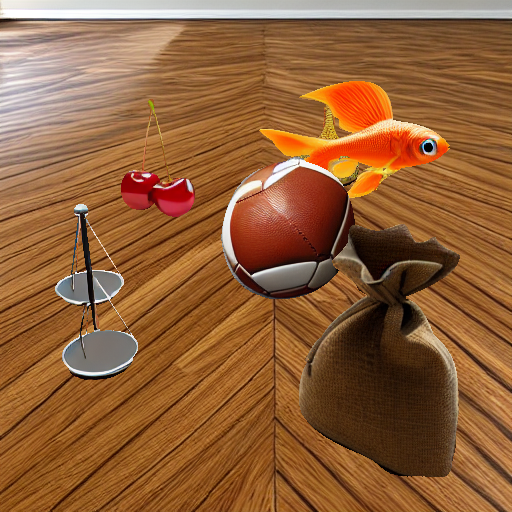

In [47]:
from IPython.display import display, Image

# Thay đường dẫn file của bạn vào đây
image_path = '/kaggle/input/tabletop-dataset/kaggle/working/tabletop_dataset/train/train_0000.png'
display(Image(filename=image_path))

In [46]:
!cat /kaggle/working/object_count_from_pseudo_masks.txt

train_0000.png	2
train_0001.png	1
train_0002.png	1
train_0003.png	2
train_0004.png	3
train_0005.png	4
train_0006.png	3
train_0007.png	2
train_0008.png	4
train_0009.png	3
train_0010.png	3
train_0011.png	3
train_0012.png	3
train_0013.png	3
train_0014.png	2
train_0015.png	2
train_0016.png	3
train_0017.png	3
train_0018.png	3
train_0019.png	3
train_0020.png	2
train_0021.png	3
train_0022.png	3
train_0023.png	2
train_0024.png	2
train_0025.png	3
train_0026.png	3
train_0027.png	3
train_0028.png	4
train_0029.png	3
train_0030.png	3
train_0031.png	4
train_0032.png	4
train_0033.png	2
train_0034.png	4
train_0035.png	4
train_0036.png	2
train_0037.png	3
train_0038.png	2
train_0039.png	2
train_0040.png	2
train_0041.png	2
train_0042.png	1
train_0043.png	1
train_0044.png	1
train_0045.png	2
train_0046.png	2
train_0047.png	1
train_0048.png	2
train_0049.png	2
train_0050.png	2
train_0051.png	2
train_0052.png	2
train_0053.png	2
train_0054.png	1
train_0055.png	2
train_0056.png	2
train_0057.png	2
train_0058.png

In [64]:
import importlib.util
import torch

spec = importlib.util.spec_from_file_location("u2net_module",
                                              "/kaggle/working/cobl/cobl/U2Net/u2net.py")
u2net_module = importlib.util.module_from_spec(spec)
spec.loader.exec_module(u2net_module)

U2NET = u2net_module.U2NET  # Lấy class U2NET


In [65]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model_path = "/kaggle/working/cobl/cobl/U2Net/u2net.pth"

u2net_model = U2NET(3, 1)
u2net_model.load_state_dict(torch.load(model_path, map_location=device))
u2net_model.to(device)
u2net_model.eval()


U2NET(
  (stage1): RSU7(
    (rebnconvin): REBNCONV(
      (conv_s1): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (bn_s1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu_s1): ReLU(inplace=True)
    )
    (rebnconv1): REBNCONV(
      (conv_s1): Conv2d(64, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (bn_s1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu_s1): ReLU(inplace=True)
    )
    (pool1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=True)
    (rebnconv2): REBNCONV(
      (conv_s1): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (bn_s1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu_s1): ReLU(inplace=True)
    )
    (pool2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=True)
    (rebnconv3): REBNCONV(
      (conv_s1): Conv2d(32, 32, k

In [67]:
import importlib.util
import torch

# Đường dẫn tới file u2net.py
u2net_path = "/kaggle/working/cobl/cobl/U2Net/u2net.py"

# Load module từ file
spec = importlib.util.spec_from_file_location("u2net_module", u2net_path)
u2net_module = importlib.util.module_from_spec(spec)
spec.loader.exec_module(u2net_module)

# Lấy class U2NET
U2NET = u2net_module.U2NET

# Khởi tạo model
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model_path = "/kaggle/working/cobl/cobl/U2Net/u2net.pth"

model = U2NET(3, 1)
model.load_state_dict(torch.load(model_path, map_location=device))
model.to(device)
model.eval()

print("✅ U2NET loaded successfully")


✅ U2NET loaded successfully


In [3]:
import os
import numpy as np
from skimage.io import imread
from pyspark import SparkContext
import torch
from torch import nn
from torchvision import transforms
from PIL import Image


In [4]:
def init_model():
    from u2net import U2NET
    model = U2NET(3,1)
    model.load_state_dict(torch.load("/kaggle/working/u2net.pth", map_location='cpu'))
    model.eval()
    return model


In [5]:
transform = transforms.Compose([
    transforms.ToTensor(),
])


In [6]:
def process_image_spark(image_path):
    try:
        # Mỗi worker khởi tạo model riêng
        model = init_model()
        
        # Load ảnh
        img = Image.open(image_path).convert('RGB')
        img_tensor = transform(img).unsqueeze(0)
        
        with torch.no_grad():
            mask_tensor = model(img_tensor)[0][0]
            mask = mask_tensor.numpy()
        
        # Đếm pixel > 0.5 (hoặc dùng connected component sau này)
        count_objects = np.sum(mask > 0.5)
        return (image_path, int(count_objects))
    except Exception as e:
        return (image_path, f"Error: {e}")


In [7]:
train_dir = "/kaggle/input/tabletop-dataset/kaggle/working/tabletop_dataset/train"
image_paths = [os.path.join(train_dir, f) for f in os.listdir(train_dir) if f.endswith(".png")]
print(f"Found {len(image_paths)} images")

sc = SparkContext.getOrCreate()


Found 1119 images


In [10]:
"""
Kaggle Spark Processing for U2Net Module
Xử lý phân tán dữ liệu ảnh với U2Net sử dụng PySpark
"""

# Cài đặt dependencies
!pip install torch torchvision pillow pyspark -q

import os
import numpy as np
from PIL import Image
import torch
import torch.nn as nn
from torchvision import transforms
from pyspark.sql import SparkSession
from pyspark.sql.functions import col, udf
from pyspark.sql.types import BinaryType, StringType
import io
import base64

# Khởi tạo Spark Session
spark = SparkSession.builder \
    .appName("U2Net Processing") \
    .config("spark.driver.memory", "4g") \
    .config("spark.executor.memory", "4g") \
    .getOrCreate()

print("Spark session initialized successfully!")

# U2Net Architecture Components
class REBNCONV(nn.Module):
    def __init__(self, in_ch=3, out_ch=3, dirate=1):
        super(REBNCONV, self).__init__()
        self.conv_s1 = nn.Conv2d(in_ch, out_ch, 3, padding=1*dirate, dilation=1*dirate)
        self.bn_s1 = nn.BatchNorm2d(out_ch)
        self.relu_s1 = nn.ReLU(inplace=True)

    def forward(self, x):
        return self.relu_s1(self.bn_s1(self.conv_s1(x)))

class RSU7(nn.Module):
    def __init__(self, in_ch=3, mid_ch=12, out_ch=3):
        super(RSU7, self).__init__()
        self.rebnconvin = REBNCONV(in_ch, out_ch, dirate=1)
        self.rebnconv1 = REBNCONV(out_ch, mid_ch, dirate=1)
        self.pool1 = nn.MaxPool2d(2, stride=2, ceil_mode=True)
        
        self.rebnconv2 = REBNCONV(mid_ch, mid_ch, dirate=1)
        self.pool2 = nn.MaxPool2d(2, stride=2, ceil_mode=True)
        
        self.rebnconv3 = REBNCONV(mid_ch, mid_ch, dirate=1)
        self.rebnconv4 = REBNCONV(mid_ch, mid_ch, dirate=2)
        
        self.rebnconv3d = REBNCONV(mid_ch*2, mid_ch, dirate=1)
        self.rebnconv2d = REBNCONV(mid_ch*2, mid_ch, dirate=1)
        self.rebnconv1d = REBNCONV(mid_ch*2, out_ch, dirate=1)

    def forward(self, x):
        hx = x
        hxin = self.rebnconvin(hx)
        
        hx1 = self.rebnconv1(hxin)
        hx = self.pool1(hx1)
        
        hx2 = self.rebnconv2(hx)
        hx = self.pool2(hx2)
        
        hx3 = self.rebnconv3(hx)
        hx4 = self.rebnconv4(hx3)
        
        hx3d = self.rebnconv3d(torch.cat((hx4, hx3), 1))
        hx3dup = nn.functional.interpolate(hx3d, size=hx2.shape[2:], mode='bilinear')
        
        hx2d = self.rebnconv2d(torch.cat((hx3dup, hx2), 1))
        hx2dup = nn.functional.interpolate(hx2d, size=hx1.shape[2:], mode='bilinear')
        
        hx1d = self.rebnconv1d(torch.cat((hx2dup, hx1), 1))
        
        return hx1d + hxin

# Simplified U2Net for demonstration
class U2NET_lite(nn.Module):
    def __init__(self, in_ch=3, out_ch=1):
        super(U2NET_lite, self).__init__()
        
        self.stage1 = RSU7(in_ch, 16, 64)
        self.pool12 = nn.MaxPool2d(2, stride=2, ceil_mode=True)
        
        self.stage2 = RSU7(64, 16, 64)
        self.pool23 = nn.MaxPool2d(2, stride=2, ceil_mode=True)
        
        self.stage3 = RSU7(64, 16, 64)
        
        self.stage3d = RSU7(128, 16, 64)
        self.stage2d = RSU7(128, 16, 64)
        self.stage1d = RSU7(128, 16, 64)
        
        self.side1 = nn.Conv2d(64, out_ch, 3, padding=1)
        
    def forward(self, x):
        hx = x
        
        # Encoder
        hx1 = self.stage1(hx)
        hx = self.pool12(hx1)
        
        hx2 = self.stage2(hx)
        hx = self.pool23(hx2)
        
        hx3 = self.stage3(hx)
        
        # Decoder
        hx3d = self.stage3d(torch.cat((hx3, hx3), 1))
        hx3dup = nn.functional.interpolate(hx3d, size=hx2.shape[2:], mode='bilinear')
        
        hx2d = self.stage2d(torch.cat((hx3dup, hx2), 1))
        hx2dup = nn.functional.interpolate(hx2d, size=hx1.shape[2:], mode='bilinear')
        
        hx1d = self.stage1d(torch.cat((hx2dup, hx1), 1))
        
        d1 = self.side1(hx1d)
        
        return torch.sigmoid(d1)

# Khởi tạo model
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = U2NET_lite(3, 1).to(device)
model.eval()
print(f"Model loaded on {device}")

# Transform cho preprocessing
transform = transforms.Compose([
    transforms.Resize((320, 320)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], 
                        std=[0.229, 0.224, 0.225])
])

# UDF để xử lý ảnh với U2Net
def process_image_with_u2net(image_bytes):
    """
    Xử lý ảnh với U2Net model
    """
    try:
        # Decode image
        image = Image.open(io.BytesIO(image_bytes)).convert('RGB')
        original_size = image.size
        
        # Preprocess
        img_tensor = transform(image).unsqueeze(0).to(device)
        
        # Inference
        with torch.no_grad():
            output = model(img_tensor)
        
        # Post-process
        pred = output.squeeze().cpu().numpy()
        pred = (pred * 255).astype(np.uint8)
        
        # Resize về kích thước gốc
        mask = Image.fromarray(pred).resize(original_size, Image.BILINEAR)
        
        # Convert to bytes
        img_byte_arr = io.BytesIO()
        mask.save(img_byte_arr, format='PNG')
        img_byte_arr = img_byte_arr.getvalue()
        
        return base64.b64encode(img_byte_arr).decode('utf-8')
    
    except Exception as e:
        print(f"Error processing image: {str(e)}")
        return None

# Register UDF
process_udf = udf(process_image_with_u2net, StringType())

# Ví dụ: Đọc và xử lý batch ảnh
def process_images_spark(input_path, output_path):
    """
    Xử lý batch ảnh với Spark và U2Net
    
    Args:
        input_path: Đường dẫn folder chứa ảnh
        output_path: Đường dẫn lưu kết quả
    """
    
    # Đọc ảnh binary
    df = spark.read.format("binaryFile") \
        .option("pathGlobFilter", "*.jpg,*.jpeg,*.png") \
        .load(input_path)
    
    print(f"Loaded {df.count()} images")
    
    # Áp dụng U2Net processing
    result_df = df.withColumn("mask", process_udf(col("content")))
    
    # Lưu kết quả
    result_df.select("path", "mask") \
        .write.mode("overwrite") \
        .parquet(output_path)
    
    print(f"Results saved to {output_path}")
    
    return result_df

# Ví dụ sử dụng với sample data
def create_sample_images():
    """Tạo ảnh mẫu để test"""
    sample_dir = "/kaggle/working/sample_images"
    os.makedirs(sample_dir, exist_ok=True)
    
    for i in range(5):
        # Tạo ảnh random
        img = Image.fromarray(np.random.randint(0, 255, (256, 256, 3), dtype=np.uint8))
        img.save(f"{sample_dir}/sample_{i}.jpg")
    
    print(f"Created 5 sample images in {sample_dir}")
    return sample_dir

# Main execution
if __name__ == "__main__":
    # Tạo sample data
    input_dir = create_sample_images()
    output_dir = "/kaggle/working/u2net_results"
    
    # Xử lý với Spark
    print("\nProcessing images with Spark + U2Net...")
    result_df = process_images_spark(input_dir, output_dir)
    
    # Hiển thị kết quả
    print("\nProcessing completed!")
    result_df.select("path").show(truncate=False)
    
    # Cleanup
    spark.stop()
    print("Spark session stopped")

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 5.2 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 110.6 MB/s eta 0:00:0000:010:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 85.3 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 46.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.2 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 7.7 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 32.2 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 14.7 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 9.0 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 90.0 MB/s eta 0:00:00:00:0100:01
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed

Results saved to /kaggle/working/u2net_results

Processing completed!
+----+
|path|
+----+
+----+

Spark session stopped


In [1]:
!pip install mrjob

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 439.6/439.6 kB 9.2 MB/s eta 0:00:00ta 0:00:01


In [27]:
# ============================================================================
# HADOOP MAPREDUCE FOR U2NET - STANDALONE MODULE
# Input: Images + Trained U2Net model
# Output: Final masks after distributed processing
# ============================================================================

import sys
sys.path.insert(0, '/kaggle/working/cobl')
import os
import glob
import torch
import torch.nn as nn
import numpy as np
from PIL import Image
from datetime import datetime
from skimage import io, transform
import cv2
from tqdm import tqdm
import json
from tabulate import tabulate
import shutil
import warnings
warnings.filterwarnings('ignore')

# ============================================================================
# CONFIGURATION
# ============================================================================
class MapReduceConfig:
    """Cấu hình MapReduce"""
    
    def __init__(self):
        # === INPUT ===
        self.model_path = '/kaggle/working/cobl/cobl/U2Net/u2net.pth'  # Path đến trained model
        self.input_images_dir = '/kaggle/input/tabletop-dataset/kaggle/working/tabletop_dataset/train'  # Input images
        
        # === OUTPUT ===
        timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
        self.output_base_dir = f'/kaggle/working/mapreduce_output_{timestamp}'
        self.intermediate_dir = f'{self.output_base_dir}/intermediate'
        self.final_masks_dir = f'{self.output_base_dir}/final_masks'
        self.logs_dir = f'{self.output_base_dir}/logs'
        
        # === MAPREDUCE PARAMS ===
        self.num_mappers = 4  # Số lượng mapper (chia images thành bao nhiêu batch)
        self.num_reducers = 2  # Số lượng reducer
        self.images_per_mapper = None  # None = tự động chia đều
        
        # === PROCESSING PARAMS ===
        self.img_size = 320
        self.use_otsu_threshold = True  # True = OTSU adaptive, False = fixed threshold
        self.fixed_threshold = 0.5  # Chỉ dùng nếu use_otsu_threshold = False
        
        # === MULTI-SCALE FUSION ===
        self.fusion_weights = [0.5, 0.1, 0.1, 0.1, 0.05, 0.05, 0.1]  # Weights cho d0-d6
        self.save_all_scales = True  # Lưu cả d0-d6 riêng lẻ hay chỉ fused?
        
        # === PERFORMANCE ===
        self.batch_processing = True  # Process multiple images at once
        self.batch_size = 8
    
    def create_dirs(self):
        """Tạo thư mục output"""
        os.makedirs(self.intermediate_dir, exist_ok=True)
        os.makedirs(self.final_masks_dir, exist_ok=True)
        os.makedirs(self.logs_dir, exist_ok=True)
        
        # Create mapper subdirs
        for i in range(self.num_mappers):
            os.makedirs(f'{self.intermediate_dir}/mapper_{i}', exist_ok=True)
    
    def save_config(self):
        """Lưu config"""
        config_dict = {k: v for k, v in self.__dict__.items() if not k.startswith('_')}
        with open(f'{self.output_base_dir}/config.json', 'w') as f:
            json.dump(config_dict, f, indent=2)

# ============================================================================
# MULTI-SCALE FUSION
# ============================================================================
class MultiScaleFusion(nn.Module):
    """Fusion d0-d6 thành mask tốt nhất"""
    
    def __init__(self, weights=None):
        super().__init__()
        if weights is None:
            weights = [0.5, 0.1, 0.1, 0.1, 0.05, 0.05, 0.1]
        self.register_buffer('weights', torch.tensor(weights, dtype=torch.float32))
    
    def forward(self, d0, d1, d2, d3, d4, d5, d6):
        outputs = torch.stack([d0, d1, d2, d3, d4, d5, d6], dim=0)
        weights = self.weights.view(7, 1, 1, 1, 1)
        fused = (outputs * weights).sum(dim=0)
        return torch.clamp(fused, 0, 1)

# ============================================================================
# IMAGE PREPROCESSING
# ============================================================================
def preprocess_image(img_path, img_size=320):
    """
    Preprocess image cho U2Net
    Returns: tensor [1, 3, H, W], original_size
    """
    img = io.imread(img_path).astype(np.float32)
    
    if len(img.shape) == 2:
        img = np.stack([img]*3, -1)
    elif img.shape[2] == 4:
        img = img[:,:,:3]
    
    orig_size = img.shape[:2]
    
    # Resize
    img = transform.resize(img, (img_size, img_size), mode='constant', anti_aliasing=True)
    img = np.clip(img / (img.max() + 1e-6), 0, 1)
    
    # Normalize
    tmp = np.zeros((img_size, img_size, 3), np.float32)
    tmp[:,:,0] = (img[:,:,0] - 0.485) / 0.229
    tmp[:,:,1] = (img[:,:,1] - 0.456) / 0.224
    tmp[:,:,2] = (img[:,:,2] - 0.406) / 0.225
    tmp = np.clip(tmp, -10, 10)
    
    tensor = torch.from_numpy(tmp).permute(2,0,1).unsqueeze(0).float()
    
    return tensor, orig_size

# ============================================================================
# POST-PROCESSING
# ============================================================================
def postprocess_mask(mask, orig_size, use_otsu=True, threshold=0.5):
    """
    Post-process mask: threshold + resize
    Args:
        mask: numpy array [H, W], range [0, 1]
        orig_size: (H, W) original image size
        use_otsu: bool
        threshold: float (only used if use_otsu=False)
    Returns:
        PIL Image (binary mask)
    """
    # Normalize
    mask = np.clip(mask, 0, 1)
    mask = (mask - mask.min()) / (mask.max() - mask.min() + 1e-6)
    
    # Threshold
    mask_u8 = (mask * 255).astype(np.uint8)
    
    if use_otsu:
        _, mask_bin = cv2.threshold(mask_u8, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    else:
        _, mask_bin = cv2.threshold(mask_u8, int(threshold * 255), 255, cv2.THRESH_BINARY)
    
    # Optional: morphology cleaning
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3, 3))
    mask_bin = cv2.morphologyEx(mask_bin, cv2.MORPH_CLOSE, kernel)
    
    # Resize to original
    mask_img = Image.fromarray(mask_bin)
    mask_img = mask_img.resize(orig_size[::-1], Image.NEAREST)
    
    return mask_img

# ============================================================================
# MAPPER
# ============================================================================
class Mapper:
    """
    Mapper: Process batch of images
    Input: list of image paths
    Output: intermediate results (d0-d6 + fused + metadata)
    """
    
    def __init__(self, mapper_id, model, fusion, config, device):
        self.mapper_id = mapper_id
        self.model = model
        self.fusion = fusion
        self.config = config
        self.device = device
        self.output_dir = f'{config.intermediate_dir}/mapper_{mapper_id}'
    
    def process_single(self, img_path):
        """Process 1 ảnh"""
        # Preprocess
        img_tensor, orig_size = preprocess_image(img_path, self.config.img_size)
        img_tensor = img_tensor.to(self.device)
        
        # Inference
        with torch.no_grad():
            d0, d1, d2, d3, d4, d5, d6 = self.model(img_tensor)
            fused = self.fusion(d0, d1, d2, d3, d4, d5, d6)
        
        # Convert to numpy
        results = {
            'd0': d0[0, 0].cpu().numpy(),
            'd1': d1[0, 0].cpu().numpy(),
            'd2': d2[0, 0].cpu().numpy(),
            'd3': d3[0, 0].cpu().numpy(),
            'd4': d4[0, 0].cpu().numpy(),
            'd5': d5[0, 0].cpu().numpy(),
            'd6': d6[0, 0].cpu().numpy(),
            'fused': fused[0, 0].cpu().numpy(),
            'orig_size': orig_size,
            'img_path': img_path
        }
        
        return results
    
    def run(self, img_paths):
        """Run mapper trên list images"""
        print(f"\n{'='*80}")
        print(f"📤 MAPPER {self.mapper_id}: Processing {len(img_paths)} images")
        print(f"{'='*80}")
        
        mapper_results = []
        
        for img_path in tqdm(img_paths, desc=f"Mapper {self.mapper_id}"):
            try:
                results = self.process_single(img_path)
                
                # Save intermediate
                img_name = os.path.basename(img_path)
                intermediate_file = f'{self.output_dir}/{img_name}.npz'
                
                np.savez_compressed(
                    intermediate_file,
                    d0=results['d0'],
                    d1=results['d1'],
                    d2=results['d2'],
                    d3=results['d3'],
                    d4=results['d4'],
                    d5=results['d5'],
                    d6=results['d6'],
                    fused=results['fused'],
                    orig_size=results['orig_size']
                )
                
                # Emit (key, value)
                mapper_results.append((img_name, intermediate_file))
                
            except Exception as e:
                print(f"❌ Error processing {os.path.basename(img_path)}: {e}")
        
        print(f"✅ Mapper {self.mapper_id} complete: {len(mapper_results)} results")
        
        # Save mapper log
        with open(f'{self.config.logs_dir}/mapper_{self.mapper_id}.json', 'w') as f:
            json.dump({
                'mapper_id': self.mapper_id,
                'total_processed': len(mapper_results),
                'results': [(k, v) for k, v in mapper_results]
            }, f, indent=2)
        
        return mapper_results

# ============================================================================
# REDUCER
# ============================================================================
class Reducer:
    """
    Reducer: Aggregate intermediate results → final masks
    """
    
    def __init__(self, reducer_id, config):
        self.reducer_id = reducer_id
        self.config = config
    
    def run(self, intermediate_data):
        """
        Run reducer
        Args:
            intermediate_data: list of (key, intermediate_file_path)
        """
        print(f"\n{'='*80}")
        print(f"📥 REDUCER {self.reducer_id}: Processing {len(intermediate_data)} files")
        print(f"{'='*80}")
        
        reducer_results = []
        
        for key, inter_file in tqdm(intermediate_data, desc=f"Reducer {self.reducer_id}"):
            try:
                # Load intermediate
                data = np.load(inter_file)
                fused = data['fused']
                orig_size = tuple(data['orig_size'])
                
                # Post-process
                final_mask = postprocess_mask(
                    fused, 
                    orig_size, 
                    self.config.use_otsu_threshold,
                    self.config.fixed_threshold
                )
                
                # Save final mask
                output_path = f'{self.config.final_masks_dir}/{key}'
                final_mask.save(output_path)
                
                # Optional: Save all scales separately
                if self.config.save_all_scales:
                    scales_dir = f'{self.config.final_masks_dir}/all_scales'
                    os.makedirs(scales_dir, exist_ok=True)
                    
                    for scale_name in ['d0', 'd1', 'd2', 'd3', 'd4', 'd5', 'd6']:
                        scale_data = data[scale_name]
                        scale_mask = postprocess_mask(
                            scale_data,
                            orig_size,
                            self.config.use_otsu_threshold,
                            self.config.fixed_threshold
                        )
                        scale_mask.save(f'{scales_dir}/{key.replace(".png", "")}_{scale_name}.png')
                
                reducer_results.append(key)
                
            except Exception as e:
                print(f"❌ Error processing {key}: {e}")
        
        print(f"✅ Reducer {self.reducer_id} complete: {len(reducer_results)} masks saved")
        
        # Save reducer log
        with open(f'{self.config.logs_dir}/reducer_{self.reducer_id}.json', 'w') as f:
            json.dump({
                'reducer_id': self.reducer_id,
                'total_processed': len(reducer_results),
                'output_files': reducer_results
            }, f, indent=2)
        
        return reducer_results

# ============================================================================
# MAPREDUCE COORDINATOR
# ============================================================================
class MapReduceCoordinator:
    """Điều phối toàn bộ MapReduce pipeline"""
    
    def __init__(self, config):
        self.config = config
        self.device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
        
        print("="*80)
        print("🗺️ HADOOP MAPREDUCE FOR U2NET")
        print("="*80)
        print(f"Device: {self.device}")
        print(f"Output: {config.output_base_dir}")
    
    def load_model(self):
        """Load trained U2Net model"""
        print("\n📥 Loading model...")
        
        # Import U2Net
        import importlib.util
        spec = importlib.util.spec_from_file_location(
            "u2net", 
            "/kaggle/working/cobl/cobl/U2Net/u2net.py"
        )
        u2net_module = importlib.util.module_from_spec(spec)
        spec.loader.exec_module(u2net_module)
        U2NET = u2net_module.U2NET
        
        # Load model
        model = U2NET(3, 1)
        checkpoint = torch.load(self.config.model_path, map_location='cpu')
        
        if isinstance(checkpoint, dict) and 'model' in checkpoint:
            model.load_state_dict(checkpoint['model'])
        else:
            model.load_state_dict(checkpoint)
        
        model = model.to(self.device)
        model.eval()
        
        # Load fusion
        fusion = MultiScaleFusion(self.config.fusion_weights).to(self.device)
        if isinstance(checkpoint, dict) and 'fusion' in checkpoint:
            fusion.load_state_dict(checkpoint['fusion'])
        
        print(f"✅ Model loaded from: {self.config.model_path}")
        
        return model, fusion
    
    def load_images(self):
        """Load input images"""
        print("\n📦 Loading input images...")
        
        exts = ['*.png', '*.jpg', '*.jpeg', '*.bmp', '*.tif']
        images = []
        for ext in exts:
            images.extend(glob.glob(os.path.join(self.config.input_images_dir, ext)))
        
        images = sorted(images)
        print(f"✅ Found {len(images)} images")
        
        return images
    
    def split_for_mappers(self, images):
        """Chia images cho các mapper"""
        if self.config.images_per_mapper is None:
            # Chia đều
            chunk_size = (len(images) + self.config.num_mappers - 1) // self.config.num_mappers
        else:
            chunk_size = self.config.images_per_mapper
        
        chunks = []
        for i in range(self.config.num_mappers):
            start = i * chunk_size
            end = min((i + 1) * chunk_size, len(images))
            if start < len(images):
                chunks.append(images[start:end])
        
        return chunks
    
    def shuffle_and_sort(self, mapper_outputs):
        """Shuffle & Sort phase: Phân chia cho reducers"""
        print("\n🔀 SHUFFLE & SORT PHASE")
        
        reducer_buckets = [[] for _ in range(self.config.num_reducers)]
        
        # Hash partitioning
        for key, value in mapper_outputs:
            reducer_id = hash(key) % self.config.num_reducers
            reducer_buckets[reducer_id].append((key, value))
        
        # Print distribution
        table_data = [['Reducer ID', 'Number of Files']]
        for i, bucket in enumerate(reducer_buckets):
            table_data.append([f'Reducer {i}', len(bucket)])
        
        print(tabulate(table_data, headers='firstrow', tablefmt='grid'))
        
        return reducer_buckets
    
    def run(self):
        """Chạy toàn bộ pipeline"""
        start_time = datetime.now()
        
        # Setup
        self.config.create_dirs()
        self.config.save_config()
        
        # Load model
        model, fusion = self.load_model()
        
        # Load images
        images = self.load_images()
        
        if len(images) == 0:
            print("❌ No images found!")
            return
        
        # === MAP PHASE ===
        print("\n" + "="*80)
        print("📤 MAP PHASE")
        print("="*80)
        
        mapper_chunks = self.split_for_mappers(images)
        all_mapper_results = []
        
        for i, chunk in enumerate(mapper_chunks):
            mapper = Mapper(i, model, fusion, self.config, self.device)
            results = mapper.run(chunk)
            all_mapper_results.extend(results)
        
        print(f"\n✅ Map phase complete: {len(all_mapper_results)} intermediate files")
        
        # === SHUFFLE & SORT ===
        reducer_buckets = self.shuffle_and_sort(all_mapper_results)
        
        # === REDUCE PHASE ===
        print("\n" + "="*80)
        print("📥 REDUCE PHASE")
        print("="*80)
        
        all_reducer_results = []
        
        for i, bucket in enumerate(reducer_buckets):
            if len(bucket) > 0:
                reducer = Reducer(i, self.config)
                results = reducer.run(bucket)
                all_reducer_results.extend(results)
        
        print(f"\n✅ Reduce phase complete: {len(all_reducer_results)} final masks")
        
        # === SUMMARY ===
        end_time = datetime.now()
        duration = (end_time - start_time).total_seconds()
        
        print("\n" + "="*80)
        print("📊 MAPREDUCE SUMMARY")
        print("="*80)
        
        summary = [
            ['Metric', 'Value'],
            ['Total Images', len(images)],
            ['Mappers Used', len(mapper_chunks)],
            ['Reducers Used', self.config.num_reducers],
            ['Final Masks', len(all_reducer_results)],
            ['Processing Time', f'{duration:.2f}s'],
            ['Avg Time/Image', f'{duration/len(images):.3f}s'],
            ['Output Directory', self.config.final_masks_dir],
        ]
        
        print(tabulate(summary, headers='firstrow', tablefmt='grid'))
        
        # Save summary
        with open(f'{self.config.output_base_dir}/summary.json', 'w') as f:
            json.dump({
                'total_images': len(images),
                'num_mappers': len(mapper_chunks),
                'num_reducers': self.config.num_reducers,
                'final_masks': len(all_reducer_results),
                'processing_time_seconds': duration,
                'output_dir': self.config.final_masks_dir
            }, f, indent=2)
        
        print(f"\n🎉 MapReduce Complete!")
        print(f"📁 Final masks: {self.config.final_masks_dir}")
        print("="*80)

# ============================================================================
# MAIN EXECUTION
# ============================================================================
if __name__ == "__main__":
    # Khởi tạo config
    config = MapReduceConfig()
    
    # QUAN TRỌNG: Cập nhật paths
    print("⚠️ Cập nhật config trước khi chạy:")
    print(f"   Model path: {config.model_path}")
    print(f"   Input dir: {config.input_images_dir}")
    print()
    
    # Run MapReduce
    coordinator = MapReduceCoordinator(config)
    coordinator.run()

⚠️ Cập nhật config trước khi chạy:
   Model path: /kaggle/working/cobl/cobl/U2Net/u2net.pth
   Input dir: /kaggle/input/tabletop-dataset/kaggle/working/tabletop_dataset/train

🗺️ HADOOP MAPREDUCE FOR U2NET
Device: cuda
Output: /kaggle/working/mapreduce_output_20251228_042723

📥 Loading model...
✅ Model loaded from: /kaggle/working/cobl/cobl/U2Net/u2net.pth

📦 Loading input images...
✅ Found 1119 images

📤 MAP PHASE

📤 MAPPER 0: Processing 280 images


Mapper 0: 100%|██████████| 280/280 [01:22<00:00,  3.40it/s]


✅ Mapper 0 complete: 280 results

📤 MAPPER 1: Processing 280 images


Mapper 1: 100%|██████████| 280/280 [01:20<00:00,  3.48it/s]


✅ Mapper 1 complete: 280 results

📤 MAPPER 2: Processing 280 images


Mapper 2: 100%|██████████| 280/280 [01:20<00:00,  3.47it/s]


✅ Mapper 2 complete: 280 results

📤 MAPPER 3: Processing 279 images


Mapper 3: 100%|██████████| 279/279 [01:20<00:00,  3.45it/s]


✅ Mapper 3 complete: 279 results

✅ Map phase complete: 1119 intermediate files

🔀 SHUFFLE & SORT PHASE
+--------------+-------------------+
| Reducer ID   |   Number of Files |
+==============+===================+
| Reducer 0    |               562 |
+--------------+-------------------+
| Reducer 1    |               557 |
+--------------+-------------------+

📥 REDUCE PHASE

📥 REDUCER 0: Processing 562 files


Reducer 0: 100%|██████████| 562/562 [00:30<00:00, 18.26it/s]


✅ Reducer 0 complete: 562 masks saved

📥 REDUCER 1: Processing 557 files


Reducer 1: 100%|██████████| 557/557 [00:30<00:00, 18.32it/s]

✅ Reducer 1 complete: 557 masks saved

✅ Reduce phase complete: 1119 final masks

📊 MAPREDUCE SUMMARY
+------------------+--------------------------------------------------------------+
| Metric           | Value                                                        |
+==================+==============================================================+
| Total Images     | 1119                                                         |
+------------------+--------------------------------------------------------------+
| Mappers Used     | 4                                                            |
+------------------+--------------------------------------------------------------+
| Reducers Used    | 2                                                            |
+------------------+--------------------------------------------------------------+
| Final Masks      | 1119                                                         |
+------------------+--------------------------------------

In [28]:
import os

# Đường dẫn từ thông báo của bạn
mask_dir = '/kaggle/working/mapreduce_output_20251228_042723/final_masks'

if os.path.exists(mask_dir):
    files = sorted(os.listdir(mask_dir))
    print(f"✅ Tổng số tệp Mask: {len(files)}")
    print("📋 10 tệp đầu tiên:")
    for f in files[:10]:
        print(f" - {f}")
else:
    print("❌ Đường dẫn không tồn tại. Hãy kiểm tra lại thư mục!")

✅ Tổng số tệp Mask: 1120
📋 10 tệp đầu tiên:
 - all_scales
 - train_0000.png
 - train_0001.png
 - train_0002.png
 - train_0003.png
 - train_0004.png
 - train_0005.png
 - train_0006.png
 - train_0007.png
 - train_0008.png


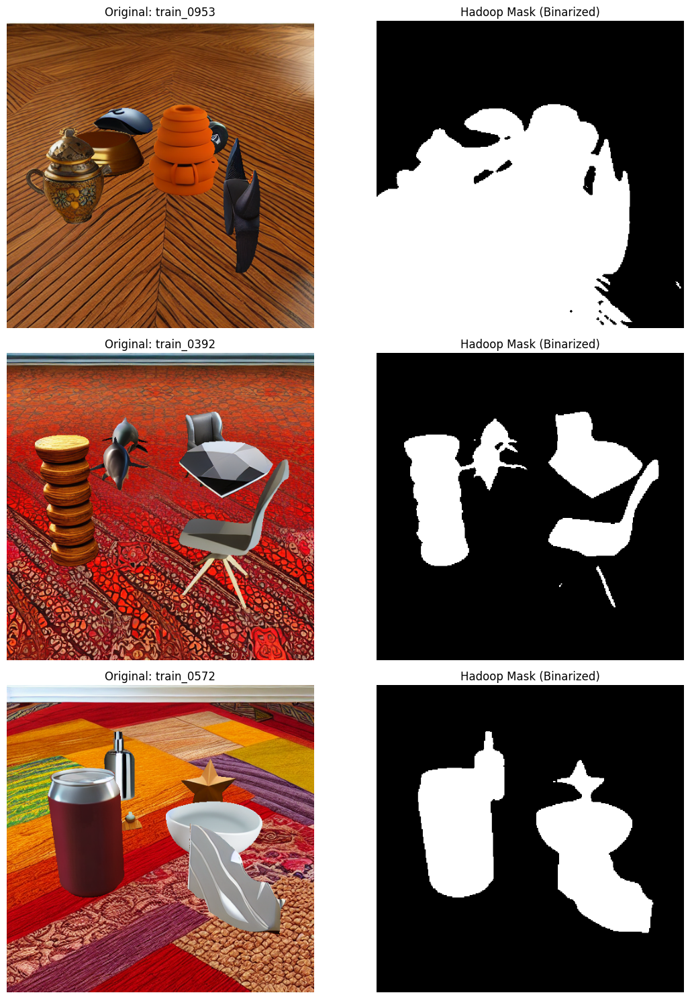

In [30]:
import matplotlib.pyplot as plt
from PIL import Image
import os
import random

# Đường dẫn từ kết quả của bạn
mask_dir = '/kaggle/working/mapreduce_output_20251228_042723/final_masks'
input_dir = '/kaggle/input/tabletop-dataset/kaggle/working/tabletop_dataset/train'

# Lấy danh sách tệp .png (loại bỏ thư mục con như all_scales nếu có)
mask_files = [f for f in os.listdir(mask_dir) if f.endswith('.png')]

# Chọn ngẫu nhiên 3 ảnh để kiểm tra
samples = random.sample(mask_files, min(3, len(mask_files)))

fig, axes = plt.subplots(len(samples), 2, figsize=(12, 5 * len(samples)))

for i, m_name in enumerate(samples):
    # 1. Đường dẫn ảnh Mask
    m_path = os.path.join(mask_dir, m_name)
    
    # 2. Tìm ảnh gốc tương ứng (thử .jpg hoặc .png)
    base_name = m_name.replace('.png', '')
    img_path = os.path.join(input_dir, base_name + ".jpg")
    if not os.path.exists(img_path):
        img_path = os.path.join(input_dir, base_name + ".png")
    
    # Hiển thị ảnh gốc
    if os.path.exists(img_path):
        axes[i, 0].imshow(Image.open(img_path))
        axes[i, 0].set_title(f"Original: {base_name}")
    axes[i, 0].axis('off')
    
    # Hiển thị Mask (Kết quả từ Hadoop)
    axes[i, 1].imshow(Image.open(m_path), cmap='gray')
    axes[i, 1].set_title(f"Hadoop Mask (Binarized)")
    axes[i, 1].axis('off')

plt.tight_layout()
plt.show()

In [ ]:
# ============================================================================
# U2NET UNIVERSAL TRAINING PIPELINE
# Hỗ trợ nhiều loại dataset: có/không có mask, train/val/test split
# ============================================================================

import sys
sys.path.insert(0, '/kaggle/working/cobl')
import os
import glob
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset, random_split
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
from datetime import datetime
import json
from skimage import io, transform
import cv2
from tqdm import tqdm
import warnings
import pandas as pd
from tabulate import tabulate
warnings.filterwarnings('ignore')

# ============================================================================
# DATASET CONFIGURATION - THAY ĐỔI CHỖ NÀY
# ============================================================================
class DatasetConfig:
    """Cấu hình dataset - CHỈNH CHỖ NÀY CHO DATASET MỚI"""
    
    def __init__(self):
        # === THÔNG TIN CƠ BẢN ===
        self.dataset_name = 'tabletop'
        
        # === ĐƯỜNG DẪN DỮ LIỆU ===
        # Có 3 trường hợp:
        
        # CASE 1: Dataset có train/test, KHÔNG CÓ MASK
        #self.train_img_dir = '/kaggle/input/tabletop-dataset/kaggle/working/tabletop_dataset/train/'
        #self.test_img_dir = '/kaggle/input/tabletop-dataset/kaggle/working/tabletop_dataset/test/'
        #self.train_mask_dir = None  # None = tự động tạo pseudo labels
        #self.test_mask_dir = None
        
        # CASE 2: Dataset có train/test VÀ CÓ MASK SẴN
        # self.train_img_dir = '/kaggle/input/your-dataset/images/train/'
        # self.train_mask_dir = '/kaggle/input/your-dataset/masks/train/'
        # self.test_img_dir = '/kaggle/input/your-dataset/images/test/'
        # self.test_mask_dir = '/kaggle/input/your-dataset/masks/test/'
        
        # CASE 3: Dataset chỉ có 1 folder images + masks
        # self.train_img_dir = '/kaggle/input/your-dataset/images/'
        # self.train_mask_dir = '/kaggle/input/your-dataset/masks/'
        # self.test_img_dir = None  # None = sẽ tự động split
        # self.test_mask_dir = None
        
        # === TRAINING PARAMS ===
        self.epochs = 20
        self.batch_size = 4
        self.lr = 0.0005
        self.img_size = 320
        self.val_split = 0.15  # 15% cho validation
        self.test_split = 0.15  # 15% cho test (nếu không có test folder)
        
        # === PSEUDO LABEL PARAMS (nếu không có mask) ===
        self.pseudo_threshold = 0.3
        self.use_otsu = True  # Dùng OTSU thay vì threshold cố định
        
        # === LOSS WEIGHTS ===
        self.bce_weight = 1.0
        self.dice_weight = 2.0
        self.iou_weight = 0.5
        
        # === EARLY STOPPING ===
        self.patience = 5
        
        # === OUTPUT ===
        timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
        self.base_dir = f'/kaggle/working/experiments/{self.dataset_name}_{timestamp}'

# ============================================================================
# SETUP
# ============================================================================
print("="*80)
print("🚀 U2NET UNIVERSAL TRAINING PIPELINE")
print("="*80)

if torch.cuda.is_available():
    torch.cuda.empty_cache()
    import gc
    gc.collect()

# Import U2Net
import importlib.util
spec = importlib.util.spec_from_file_location("u2net", "/kaggle/working/cobl/cobl/U2Net/u2net.py")
u2net_module = importlib.util.module_from_spec(spec)
spec.loader.exec_module(u2net_module)
U2NET = u2net_module.U2NET

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"✅ Device: {device}")

# Load config
config = DatasetConfig()

# Create directories
os.makedirs(f'{config.base_dir}/checkpoints', exist_ok=True)
os.makedirs(f'{config.base_dir}/outputs', exist_ok=True)
os.makedirs(f'{config.base_dir}/results', exist_ok=True)
os.makedirs(f'{config.base_dir}/pseudo_labels/train', exist_ok=True)
os.makedirs(f'{config.base_dir}/pseudo_labels/test', exist_ok=True)

print(f"📂 Experiment dir: {config.base_dir}")

# ============================================================================
# METRICS & LOSS
# ============================================================================
def dice_coefficient(pred, target, smooth=1.0):
    pred = pred.view(-1)
    target = target.view(-1)
    intersection = (pred * target).sum()
    return (2. * intersection + smooth) / (pred.sum() + target.sum() + smooth)

class DiceLoss(nn.Module):
    def __init__(self, smooth=1.0):
        super().__init__()
        self.smooth = smooth
    
    def forward(self, pred, target):
        pred_flat = pred.contiguous().view(-1)
        target_flat = target.contiguous().view(-1)
        intersection = (pred_flat * target_flat).sum()
        dice = (2. * intersection + self.smooth) / (pred_flat.sum() + target_flat.sum() + self.smooth)
        return 1 - dice

class CombinedLoss(nn.Module):
    def __init__(self, bce_w, dice_w, iou_w):
        super().__init__()
        self.bce_w = bce_w
        self.dice_w = dice_w
        self.iou_w = iou_w
        self.bce = nn.BCELoss()
        self.dice = DiceLoss()
    
    def iou_loss(self, pred, target):
        intersection = (pred * target).sum()
        union = pred.sum() + target.sum() - intersection
        return 1 - (intersection + 1.0) / (union + 1.0)
    
    def forward(self, d0, d1, d2, d3, d4, d5, d6, labels):
        outputs = [torch.clamp(x, 1e-7, 1.0 - 1e-7) for x in [d0, d1, d2, d3, d4, d5, d6]]
        d0, d1, d2, d3, d4, d5, d6 = outputs
        
        bce_total = sum([self.bce(d, labels) for d in outputs])
        dice_total = sum([self.dice(d, labels) for d in outputs])
        iou = self.iou_loss(d0, labels)
        
        total = self.bce_w * bce_total + self.dice_w * dice_total + self.iou_w * iou
        
        return total, bce_total/7, dice_total/7, iou

# ============================================================================
# DATASET
# ============================================================================
class FlexibleDataset(Dataset):
    def __init__(self, img_list, mask_list, size=320, aug=False):
        self.imgs = [p for p in img_list if os.path.exists(p)]
        self.masks = [p for p in mask_list if os.path.exists(p)]
        assert len(self.imgs) == len(self.masks), f"Mismatch: {len(self.imgs)} images vs {len(self.masks)} masks"
        self.size = size
        self.aug = aug
    
    def __len__(self):
        return len(self.imgs)
    
    def __getitem__(self, i):
        img = io.imread(self.imgs[i]).astype(np.float32)
        if len(img.shape) == 2:
            img = np.stack([img]*3, -1)
        elif img.shape[2] == 4:
            img = img[:,:,:3]
        
        mask = io.imread(self.masks[i]).astype(np.float32)
        if len(mask.shape) == 3:
            mask = mask[:,:,0]
        
        img = transform.resize(img, (self.size, self.size), mode='constant')
        mask = transform.resize(mask, (self.size, self.size), mode='constant', order=0)
        
        if self.aug and np.random.rand() > 0.5:
            img = np.fliplr(img).copy()
            mask = np.fliplr(mask).copy()
        
        img = np.clip(img / (img.max() + 1e-6), 0, 1)
        tmp = np.zeros((self.size, self.size, 3), np.float32)
        tmp[:,:,0] = (img[:,:,0] - 0.485) / 0.229
        tmp[:,:,1] = (img[:,:,1] - 0.456) / 0.224
        tmp[:,:,2] = (img[:,:,2] - 0.406) / 0.225
        tmp = np.clip(tmp, -10, 10)
        
        mask = np.clip(mask / 255.0 if mask.max() > 1 else mask, 0, 1)
        
        if np.isnan(tmp).any() or np.isinf(tmp).any():
            tmp = np.nan_to_num(tmp, 0)
        if np.isnan(mask).any() or np.isinf(mask).any():
            mask = np.nan_to_num(mask, 0)
        
        img_t = torch.from_numpy(tmp).permute(2,0,1).float()
        mask_t = torch.from_numpy(mask).unsqueeze(0).float()
        
        return {'image': img_t, 'label': mask_t}

# ============================================================================
# LOAD DATA
# ============================================================================
print("\n" + "="*80)
print("📦 LOADING DATA")
print("="*80)

def load_images(img_dir):
    """Load images từ thư mục"""
    if img_dir is None or not os.path.exists(img_dir):
        return []
    exts = ['*.png', '*.jpg', '*.jpeg', '*.bmp', '*.tif', '*.tiff']
    imgs = []
    for ext in exts:
        imgs.extend(glob.glob(os.path.join(img_dir, ext)))
    return sorted(imgs)

train_imgs = load_images(config.train_img_dir)
test_imgs = load_images(config.test_img_dir)

print(f"📸 Found {len(train_imgs)} train images")
print(f"📸 Found {len(test_imgs)} test images")

# Check if masks exist
has_train_masks = config.train_mask_dir is not None and os.path.exists(config.train_mask_dir)
has_test_masks = config.test_mask_dir is not None and os.path.exists(config.test_mask_dir)

if has_train_masks:
    train_masks = load_images(config.train_mask_dir)
    print(f"✅ Found {len(train_masks)} train masks (using existing masks)")
else:
    train_masks = []
    print(f"⚠️ No train masks found (will create pseudo labels)")

if has_test_masks:
    test_masks = load_images(config.test_mask_dir)
    print(f"✅ Found {len(test_masks)} test masks (using existing masks)")
else:
    test_masks = []
    print(f"⚠️ No test masks found (will create pseudo labels)")

# ============================================================================
# DOWNLOAD PRETRAINED MODEL
# ============================================================================
print("\n" + "="*80)
print("📥 PRETRAINED MODEL")
print("="*80)

model_path = '/kaggle/working/cobl/cobl/U2Net/u2net.pth'
if not os.path.exists(model_path):
    print("Downloading pretrained U2Net...")
    os.makedirs(os.path.dirname(model_path), exist_ok=True)
    import subprocess
    url = 'https://www.dropbox.com/scl/fi/obpwapfgjl6gwmmwpc1le/u2net.pth?rlkey=0q0dqx17fk9yve3ve98ws9zy9&st=z6uuzf1c&dl=1'
    subprocess.run(['curl', '-L', '-o', model_path, url], check=True)
print(f"✅ Model ready: {model_path}")

# ============================================================================
# CREATE PSEUDO LABELS (if needed)
# ============================================================================
if not has_train_masks or not has_test_masks:
    print("\n" + "="*80)
    print("📝 CREATING PSEUDO LABELS")
    print("="*80)
    
    pretrained = U2NET(3, 1)
    state = torch.load(model_path, map_location='cpu')
    pretrained.load_state_dict(state)
    pretrained = pretrained.to(device)
    pretrained.eval()
    
    def create_pseudo_label(model, img_path, save_path):
        img = io.imread(img_path).astype(np.float32)
        if len(img.shape) == 2:
            img = np.stack([img]*3, -1)
        elif img.shape[2] == 4:
            img = img[:,:,:3]
        
        orig_size = img.shape[:2]
        img = transform.resize(img, (320, 320), mode='constant')
        img = np.clip(img / (img.max() + 1e-6), 0, 1)
        
        tmp = np.zeros((320, 320, 3), np.float32)
        tmp[:,:,0] = (img[:,:,0] - 0.485) / 0.229
        tmp[:,:,1] = (img[:,:,1] - 0.456) / 0.224
        tmp[:,:,2] = (img[:,:,2] - 0.406) / 0.225
        tmp = np.clip(tmp, -10, 10)
        
        t = torch.from_numpy(tmp).permute(2,0,1).unsqueeze(0).float().to(device)
        
        with torch.no_grad():
            d, *_ = model(t)
            p = d[0,0].cpu().numpy()
            p = np.clip(p, 0, 1)
            p = (p - p.min()) / (p.max() - p.min() + 1e-6)
        
        # Threshold
        if config.use_otsu:
            p_u8 = (p * 255).astype(np.uint8)
            _, p = cv2.threshold(p_u8, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
            p = p / 255.0
        else:
            p = (p > config.pseudo_threshold).astype(np.float32)
        
        # Clean
        k = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3,3))
        p = cv2.morphologyEx(p, cv2.MORPH_CLOSE, k)
        
        out = Image.fromarray((p * 255).astype(np.uint8))
        out = out.resize(orig_size[::-1], Image.NEAREST)
        out.save(save_path)
    
    if not has_train_masks:
        print(f"Creating {len(train_imgs)} train pseudo labels...")
        for i, p in enumerate(tqdm(train_imgs, desc="Train")):
            save_path = f'{config.base_dir}/pseudo_labels/train/{os.path.basename(p)}'
            create_pseudo_label(pretrained, p, save_path)
        train_masks = sorted(glob.glob(f'{config.base_dir}/pseudo_labels/train/*'))
    
    if not has_test_masks and len(test_imgs) > 0:
        print(f"Creating {len(test_imgs)} test pseudo labels...")
        for i, p in enumerate(tqdm(test_imgs, desc="Test")):
            save_path = f'{config.base_dir}/pseudo_labels/test/{os.path.basename(p)}'
            create_pseudo_label(pretrained, p, save_path)
        test_masks = sorted(glob.glob(f'{config.base_dir}/pseudo_labels/test/*'))
    
    print(f"✅ Pseudo labels created")
    del pretrained
    torch.cuda.empty_cache()

# ============================================================================
# PREPARE DATALOADERS
# ============================================================================
print("\n" + "="*80)
print("🔧 PREPARING DATALOADERS")
print("="*80)

# Create full dataset
full_dataset = FlexibleDataset(train_imgs, train_masks, config.img_size, aug=True)

# Split train/val
val_size = int(len(full_dataset) * config.val_split)
train_size = len(full_dataset) - val_size
train_dataset, val_dataset = random_split(full_dataset, [train_size, val_size])

# Test dataset
if len(test_imgs) > 0:
    test_dataset = FlexibleDataset(test_imgs, test_masks, config.img_size, aug=False)
else:
    print("⚠️ No test set, using validation for final evaluation")
    test_dataset = val_dataset

train_loader = DataLoader(train_dataset, config.batch_size, shuffle=True, num_workers=2, pin_memory=True)
val_loader = DataLoader(val_dataset, config.batch_size, shuffle=False, num_workers=2, pin_memory=True)
test_loader = DataLoader(test_dataset, 1, shuffle=False, num_workers=2)

print(f"✅ Train: {len(train_dataset)} samples ({len(train_loader)} batches)")
print(f"✅ Val: {len(val_dataset)} samples ({len(val_loader)} batches)")
print(f"✅ Test: {len(test_dataset)} samples")

# ============================================================================
# TRAINING
# ============================================================================
print("\n" + "="*80)
print("🚀 TRAINING")
print("="*80)

model = U2NET(3, 1)
state = torch.load(model_path, map_location='cpu')
model.load_state_dict(state)
model = model.to(device)

criterion = CombinedLoss(config.bce_weight, config.dice_weight, config.iou_weight)
optimizer = optim.Adam(model.parameters(), lr=config.lr)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'min', factor=0.5, patience=3, verbose=True)

# History
history = []
best_val_loss = float('inf')
patience_counter = 0

# Training loop
for epoch in range(1, config.epochs + 1):
    print(f"\n{'='*80}")
    print(f"EPOCH {epoch}/{config.epochs}")
    print(f"{'='*80}")
    
    # === TRAIN ===
    model.train()
    train_metrics = {'loss': 0, 'bce': 0, 'dice': 0, 'iou': 0, 'd0': 0}
    
    pbar = tqdm(train_loader, desc=f"Training", ncols=120)
    for batch_idx, data in enumerate(pbar):
        img = data['image'].to(device, non_blocking=True)
        lbl = data['label'].to(device, non_blocking=True)
        
        optimizer.zero_grad()
        d0, d1, d2, d3, d4, d5, d6 = model(img)
        loss, bce, dice, iou = criterion(d0, d1, d2, d3, d4, d5, d6, lbl)
        loss.backward()
        optimizer.step()
        
        with torch.no_grad():
            d0_dice = dice_coefficient(torch.clamp(d0, 0, 1), lbl)
        
        train_metrics['loss'] += loss.item()
        train_metrics['bce'] += bce.item()
        train_metrics['dice'] += dice.item()
        train_metrics['iou'] += iou.item()
        train_metrics['d0'] += d0_dice.item()
        
        # Update progress bar every 50 batches
        if (batch_idx + 1) % 50 == 0 or batch_idx == 0:
            pbar.set_postfix({
                'Loss': f"{loss.item():.4f}",
                'BCE': f"{bce.item():.3f}",
                'Dice': f"{dice.item():.3f}",
                'IoU': f"{iou.item():.3f}"
            })
    
    # Average train metrics
    for k in train_metrics:
        train_metrics[k] /= len(train_loader)
    
    # === VALIDATION ===
    model.eval()
    val_metrics = {'loss': 0, 'bce': 0, 'dice': 0, 'iou': 0, 'd0': 0}
    
    with torch.no_grad():
        for data in tqdm(val_loader, desc="Validation", ncols=120):
            img = data['image'].to(device, non_blocking=True)
            lbl = data['label'].to(device, non_blocking=True)
            
            d0, d1, d2, d3, d4, d5, d6 = model(img)
            loss, bce, dice, iou = criterion(d0, d1, d2, d3, d4, d5, d6, lbl)
            
            d0_dice = dice_coefficient(torch.clamp(d0, 0, 1), lbl)
            
            val_metrics['loss'] += loss.item()
            val_metrics['bce'] += bce.item()
            val_metrics['dice'] += dice.item()
            val_metrics['iou'] += iou.item()
            val_metrics['d0'] += d0_dice.item()
    
    for k in val_metrics:
        val_metrics[k] /= len(val_loader)
    
    # === PRINT SUMMARY TABLE ===
    print("\n" + "="*80)
    table_data = [
        ['Metric', 'Train', 'Validation'],
        ['Total Loss', f"{train_metrics['loss']:.4f}", f"{val_metrics['loss']:.4f}"],
        ['BCE Loss', f"{train_metrics['bce']:.4f}", f"{val_metrics['bce']:.4f}"],
        ['Dice Loss', f"{train_metrics['dice']:.4f}", f"{val_metrics['dice']:.4f}"],
        ['IoU Loss', f"{train_metrics['iou']:.4f}", f"{val_metrics['iou']:.4f}"],
        ['D0 (Dice Coef)', f"{train_metrics['d0']:.4f}", f"{val_metrics['d0']:.4f}"],
        ['Learning Rate', f"{optimizer.param_groups[0]['lr']:.6f}", '-']
    ]
    print(tabulate(table_data, headers='firstrow', tablefmt='grid'))
    print("="*80)
    
    # Save history
    history.append({
        'epoch': epoch,
        'train_loss': train_metrics['loss'],
        'train_d0': train_metrics['d0'],
        'val_loss': val_metrics['loss'],
        'val_d0': val_metrics['d0'],
        'lr': optimizer.param_groups[0]['lr']
    })
    
    # LR scheduler
    scheduler.step(val_metrics['loss'])
    
    # Save best
    if val_metrics['loss'] < best_val_loss:
        best_val_loss = val_metrics['loss']
        torch.save(model.state_dict(), f'{config.base_dir}/checkpoints/best.pth')
        print(f"⭐ Saved best model (val_loss: {best_val_loss:.4f})")
        patience_counter = 0
    else:
        patience_counter += 1
    
    # Early stopping
    if patience_counter >= config.patience:
        print(f"\n⏹️ Early stopping (patience={config.patience})")
        break

# Save final
torch.save(model.state_dict(), f'{config.base_dir}/checkpoints/final.pth')

# ============================================================================
# FINAL SUMMARY TABLE
# ============================================================================
print("\n" + "="*80)
print("📊 TRAINING SUMMARY")
print("="*80)

df = pd.DataFrame(history)
summary_table = [
    ['Metric', 'Value'],
    ['Total Epochs', len(history)],
    ['Best Val Loss', f"{df['val_loss'].min():.4f} (Epoch {df['val_loss'].idxmin() + 1})"],
    ['Best Val D0', f"{df['val_d0'].max():.4f} (Epoch {df['val_d0'].idxmax() + 1})"],
    ['Final Train Loss', f"{df['train_loss'].iloc[-1]:.4f}"],
    ['Final Val Loss', f"{df['val_loss'].iloc[-1]:.4f}"],
    ['Dataset', config.dataset_name],
    ['Total Samples', len(full_dataset)],
    ['Batch Size', config.batch_size],
]
print(tabulate(summary_table, headers='firstrow', tablefmt='grid'))

# Save CSV
df.to_csv(f'{config.base_dir}/outputs/history.csv', index=False)
print(f"\n✅ History saved: {config.base_dir}/outputs/history.csv")

# ============================================================================
# PLOT
# ============================================================================
print("\n" + "="*80)
print("📈 PLOTTING RESULTS")
print("="*80)

fig, axes = plt.subplots(2, 2, figsize=(15, 10))

axes[0,0].plot(df['train_loss'], 'b-o', label='Train', linewidth=2, markersize=6)
axes[0,0].plot(df['val_loss'], 'r-o', label='Val', linewidth=2, markersize=6)
axes[0,0].set_title('Loss', fontsize=14, fontweight='bold')
axes[0,0].set_xlabel('Epoch')
axes[0,0].legend()
axes[0,0].grid(True, alpha=0.3)

axes[0,1].plot(df['train_d0'], 'b-o', label='Train', linewidth=2, markersize=6)
axes[0,1].plot(df['val_d0'], 'r-o', label='Val', linewidth=2, markersize=6)
axes[0,1].set_title('Dice Coefficient (D0)', fontsize=14, fontweight='bold')
axes[0,1].set_xlabel('Epoch')
axes[0,1].legend()
axes[0,1].grid(True, alpha=0.3)

axes[1,0].plot(df['lr'], 'g-o', linewidth=2, markersize=6)
axes[1,0].set_title('Learning Rate', fontsize=14, fontweight='bold')
axes[1,0].set_xlabel('Epoch')
axes[1,0].set_yscale('log')
axes[1,0].grid(True, alpha=0.3)

best_epoch = df['val_loss'].idxmin() + 1
axes[1,1].text(0.5, 0.5, 
              f"Best Model\n\nEpoch: {best_epoch}\nVal Loss: {df['val_loss'].min():.4f}\nVal D0: {df['val_d0'].max():.4f}",
              ha='center', va='center', fontsize=16, fontweight='bold',
              bbox=dict(boxstyle='round', facecolor='lightgreen', alpha=0.8))
axes[1,1].axis('off')

plt.tight_layout()
plt.savefig(f'{config.base_dir}/outputs/training_curves.png', dpi=150, bbox_inches='tight')
plt.show()

print(f"✅ Plot saved: {config.base_dir}/outputs/training_curves.png")

# ============================================================================
# TEST BEST MODEL
# ============================================================================
print("\n" + "="*80)
print("🧪 TESTING BEST MODEL")
print("="*80)

model.load_state_dict(torch.load(f'{config.base_dir}/checkpoints/best.pth'))
model.eval()

def predict_image(model, img_path):
    img = io.imread(img_path).astype(np.float32)
    if len(img.shape) == 2:
        img = np.stack([img]*3, -1)
    elif img.shape[2] == 4:
        img = img[:,:,:3]
    
    orig_size = img.shape[:2]
    img = transform.resize(img, (320, 320), mode='constant')
    img = np.clip(img / (img.max() + 1e-6), 0, 1)
    
    tmp = np.zeros((320, 320, 3), np.float32)
    tmp[:,:,0] = (img[:,:,0] - 0.485) / 0.229
    tmp[:,:,1] = (img[:,:,1] - 0.456) / 0.224
    tmp[:,:,2] = (img[:,:,2] - 0.406) / 0.225
    tmp = np.clip(tmp, -10, 10)
    
    t = torch.from_numpy(tmp).permute(2,0,1).unsqueeze(0).float().to(device)
    
    with torch.no_grad():
        d, *_ = model(t)
        pred = d[0,0].cpu().numpy()
        pred = np.clip(pred, 0, 1)
        pred = (pred - pred.min()) / (pred.max() - pred.min() + 1e-6)
    
    # OTSU threshold
    pred_u8 = (pred * 255).astype(np.uint8)
    _, pred_bin = cv2.threshold(pred_u8, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    
    out = Image.fromarray(pred_bin)
    out = out.resize(orig_size[::-1], Image.NEAREST)
    
    orig = Image.open(img_path).convert('RGB')
    return orig, out

# Test on samples
test_samples = test_imgs[:min(5, len(test_imgs))] if len(test_imgs) > 0 else train_imgs[:5]

for idx, img_path in enumerate(test_samples):
    print(f"Testing: {os.path.basename(img_path)}")
    
    orig, mask = predict_image(model, img_path)
    
    # Save
    fig, axes = plt.subplots(1, 2, figsize=(12, 6))
    axes[0].imshow(orig)
    axes[0].set_title('Original', fontsize=14)
    axes[0].axis('off')
    
    axes[1].imshow(mask, cmap='gray')
    axes[1].set_title('Predicted Mask', fontsize=14)
    axes[1].axis('off')
    
    plt.tight_layout()
    plt.savefig(f'{config.base_dir}/results/test_{idx}.png', dpi=150, bbox_inches='tight')
    plt.show()

print(f"\n✅ Test results saved: {config.base_dir}/results/")

# ============================================================================
# SAVE CONFIG
# ============================================================================
config_dict = {
    'dataset_name': config.dataset_name,
    'train_img_dir': config.train_img_dir,
    'test_img_dir': config.test_img_dir,
    'epochs_trained': len(history),
    'best_val_loss': float(df['val_loss'].min()),
    'best_val_d0': float(df['val_d0'].max()),
    'total_samples': len(full_dataset),
    'batch_size': config.batch_size,
    'learning_rate': config.lr,
}

with open(f'{config.base_dir}/config.json', 'w') as f:
    json.dump(config_dict, f, indent=2)

print("\n" + "="*80)
print("🎉 TRAINING COMPLETE!")
print("="*80)
print(f"📂 All outputs saved to: {config.base_dir}")
print(f"🏆 Best model: {config.base_dir}/checkpoints/best.pth")
print(f"📊 Training history: {config.base_dir}/outputs/history.csv")
print(f"📈 Plots: {config.base_dir}/outputs/")
print(f"🧪 Test results: {config.base_dir}/results/")
print("="*80)

🚀 U2NET TRAINING PIPELINE - DATASET: LINH (DUTS-TE)
✅ Device: cuda
📂 Base directory: /kaggle/working/linh/20251228_061419

📦 LOADING DATA (DUTS-TE - CÓ SẴN MASK)
📸 Found 10038 images
🎭 Found 10038 masks
✅ Matched 5019 image-mask pairs

📊 Visualizing sample data...


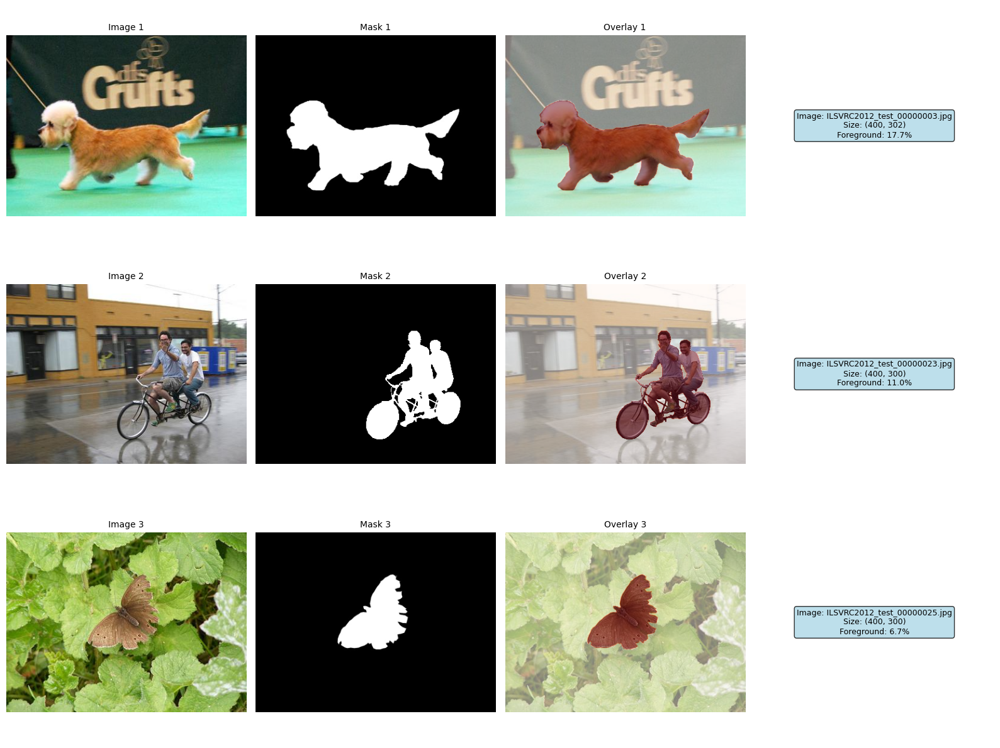

✅ Samples saved: /kaggle/working/linh/20251228_061419/visualizations/data_samples.png

📥 PRETRAINED MODEL
✅ Model ready: /kaggle/working/cobl/cobl/U2Net/u2net.pth

🔧 PREPARING DATALOADERS
✅ Train: 3515 samples (440 batches)
✅ Val: 752 samples (94 batches)
✅ Test: 752 samples

🚀 TRAINING

EPOCH 1/20


Validation: 100%|███████████████████████████████████████████████████████████████████████| 94/94 [00:29<00:00,  3.21it/s]



+----------------+---------+--------------+
| Metric         |   Train | Validation   |
+================+=========+==============+
| Total Loss     |  3.8054 | 3.6310       |
+----------------+---------+--------------+
| BCE Loss       |  0.1774 | 0.1669       |
+----------------+---------+--------------+
| Dice Loss      |  0.1737 | 0.1671       |
+----------------+---------+--------------+
| IoU Loss       |  0.2625 | 0.2465       |
+----------------+---------+--------------+
| D0 (Dice Coef) |  0.8444 | 0.8551       |
+----------------+---------+--------------+
| Learning Rate  |  0.001  | -            |
+----------------+---------+--------------+
⭐ Saved best model (val_loss: 3.6310)

EPOCH 2/20


Validation: 100%|███████████████████████████████████████████████████████████████████████| 94/94 [00:28<00:00,  3.35it/s]



+----------------+---------+--------------+
| Metric         |   Train | Validation   |
+================+=========+==============+
| Total Loss     |  2.9169 | 3.4915       |
+----------------+---------+--------------+
| BCE Loss       |  0.1241 | 0.1647       |
+----------------+---------+--------------+
| Dice Loss      |  0.139  | 0.1585       |
+----------------+---------+--------------+
| IoU Loss       |  0.2052 | 0.2383       |
+----------------+---------+--------------+
| D0 (Dice Coef) |  0.8826 | 0.8603       |
+----------------+---------+--------------+
| Learning Rate  |  0.001  | -            |
+----------------+---------+--------------+
⭐ Saved best model (val_loss: 3.4915)

EPOCH 3/20


Validation: 100%|███████████████████████████████████████████████████████████████████████| 94/94 [00:28<00:00,  3.35it/s]



+----------------+---------+--------------+
| Metric         |   Train | Validation   |
+================+=========+==============+
| Total Loss     |  2.5205 | 3.5706       |
+----------------+---------+--------------+
| BCE Loss       |  0.1068 | 0.1752       |
+----------------+---------+--------------+
| Dice Loss      |  0.1204 | 0.1589       |
+----------------+---------+--------------+
| IoU Loss       |  0.1763 | 0.2394       |
+----------------+---------+--------------+
| D0 (Dice Coef) |  0.9014 | 0.8597       |
+----------------+---------+--------------+
| Learning Rate  |  0.001  | -            |
+----------------+---------+--------------+

EPOCH 4/20


Validation: 100%|███████████████████████████████████████████████████████████████████████| 94/94 [00:28<00:00,  3.24it/s]



+----------------+---------+--------------+
| Metric         |   Train | Validation   |
+================+=========+==============+
| Total Loss     |  2.2896 | 3.6305       |
+----------------+---------+--------------+
| BCE Loss       |  0.0968 | 0.1812       |
+----------------+---------+--------------+
| Dice Loss      |  0.1095 | 0.1602       |
+----------------+---------+--------------+
| IoU Loss       |  0.1567 | 0.2389       |
+----------------+---------+--------------+
| D0 (Dice Coef) |  0.9131 | 0.8596       |
+----------------+---------+--------------+
| Learning Rate  |  0.001  | -            |
+----------------+---------+--------------+

EPOCH 5/20


Validation: 100%|███████████████████████████████████████████████████████████████████████| 94/94 [00:28<00:00,  3.31it/s]



+----------------+---------+--------------+
| Metric         |   Train | Validation   |
+================+=========+==============+
| Total Loss     |  2.1415 | 3.6606       |
+----------------+---------+--------------+
| BCE Loss       |  0.0894 | 0.1872       |
+----------------+---------+--------------+
| Dice Loss      |  0.103  | 0.1593       |
+----------------+---------+--------------+
| IoU Loss       |  0.1475 | 0.2394       |
+----------------+---------+--------------+
| D0 (Dice Coef) |  0.919  | 0.8599       |
+----------------+---------+--------------+
| Learning Rate  |  0.001  | -            |
+----------------+---------+--------------+

EPOCH 6/20


Validation: 100%|███████████████████████████████████████████████████████████████████████| 94/94 [00:28<00:00,  3.34it/s]



+----------------+---------+--------------+
| Metric         |   Train | Validation   |
+================+=========+==============+
| Total Loss     |  1.9403 | 3.5401       |
+----------------+---------+--------------+
| BCE Loss       |  0.0811 | 0.1867       |
+----------------+---------+--------------+
| Dice Loss      |  0.0933 | 0.1514       |
+----------------+---------+--------------+
| IoU Loss       |  0.1313 | 0.2267       |
+----------------+---------+--------------+
| D0 (Dice Coef) |  0.9289 | 0.8678       |
+----------------+---------+--------------+
| Learning Rate  |  0.001  | -            |
+----------------+---------+--------------+

EPOCH 7/20


Validation: 100%|███████████████████████████████████████████████████████████████████████| 94/94 [00:28<00:00,  3.35it/s]



+----------------+---------+--------------+
| Metric         |   Train | Validation   |
+================+=========+==============+
| Total Loss     |  1.7392 | 3.5951       |
+----------------+---------+--------------+
| BCE Loss       |  0.0716 | 0.1880       |
+----------------+---------+--------------+
| Dice Loss      |  0.0843 | 0.1545       |
+----------------+---------+--------------+
| IoU Loss       |  0.1156 | 0.2326       |
+----------------+---------+--------------+
| D0 (Dice Coef) |  0.9378 | 0.8637       |
+----------------+---------+--------------+
| Learning Rate  |  0.0005 | -            |
+----------------+---------+--------------+

⏹️ Early stopping (patience=5)

📊 TRAINING SUMMARY
+------------------+------------------+
| Metric           | Value            |
+==================+==================+
| Total Epochs     | 7                |
+------------------+------------------+
| Best Val Loss    | 3.4915 (Epoch 2) |
+------------------+------------------+
| Best 

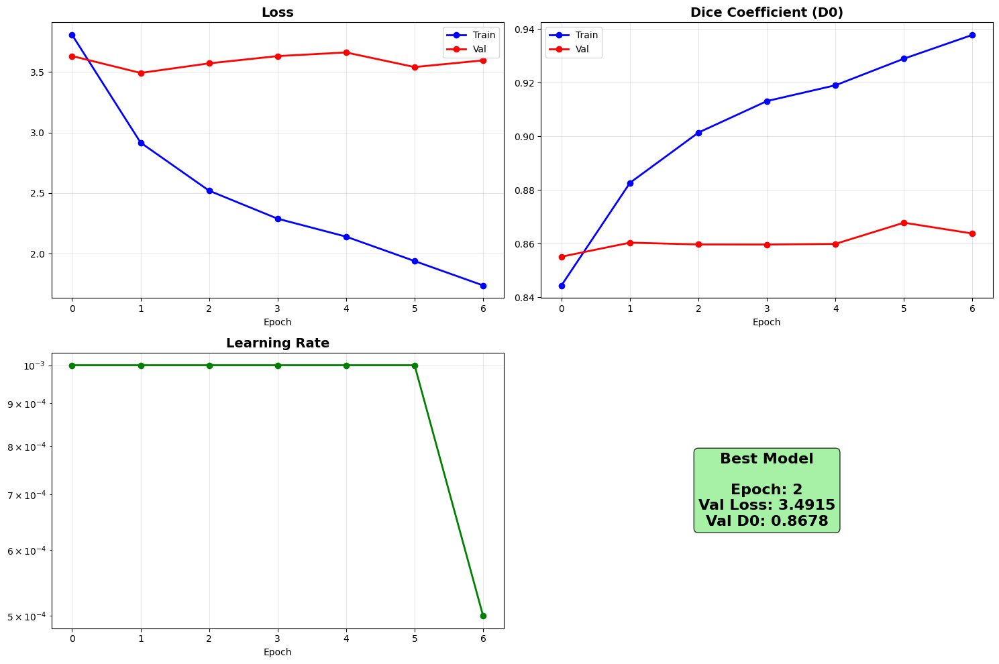

✅ Plot saved: /kaggle/working/linh/20251228_061419/outputs/training_curves.png

🧪 TESTING BEST MODEL


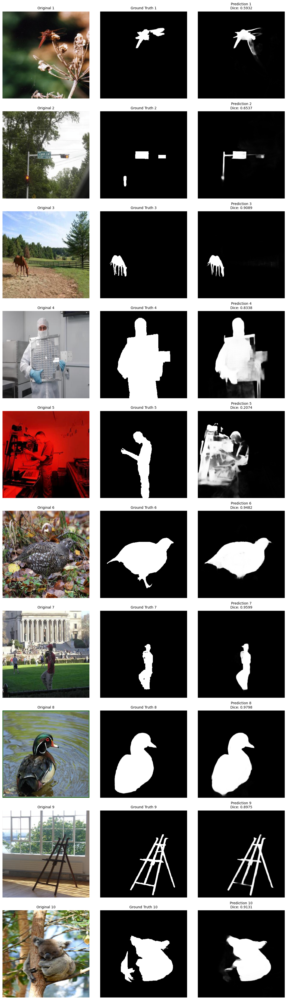


📊 Test Set Performance:
  Average Dice Score: 0.7895
  Min Dice Score: 0.2074
  Max Dice Score: 0.9798
✅ Test results saved: /kaggle/working/linh/20251228_061419/results/test_results.png

🎉 TRAINING COMPLETE - DATASET: LINH (DUTS-TE)
📂 All outputs saved to: /kaggle/working/linh/20251228_061419
🏆 Best model: /kaggle/working/linh/20251228_061419/checkpoints/best.pth
📊 Training history: /kaggle/working/linh/20251228_061419/outputs/history.csv
📈 Training curves: /kaggle/working/linh/20251228_061419/outputs/training_curves.png
🧪 Test results: /kaggle/working/linh/20251228_061419/results/test_results.png
🎨 Data samples: /kaggle/working/linh/20251228_061419/visualizations/data_samples.png
⚙️ Configuration: /kaggle/working/linh/20251228_061419/config.json

💡 Best Validation Dice Score: 0.8678
💡 Test Set Average Dice Score: 0.7895

✅ Để sử dụng model:
```python
model = U2NET(3, 1)
model.load_state_dict(torch.load('/kaggle/working/linh/20251228_061419/checkpoints/best.pth'))
model.eval()
```


In [1]:
# ============================================================================
# U2NET TRAINING PIPELINE - DATASET LINH ()
# Tất cả kết quả lưu vào folder /kaggle/working/linh/
# KHÔNG TẠO PSEUDO LABELS - SỬ DỤNG MASK CÓ SẴN
# ============================================================================

import sys
sys.path.insert(0, '/kaggle/working/cobl')
import os
import glob
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset, random_split
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
from datetime import datetime
import json
from skimage import io, transform
import cv2
from tqdm import tqdm
import warnings
import pandas as pd
from tabulate import tabulate
warnings.filterwarnings('ignore')

print("="*80)
print("🚀 U2NET TRAINING PIPELINE - DATASET: LINH (DUTS-TE)")
print("="*80)

# ============================================================================
# SETUP
# ============================================================================
if torch.cuda.is_available():
    torch.cuda.empty_cache()
    import gc
    gc.collect()

# Import U2Net
import importlib.util
spec = importlib.util.spec_from_file_location("u2net", "/kaggle/working/cobl/cobl/U2Net/u2net.py")
u2net_module = importlib.util.module_from_spec(spec)
spec.loader.exec_module(u2net_module)
U2NET = u2net_module.U2NET

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"✅ Device: {device}")

# ============================================================================
# CONFIGURATION - DATASET LINH (DUTS-TE)
# ============================================================================
class DatasetConfig:
    def __init__(self):
        self.dataset_name = 'linh'
        
        # ĐƯỜNG DẪN DỮ LIỆU DUTS-TE - CÓ SẴN MASK
        self.train_img_dir = '/kaggle/input/duts-tes/DUTS-TE-Image/'
        self.train_mask_dir = '/kaggle/input/duts-tes/DUTS-TE-Mask/'
        self.test_img_dir = None  # Sẽ tự động split từ train
        self.test_mask_dir = None
        
        # TRAINING PARAMS
        self.epochs = 20
        self.batch_size = 8
        self.lr = 0.001
        self.img_size = 320
        self.val_split = 0.15
        self.test_split = 0.15
        
        # LOSS WEIGHTS
        self.bce_weight = 1.0
        self.dice_weight = 2.0
        self.iou_weight = 0.5
        
        # EARLY STOPPING
        self.patience = 5
        
        # OUTPUT - LƯU VÀO FOLDER "linh"
        timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
        self.base_dir = f'/kaggle/working/linh/{timestamp}'

config = DatasetConfig()

# Create directories
os.makedirs(f'{config.base_dir}/checkpoints', exist_ok=True)
os.makedirs(f'{config.base_dir}/outputs', exist_ok=True)
os.makedirs(f'{config.base_dir}/results', exist_ok=True)
os.makedirs(f'{config.base_dir}/visualizations', exist_ok=True)

print(f"📂 Base directory: {config.base_dir}")

# ============================================================================
# METRICS & LOSS
# ============================================================================
def dice_coefficient(pred, target, smooth=1.0):
    pred = pred.view(-1)
    target = target.view(-1)
    intersection = (pred * target).sum()
    return (2. * intersection + smooth) / (pred.sum() + target.sum() + smooth)

class DiceLoss(nn.Module):
    def __init__(self, smooth=1.0):
        super().__init__()
        self.smooth = smooth
    
    def forward(self, pred, target):
        pred_flat = pred.contiguous().view(-1)
        target_flat = target.contiguous().view(-1)
        intersection = (pred_flat * target_flat).sum()
        dice = (2. * intersection + self.smooth) / (pred_flat.sum() + target_flat.sum() + self.smooth)
        return 1 - dice

class CombinedLoss(nn.Module):
    def __init__(self, bce_w, dice_w, iou_w):
        super().__init__()
        self.bce_w = bce_w
        self.dice_w = dice_w
        self.iou_w = iou_w
        self.bce = nn.BCELoss()
        self.dice = DiceLoss()
    
    def iou_loss(self, pred, target):
        intersection = (pred * target).sum()
        union = pred.sum() + target.sum() - intersection
        return 1 - (intersection + 1.0) / (union + 1.0)
    
    def forward(self, d0, d1, d2, d3, d4, d5, d6, labels):
        outputs = [torch.clamp(x, 1e-7, 1.0 - 1e-7) for x in [d0, d1, d2, d3, d4, d5, d6]]
        d0, d1, d2, d3, d4, d5, d6 = outputs
        
        bce_total = sum([self.bce(d, labels) for d in outputs])
        dice_total = sum([self.dice(d, labels) for d in outputs])
        iou = self.iou_loss(d0, labels)
        
        total = self.bce_w * bce_total + self.dice_w * dice_total + self.iou_w * iou
        
        return total, bce_total/7, dice_total/7, iou

# ============================================================================
# DATASET
# ============================================================================
class FlexibleDataset(Dataset):
    def __init__(self, img_list, mask_list, size=320, aug=False):
        self.imgs = [p for p in img_list if os.path.exists(p)]
        self.masks = [p for p in mask_list if os.path.exists(p)]
        assert len(self.imgs) == len(self.masks), f"Mismatch: {len(self.imgs)} images vs {len(self.masks)} masks"
        self.size = size
        self.aug = aug
    
    def __len__(self):
        return len(self.imgs)
    
    def __getitem__(self, i):
        img = io.imread(self.imgs[i]).astype(np.float32)
        if len(img.shape) == 2:
            img = np.stack([img]*3, -1)
        elif img.shape[2] == 4:
            img = img[:,:,:3]
        
        mask = io.imread(self.masks[i]).astype(np.float32)
        if len(mask.shape) == 3:
            mask = mask[:,:,0]
        
        img = transform.resize(img, (self.size, self.size), mode='constant')
        mask = transform.resize(mask, (self.size, self.size), mode='constant', order=0)
        
        if self.aug and np.random.rand() > 0.5:
            img = np.fliplr(img).copy()
            mask = np.fliplr(mask).copy()
        
        img = np.clip(img / (img.max() + 1e-6), 0, 1)
        tmp = np.zeros((self.size, self.size, 3), np.float32)
        tmp[:,:,0] = (img[:,:,0] - 0.485) / 0.229
        tmp[:,:,1] = (img[:,:,1] - 0.456) / 0.224
        tmp[:,:,2] = (img[:,:,2] - 0.406) / 0.225
        tmp = np.clip(tmp, -10, 10)
        
        mask = np.clip(mask / 255.0 if mask.max() > 1 else mask, 0, 1)
        
        if np.isnan(tmp).any() or np.isinf(tmp).any():
            tmp = np.nan_to_num(tmp, 0)
        if np.isnan(mask).any() or np.isinf(mask).any():
            mask = np.nan_to_num(mask, 0)
        
        img_t = torch.from_numpy(tmp).permute(2,0,1).float()
        mask_t = torch.from_numpy(mask).unsqueeze(0).float()
        
        return {'image': img_t, 'label': mask_t}

# ============================================================================
# LOAD DATA - CÓ SẴN MASK
# ============================================================================
print("\n" + "="*80)
print("📦 LOADING DATA (DUTS-TE - CÓ SẴN MASK)")
print("="*80)

def load_images(img_dir):
    if img_dir is None or not os.path.exists(img_dir):
        return []
    exts = ['*.png', '*.jpg', '*.jpeg', '*.bmp', '*.tif', '*.tiff']
    imgs = []
    for ext in exts:
        imgs.extend(glob.glob(os.path.join(img_dir, ext)))
        imgs.extend(glob.glob(os.path.join(img_dir, '**', ext), recursive=True))
    return sorted(imgs)

# Load images and masks
train_imgs = load_images(config.train_img_dir)
train_masks = load_images(config.train_mask_dir)

print(f"📸 Found {len(train_imgs)} images")
print(f"🎭 Found {len(train_masks)} masks")

# Match images with masks by filename
def match_images_masks(imgs, masks):
    """Match images with corresponding masks"""
    img_dict = {os.path.splitext(os.path.basename(p))[0]: p for p in imgs}
    mask_dict = {os.path.splitext(os.path.basename(p))[0]: p for p in masks}
    
    matched_imgs = []
    matched_masks = []
    
    for key in img_dict:
        if key in mask_dict:
            matched_imgs.append(img_dict[key])
            matched_masks.append(mask_dict[key])
    
    return matched_imgs, matched_masks

train_imgs, train_masks = match_images_masks(train_imgs, train_masks)

print(f"✅ Matched {len(train_imgs)} image-mask pairs")

# Visualize some samples
print("\n📊 Visualizing sample data...")
fig, axes = plt.subplots(3, 4, figsize=(16, 12))
for i in range(3):
    if i < len(train_imgs):
        img = Image.open(train_imgs[i]).convert('RGB')
        mask = Image.open(train_masks[i]).convert('L')
        
        axes[i,0].imshow(img)
        axes[i,0].set_title(f'Image {i+1}', fontsize=10)
        axes[i,0].axis('off')
        
        axes[i,1].imshow(mask, cmap='gray')
        axes[i,1].set_title(f'Mask {i+1}', fontsize=10)
        axes[i,1].axis('off')
        
        # Overlay
        axes[i,2].imshow(img)
        axes[i,2].imshow(mask, alpha=0.5, cmap='Reds')
        axes[i,2].set_title(f'Overlay {i+1}', fontsize=10)
        axes[i,2].axis('off')
        
        # Stats
        mask_array = np.array(mask)
        fg_ratio = (mask_array > 128).sum() / mask_array.size * 100
        axes[i,3].text(0.5, 0.5, 
                      f"Image: {os.path.basename(train_imgs[i])}\n"
                      f"Size: {img.size}\n"
                      f"Foreground: {fg_ratio:.1f}%",
                      ha='center', va='center', fontsize=9,
                      bbox=dict(boxstyle='round', facecolor='lightblue', alpha=0.8))
        axes[i,3].axis('off')

plt.tight_layout()
plt.savefig(f'{config.base_dir}/visualizations/data_samples.png', dpi=150, bbox_inches='tight')
plt.show()
print(f"✅ Samples saved: {config.base_dir}/visualizations/data_samples.png")

# ============================================================================
# DOWNLOAD PRETRAINED MODEL
# ============================================================================
print("\n" + "="*80)
print("📥 PRETRAINED MODEL")
print("="*80)

model_path = '/kaggle/working/cobl/cobl/U2Net/u2net.pth'
if not os.path.exists(model_path):
    print("Downloading pretrained U2Net...")
    os.makedirs(os.path.dirname(model_path), exist_ok=True)
    import subprocess
    url = 'https://www.dropbox.com/scl/fi/obpwapfgjl6gwmmwpc1le/u2net.pth?rlkey=0q0dqx17fk9yve3ve98ws9zy9&st=z6uuzf1c&dl=1'
    subprocess.run(['curl', '-L', '-o', model_path, url], check=True)
print(f"✅ Model ready: {model_path}")

# ============================================================================
# PREPARE DATALOADERS
# ============================================================================
print("\n" + "="*80)
print("🔧 PREPARING DATALOADERS")
print("="*80)

# Create full dataset
full_dataset = FlexibleDataset(train_imgs, train_masks, config.img_size, aug=True)

# Split train/val/test
test_size = int(len(full_dataset) * config.test_split)
val_size = int(len(full_dataset) * config.val_split)
train_size = len(full_dataset) - val_size - test_size

train_dataset, val_dataset, test_dataset = random_split(
    full_dataset, 
    [train_size, val_size, test_size],
    generator=torch.Generator().manual_seed(42)
)

train_loader = DataLoader(train_dataset, config.batch_size, shuffle=True, num_workers=2, pin_memory=True)
val_loader = DataLoader(val_dataset, config.batch_size, shuffle=False, num_workers=2, pin_memory=True)
test_loader = DataLoader(test_dataset, 1, shuffle=False, num_workers=2)

print(f"✅ Train: {len(train_dataset)} samples ({len(train_loader)} batches)")
print(f"✅ Val: {len(val_dataset)} samples ({len(val_loader)} batches)")
print(f"✅ Test: {len(test_dataset)} samples")

# ============================================================================
# TRAINING
# ============================================================================
print("\n" + "="*80)
print("🚀 TRAINING")
print("="*80)

model = U2NET(3, 1)
state = torch.load(model_path, map_location='cpu')
model.load_state_dict(state)
model = model.to(device)

criterion = CombinedLoss(config.bce_weight, config.dice_weight, config.iou_weight)
optimizer = optim.Adam(model.parameters(), lr=config.lr)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'min', factor=0.5, patience=3, verbose=True)

history = []
best_val_loss = float('inf')
patience_counter = 0

for epoch in range(1, config.epochs + 1):
    print(f"\n{'='*80}")
    print(f"EPOCH {epoch}/{config.epochs}")
    print(f"{'='*80}")
    
    # TRAIN
    model.train()
    train_metrics = {'loss': 0, 'bce': 0, 'dice': 0, 'iou': 0, 'd0': 0}
    
    pbar = tqdm(train_loader, desc=f"Training", ncols=120)
    for batch_idx, data in enumerate(pbar):
        img = data['image'].to(device, non_blocking=True)
        lbl = data['label'].to(device, non_blocking=True)
        
        optimizer.zero_grad()
        d0, d1, d2, d3, d4, d5, d6 = model(img)
        loss, bce, dice, iou = criterion(d0, d1, d2, d3, d4, d5, d6, lbl)
        loss.backward()
        optimizer.step()
        
        with torch.no_grad():
            d0_dice = dice_coefficient(torch.clamp(d0, 0, 1), lbl)
        
        train_metrics['loss'] += loss.item()
        train_metrics['bce'] += bce.item()
        train_metrics['dice'] += dice.item()
        train_metrics['iou'] += iou.item()
        train_metrics['d0'] += d0_dice.item()
        
        if (batch_idx + 1) % 20 == 0 or batch_idx == 0:
            pbar.set_postfix({
                'Loss': f"{loss.item():.4f}",
                'BCE': f"{bce.item():.3f}",
                'Dice': f"{dice.item():.3f}",
                'IoU': f"{iou.item():.3f}"
            })
    
    for k in train_metrics:
        train_metrics[k] /= len(train_loader)
    
    # VALIDATION
    model.eval()
    val_metrics = {'loss': 0, 'bce': 0, 'dice': 0, 'iou': 0, 'd0': 0}
    
    with torch.no_grad():
        for data in tqdm(val_loader, desc="Validation", ncols=120):
            img = data['image'].to(device, non_blocking=True)
            lbl = data['label'].to(device, non_blocking=True)
            
            d0, d1, d2, d3, d4, d5, d6 = model(img)
            loss, bce, dice, iou = criterion(d0, d1, d2, d3, d4, d5, d6, lbl)
            
            d0_dice = dice_coefficient(torch.clamp(d0, 0, 1), lbl)
            
            val_metrics['loss'] += loss.item()
            val_metrics['bce'] += bce.item()
            val_metrics['dice'] += dice.item()
            val_metrics['iou'] += iou.item()
            val_metrics['d0'] += d0_dice.item()
    
    for k in val_metrics:
        val_metrics[k] /= len(val_loader)
    
    # PRINT SUMMARY
    print("\n" + "="*80)
    table_data = [
        ['Metric', 'Train', 'Validation'],
        ['Total Loss', f"{train_metrics['loss']:.4f}", f"{val_metrics['loss']:.4f}"],
        ['BCE Loss', f"{train_metrics['bce']:.4f}", f"{val_metrics['bce']:.4f}"],
        ['Dice Loss', f"{train_metrics['dice']:.4f}", f"{val_metrics['dice']:.4f}"],
        ['IoU Loss', f"{train_metrics['iou']:.4f}", f"{val_metrics['iou']:.4f}"],
        ['D0 (Dice Coef)', f"{train_metrics['d0']:.4f}", f"{val_metrics['d0']:.4f}"],
        ['Learning Rate', f"{optimizer.param_groups[0]['lr']:.6f}", '-']
    ]
    print(tabulate(table_data, headers='firstrow', tablefmt='grid'))
    print("="*80)
    
    history.append({
        'epoch': epoch,
        'train_loss': train_metrics['loss'],
        'train_d0': train_metrics['d0'],
        'val_loss': val_metrics['loss'],
        'val_d0': val_metrics['d0'],
        'lr': optimizer.param_groups[0]['lr']
    })
    
    scheduler.step(val_metrics['loss'])
    
    if val_metrics['loss'] < best_val_loss:
        best_val_loss = val_metrics['loss']
        torch.save(model.state_dict(), f'{config.base_dir}/checkpoints/best.pth')
        print(f"⭐ Saved best model (val_loss: {best_val_loss:.4f})")
        patience_counter = 0
    else:
        patience_counter += 1
    
    if patience_counter >= config.patience:
        print(f"\n⏹️ Early stopping (patience={config.patience})")
        break

torch.save(model.state_dict(), f'{config.base_dir}/checkpoints/final.pth')

# ============================================================================
# TRAINING SUMMARY
# ============================================================================
print("\n" + "="*80)
print("📊 TRAINING SUMMARY")
print("="*80)

df = pd.DataFrame(history)
summary_table = [
    ['Metric', 'Value'],
    ['Total Epochs', len(history)],
    ['Best Val Loss', f"{df['val_loss'].min():.4f} (Epoch {df['val_loss'].idxmin() + 1})"],
    ['Best Val D0', f"{df['val_d0'].max():.4f} (Epoch {df['val_d0'].idxmax() + 1})"],
    ['Final Train Loss', f"{df['train_loss'].iloc[-1]:.4f}"],
    ['Final Val Loss', f"{df['val_loss'].iloc[-1]:.4f}"],
    ['Dataset', 'DUTS-TE'],
    ['Total Samples', len(full_dataset)],
    ['Train Samples', len(train_dataset)],
    ['Val Samples', len(val_dataset)],
    ['Test Samples', len(test_dataset)],
    ['Batch Size', config.batch_size],
]
print(tabulate(summary_table, headers='firstrow', tablefmt='grid'))

df.to_csv(f'{config.base_dir}/outputs/history.csv', index=False)
print(f"\n✅ History saved: {config.base_dir}/outputs/history.csv")

# ============================================================================
# PLOT RESULTS
# ============================================================================
print("\n" + "="*80)
print("📈 PLOTTING RESULTS")
print("="*80)

fig, axes = plt.subplots(2, 2, figsize=(15, 10))

axes[0,0].plot(df['train_loss'], 'b-o', label='Train', linewidth=2, markersize=6)
axes[0,0].plot(df['val_loss'], 'r-o', label='Val', linewidth=2, markersize=6)
axes[0,0].set_title('Loss', fontsize=14, fontweight='bold')
axes[0,0].set_xlabel('Epoch')
axes[0,0].legend()
axes[0,0].grid(True, alpha=0.3)

axes[0,1].plot(df['train_d0'], 'b-o', label='Train', linewidth=2, markersize=6)
axes[0,1].plot(df['val_d0'], 'r-o', label='Val', linewidth=2, markersize=6)
axes[0,1].set_title('Dice Coefficient (D0)', fontsize=14, fontweight='bold')
axes[0,1].set_xlabel('Epoch')
axes[0,1].legend()
axes[0,1].grid(True, alpha=0.3)

axes[1,0].plot(df['lr'], 'g-o', linewidth=2, markersize=6)
axes[1,0].set_title('Learning Rate', fontsize=14, fontweight='bold')
axes[1,0].set_xlabel('Epoch')
axes[1,0].set_yscale('log')
axes[1,0].grid(True, alpha=0.3)

best_epoch = df['val_loss'].idxmin() + 1
axes[1,1].text(0.5, 0.5, 
              f"Best Model\n\nEpoch: {best_epoch}\nVal Loss: {df['val_loss'].min():.4f}\nVal D0: {df['val_d0'].max():.4f}",
              ha='center', va='center', fontsize=16, fontweight='bold',
              bbox=dict(boxstyle='round', facecolor='lightgreen', alpha=0.8))
axes[1,1].axis('off')

plt.tight_layout()
plt.savefig(f'{config.base_dir}/outputs/training_curves.png', dpi=150, bbox_inches='tight')
plt.show()

print(f"✅ Plot saved: {config.base_dir}/outputs/training_curves.png")

# ============================================================================
# TEST BEST MODEL
# ============================================================================
print("\n" + "="*80)
print("🧪 TESTING BEST MODEL")
print("="*80)

model.load_state_dict(torch.load(f'{config.base_dir}/checkpoints/best.pth'))
model.eval()

# Test on 10 samples
test_samples = list(test_loader)[:10]

fig, axes = plt.subplots(10, 3, figsize=(12, 40))
test_dice_scores = []

for idx, data in enumerate(test_samples):
    img = data['image'].to(device)
    lbl = data['label'].to(device)
    
    with torch.no_grad():
        d0, *_ = model(img)
        pred = torch.clamp(d0, 0, 1)
        dice_score = dice_coefficient(pred, lbl).item()
        test_dice_scores.append(dice_score)
    
    # Convert to numpy
    img_np = img[0].cpu().permute(1,2,0).numpy()
    img_np = (img_np * [0.229, 0.224, 0.225]) + [0.485, 0.456, 0.406]
    img_np = np.clip(img_np, 0, 1)
    
    lbl_np = lbl[0,0].cpu().numpy()
    pred_np = pred[0,0].cpu().numpy()
    
    axes[idx,0].imshow(img_np)
    axes[idx,0].set_title(f'Original {idx+1}', fontsize=10)
    axes[idx,0].axis('off')
    
    axes[idx,1].imshow(lbl_np, cmap='gray')
    axes[idx,1].set_title(f'Ground Truth {idx+1}', fontsize=10)
    axes[idx,1].axis('off')
    
    axes[idx,2].imshow(pred_np, cmap='gray')
    axes[idx,2].set_title(f'Prediction {idx+1}\nDice: {dice_score:.4f}', fontsize=10)
    axes[idx,2].axis('off')

plt.tight_layout()
plt.savefig(f'{config.base_dir}/results/test_results.png', dpi=150, bbox_inches='tight')
plt.show()

avg_dice = np.mean(test_dice_scores)
print(f"\n📊 Test Set Performance:")
print(f"  Average Dice Score: {avg_dice:.4f}")
print(f"  Min Dice Score: {min(test_dice_scores):.4f}")
print(f"  Max Dice Score: {max(test_dice_scores):.4f}")
print(f"✅ Test results saved: {config.base_dir}/results/test_results.png")

# ============================================================================
# SAVE FINAL CONFIG
# ============================================================================
config_dict = {
    'dataset_name': config.dataset_name,
    'dataset_source': 'DUTS-TE',
    'train_img_dir': config.train_img_dir,
    'train_mask_dir': config.train_mask_dir,
    'epochs_trained': len(history),
    'best_val_loss': float(df['val_loss'].min()),
    'best_val_d0': float(df['val_d0'].max()),
    'test_avg_dice': float(avg_dice),
    'total_samples': len(full_dataset),
    'train_samples': len(train_dataset),
    'val_samples': len(val_dataset),
    'test_samples': len(test_dataset),
    'batch_size': config.batch_size,
    'learning_rate': config.lr,
}

with open(f'{config.base_dir}/config.json', 'w') as f:
    json.dump(config_dict, f, indent=2)

# ============================================================================
# FINAL SUMMARY
# ============================================================================
print("\n" + "="*80)
print("🎉 TRAINING COMPLETE - DATASET: LINH (DUTS-TE)")
print("="*80)
print(f"📂 All outputs saved to: {config.base_dir}")
print(f"🏆 Best model: {config.base_dir}/checkpoints/best.pth")
print(f"📊 Training history: {config.base_dir}/outputs/history.csv")
print(f"📈 Training curves: {config.base_dir}/outputs/training_curves.png")
print(f"🧪 Test results: {config.base_dir}/results/test_results.png")
print(f"🎨 Data samples: {config.base_dir}/visualizations/data_samples.png")
print(f"⚙️ Configuration: {config.base_dir}/config.json")
print("="*80)
print(f"\n💡 Best Validation Dice Score: {df['val_d0'].max():.4f}")
print(f"💡 Test Set Average Dice Score: {avg_dice:.4f}")
print("="*80)
print("\n✅ Để sử dụng model:")
print("```python")
print("model = U2NET(3, 1)")
print(f"model.load_state_dict(torch.load('{config.base_dir}/checkpoints/best.pth'))")
print("model.eval()")
print("```")
print("="*80)

In [2]:
# ============================================================================
# HADOOP MAPREDUCE FOR U2NET - TRUE PARALLEL VERSION
# Sử dụng multiprocessing để chạy song song các Mapper
# Tối ưu cho Kaggle (1 GPU + multi-CPU cores)
# ============================================================================

import sys
sys.path.insert(0, '/kaggle/working/cobl')
import os
import glob
import torch
import torch.nn as nn
import numpy as np
from PIL import Image
from datetime import datetime
from skimage import io, transform
import cv2
from tqdm import tqdm
import json
from tabulate import tabulate
import warnings
from multiprocessing import Pool, Queue, Manager, cpu_count
from functools import partial
import time
warnings.filterwarnings('ignore')

# ============================================================================
# CONFIGURATION
# ============================================================================
class MapReduceConfig:
    """Cấu hình MapReduce - TRUE PARALLEL"""
    
    def __init__(self):
        # === INPUT ===
        self.model_path = '/kaggle/working/linh/best.pth'  # Path đến trained model
        self.input_images_dir = '/kaggle/input/duts-tes/DUTS-TE-Image/'  # Input images
        
        # === OUTPUT ===
        timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
        self.output_base_dir = f'/kaggle/working/linh/mapreduce_{timestamp}'
        self.intermediate_dir = f'{self.output_base_dir}/intermediate'
        self.final_masks_dir = f'{self.output_base_dir}/final_masks'
        self.logs_dir = f'{self.output_base_dir}/logs'
        
        # === PARALLEL PARAMS ===
        # QUAN TRỌNG: Kaggle có 1 GPU + 4 CPU cores
        # Strategy: 
        # - 1 process chạy trên GPU (xử lý nhiều ảnh batch)
        # - Hoặc N processes chia nhau CPU (nếu không dùng GPU)
        self.use_gpu = True  # True = dùng 1 GPU process, False = multi-CPU
        self.num_mappers = 4  # Số lượng mapper processes
        self.num_reducers = 2  # Số lượng reducer processes
        
        # === PROCESSING PARAMS ===
        self.img_size = 320
        self.batch_size = 8  # Batch size cho GPU processing
        self.use_otsu_threshold = True
        self.fixed_threshold = 0.5
        
        # === FUSION ===
        self.fusion_weights = [0.5, 0.1, 0.1, 0.1, 0.05, 0.05, 0.1]
        self.save_all_scales = False  # False để tiết kiệm thời gian
    
    def create_dirs(self):
        os.makedirs(self.intermediate_dir, exist_ok=True)
        os.makedirs(self.final_masks_dir, exist_ok=True)
        os.makedirs(self.logs_dir, exist_ok=True)
        for i in range(self.num_mappers):
            os.makedirs(f'{self.intermediate_dir}/mapper_{i}', exist_ok=True)
    
    def save_config(self):
        config_dict = {k: v for k, v in self.__dict__.items() if not k.startswith('_')}
        with open(f'{self.output_base_dir}/config.json', 'w') as f:
            json.dump(config_dict, f, indent=2)

# ============================================================================
# FUSION MODULE
# ============================================================================
class MultiScaleFusion:
    def __init__(self, weights=None):
        if weights is None:
            weights = [0.5, 0.1, 0.1, 0.1, 0.05, 0.05, 0.1]
        self.weights = np.array(weights, dtype=np.float32)
    
    def fuse(self, outputs):
        """
        Args:
            outputs: list of 7 numpy arrays [H, W]
        Returns:
            fused: numpy array [H, W]
        """
        outputs_stack = np.stack(outputs, axis=0)  # [7, H, W]
        weights = self.weights.reshape(7, 1, 1)
        fused = (outputs_stack * weights).sum(axis=0)
        return np.clip(fused, 0, 1)

# ============================================================================
# PREPROCESSING & POSTPROCESSING
# ============================================================================
def preprocess_image(img_path, img_size=320):
    """Preprocess single image"""
    img = io.imread(img_path).astype(np.float32)
    
    if len(img.shape) == 2:
        img = np.stack([img]*3, -1)
    elif img.shape[2] == 4:
        img = img[:,:,:3]
    
    orig_size = img.shape[:2]
    
    img = transform.resize(img, (img_size, img_size), mode='constant', anti_aliasing=True)
    img = np.clip(img / (img.max() + 1e-6), 0, 1)
    
    # Normalize
    tmp = np.zeros((img_size, img_size, 3), np.float32)
    tmp[:,:,0] = (img[:,:,0] - 0.485) / 0.229
    tmp[:,:,1] = (img[:,:,1] - 0.456) / 0.224
    tmp[:,:,2] = (img[:,:,2] - 0.406) / 0.225
    tmp = np.clip(tmp, -10, 10)
    
    tensor = torch.from_numpy(tmp).permute(2,0,1).unsqueeze(0).float()
    
    return tensor, orig_size

def postprocess_mask(mask, orig_size, use_otsu=True, threshold=0.5):
    """Post-process mask"""
    mask = np.clip(mask, 0, 1)
    mask = (mask - mask.min()) / (mask.max() - mask.min() + 1e-6)
    
    mask_u8 = (mask * 255).astype(np.uint8)
    
    if use_otsu:
        _, mask_bin = cv2.threshold(mask_u8, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    else:
        _, mask_bin = cv2.threshold(mask_u8, int(threshold * 255), 255, cv2.THRESH_BINARY)
    
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3, 3))
    mask_bin = cv2.morphologyEx(mask_bin, cv2.MORPH_CLOSE, kernel)
    
    mask_img = Image.fromarray(mask_bin)
    mask_img = mask_img.resize(orig_size[::-1], Image.NEAREST)
    
    return mask_img

# ============================================================================
# MAPPER WORKER FUNCTION (for multiprocessing)
# ============================================================================
def mapper_worker(args):
    """
    Worker function cho mỗi mapper process
    Args:
        args: tuple (mapper_id, img_paths, model_path, config_dict)
    Returns:
        list of (key, intermediate_file_path)
    """
    mapper_id, img_paths, model_path, config_dict = args
    
    # Tái tạo config từ dict
    config = type('Config', (), config_dict)()
    
    # Load model trong process này
    import importlib.util
    spec = importlib.util.spec_from_file_location("u2net", "/kaggle/working/cobl/cobl/U2Net/u2net.py")
    u2net_module = importlib.util.module_from_spec(spec)
    spec.loader.exec_module(u2net_module)
    U2NET = u2net_module.U2NET
    
    # Chọn device: nếu use_gpu=True và có GPU, dùng GPU, không thì CPU
    if config_dict['use_gpu'] and torch.cuda.is_available():
        device = torch.device('cuda')
        # QUAN TRỌNG: Set CUDA device theo mapper_id để tránh conflict
        torch.cuda.set_device(0)  # Kaggle chỉ có 1 GPU
    else:
        device = torch.device('cpu')
    
    model = U2NET(3, 1)
    checkpoint = torch.load(model_path, map_location=device)
    
    if isinstance(checkpoint, dict) and 'state_dict' in checkpoint:
        model.load_state_dict(checkpoint['state_dict'])
    else:
        model.load_state_dict(checkpoint)
    
    model = model.to(device)
    model.eval()
    
    # Fusion
    fusion = MultiScaleFusion(config_dict['fusion_weights'])
    
    output_dir = f"{config_dict['intermediate_dir']}/mapper_{mapper_id}"
    
    # Process images
    mapper_results = []
    
    for img_path in img_paths:
        try:
            # Preprocess
            img_tensor, orig_size = preprocess_image(img_path, config_dict['img_size'])
            img_tensor = img_tensor.to(device)
            
            # Inference
            with torch.no_grad():
                d0, d1, d2, d3, d4, d5, d6 = model(img_tensor)
                
                # Convert to numpy
                outputs = [
                    d0[0, 0].cpu().numpy(),
                    d1[0, 0].cpu().numpy(),
                    d2[0, 0].cpu().numpy(),
                    d3[0, 0].cpu().numpy(),
                    d4[0, 0].cpu().numpy(),
                    d5[0, 0].cpu().numpy(),
                    d6[0, 0].cpu().numpy(),
                ]
                
                # Fuse
                fused = fusion.fuse(outputs)
            
            # Save intermediate
            img_name = os.path.basename(img_path)
            base_name = os.path.splitext(img_name)[0]
            intermediate_file = f'{output_dir}/{base_name}.npz'
            
            np.savez_compressed(
                intermediate_file,
                fused=fused,
                orig_size=orig_size
            )
            
            mapper_results.append((img_name, intermediate_file))
            
        except Exception as e:
            print(f"❌ Mapper {mapper_id} error on {os.path.basename(img_path)}: {e}")
    
    # Save log
    log_file = f"{config_dict['logs_dir']}/mapper_{mapper_id}.json"
    with open(log_file, 'w') as f:
        json.dump({
            'mapper_id': mapper_id,
            'total_processed': len(mapper_results),
            'device': str(device),
        }, f, indent=2)
    
    return mapper_results

# ============================================================================
# REDUCER WORKER FUNCTION
# ============================================================================
def reducer_worker(args):
    """
    Worker function cho reducer process
    Args:
        args: tuple (reducer_id, intermediate_data, config_dict)
    Returns:
        list of output filenames
    """
    reducer_id, intermediate_data, config_dict = args
    
    config = type('Config', (), config_dict)()
    
    reducer_results = []
    
    for key, inter_file in intermediate_data:
        try:
            # Load intermediate
            data = np.load(inter_file)
            fused = data['fused']
            orig_size = tuple(data['orig_size'])
            
            # Post-process
            final_mask = postprocess_mask(
                fused, 
                orig_size, 
                config_dict['use_otsu_threshold'],
                config_dict['fixed_threshold']
            )
            
            # Save
            base_name = os.path.splitext(key)[0]
            output_path = f"{config_dict['final_masks_dir']}/{base_name}.png"
            final_mask.save(output_path)
            
            reducer_results.append(output_path)
            
        except Exception as e:
            print(f"❌ Reducer {reducer_id} error on {key}: {e}")
    
    # Save log
    log_file = f"{config_dict['logs_dir']}/reducer_{reducer_id}.json"
    with open(log_file, 'w') as f:
        json.dump({
            'reducer_id': reducer_id,
            'total_processed': len(reducer_results),
        }, f, indent=2)
    
    return reducer_results

# ============================================================================
# MAPREDUCE COORDINATOR
# ============================================================================
class ParallelMapReduceCoordinator:
    """Điều phối MapReduce với TRUE PARALLELISM"""
    
    def __init__(self, config):
        self.config = config
        
        print("="*80)
        print("🗺️ HADOOP MAPREDUCE FOR U2NET - TRUE PARALLEL")
        print("="*80)
        print(f"💻 Available CPU cores: {cpu_count()}")
        print(f"🎮 GPU available: {torch.cuda.is_available()}")
        print(f"⚙️ Mapper processes: {config.num_mappers}")
        print(f"⚙️ Reducer processes: {config.num_reducers}")
        print(f"📂 Output: {config.output_base_dir}")
    
    def load_images(self):
        """Load input images"""
        print("\n📦 Loading input images...")
        
        exts = ['*.png', '*.jpg', '*.jpeg', '*.bmp', '*.tif']
        images = []
        for ext in exts:
            images.extend(glob.glob(os.path.join(self.config.input_images_dir, ext)))
            images.extend(glob.glob(os.path.join(self.config.input_images_dir, '**', ext), recursive=True))
        
        images = sorted(list(set(images)))
        print(f"✅ Found {len(images)} images")
        
        return images
    
    def split_for_mappers(self, images):
        """Chia images cho các mapper"""
        chunk_size = (len(images) + self.config.num_mappers - 1) // self.config.num_mappers
        
        chunks = []
        for i in range(self.config.num_mappers):
            start = i * chunk_size
            end = min((i + 1) * chunk_size, len(images))
            if start < len(images):
                chunks.append(images[start:end])
        
        return chunks
    
    def run(self):
        """Chạy toàn bộ parallel pipeline"""
        start_time = time.time()
        
        # Setup
        self.config.create_dirs()
        self.config.save_config()
        
        # Load images
        images = self.load_images()
        
        if len(images) == 0:
            print("❌ No images found!")
            return
        
        # Split for mappers
        mapper_chunks = self.split_for_mappers(images)
        
        # Convert config to dict for multiprocessing
        config_dict = {k: v for k, v in self.config.__dict__.items() if not k.startswith('_')}
        
        # === MAP PHASE (PARALLEL) ===
        print("\n" + "="*80)
        print("📤 MAP PHASE (PARALLEL)")
        print("="*80)
        
        # Prepare args for each mapper
        mapper_args = [
            (i, chunk, self.config.model_path, config_dict)
            for i, chunk in enumerate(mapper_chunks)
        ]
        
        # QUAN TRỌNG: Chọn số workers
        # - Nếu use_gpu=True: chỉ dùng 1 worker vì Kaggle có 1 GPU
        # - Nếu use_gpu=False: dùng multi workers (CPU)
        if self.config.use_gpu:
            num_workers = 1  # 1 GPU worker, process tuần tự
            print("🎮 Using GPU mode: Sequential processing on single GPU")
        else:
            num_workers = min(self.config.num_mappers, cpu_count())
            print(f"💻 Using CPU mode: {num_workers} parallel workers")
        
        all_mapper_results = []
        
        if num_workers == 1:
            # Sequential processing (GPU mode)
            for args in mapper_args:
                print(f"\n🔄 Processing Mapper {args[0]}...")
                results = mapper_worker(args)
                all_mapper_results.extend(results)
                print(f"✅ Mapper {args[0]} complete: {len(results)} files")
        else:
            # Parallel processing (CPU mode)
            with Pool(processes=num_workers) as pool:
                mapper_outputs = pool.map(mapper_worker, mapper_args)
                for results in mapper_outputs:
                    all_mapper_results.extend(results)
        
        print(f"\n✅ Map phase complete: {len(all_mapper_results)} intermediate files")
        
        # === SHUFFLE & SORT ===
        print("\n🔀 SHUFFLE & SORT PHASE")
        
        reducer_buckets = [[] for _ in range(self.config.num_reducers)]
        
        for key, value in all_mapper_results:
            reducer_id = hash(key) % self.config.num_reducers
            reducer_buckets[reducer_id].append((key, value))
        
        table_data = [['Reducer ID', 'Files']]
        for i, bucket in enumerate(reducer_buckets):
            table_data.append([f'Reducer {i}', len(bucket)])
        print(tabulate(table_data, headers='firstrow', tablefmt='grid'))
        
        # === REDUCE PHASE (PARALLEL) ===
        print("\n" + "="*80)
        print("📥 REDUCE PHASE (PARALLEL)")
        print("="*80)
        
        reducer_args = [
            (i, bucket, config_dict)
            for i, bucket in enumerate(reducer_buckets) if len(bucket) > 0
        ]
        
        all_reducer_results = []
        
        with Pool(processes=min(self.config.num_reducers, cpu_count())) as pool:
            reducer_outputs = pool.map(reducer_worker, reducer_args)
            for results in reducer_outputs:
                all_reducer_results.extend(results)
        
        print(f"\n✅ Reduce phase complete: {len(all_reducer_results)} final masks")
        
        # === SUMMARY ===
        end_time = time.time()
        duration = end_time - start_time
        
        print("\n" + "="*80)
        print("📊 PARALLEL MAPREDUCE SUMMARY")
        print("="*80)
        
        summary = [
            ['Metric', 'Value'],
            ['Total Images', len(images)],
            ['Mappers', self.config.num_mappers],
            ['Reducers', self.config.num_reducers],
            ['Processing Mode', 'GPU (Sequential)' if self.config.use_gpu else f'CPU (Parallel x{num_workers})'],
            ['Final Masks', len(all_reducer_results)],
            ['Total Time', f'{duration:.2f}s'],
            ['Avg Time/Image', f'{duration/len(images):.3f}s'],
            ['Throughput', f'{len(images)/duration:.2f} images/sec'],
            ['Output Directory', self.config.final_masks_dir],
        ]
        
        print(tabulate(summary, headers='firstrow', tablefmt='grid'))
        
        # Save summary
        with open(f'{self.config.output_base_dir}/summary.json', 'w') as f:
            json.dump({
                'total_images': len(images),
                'num_mappers': self.config.num_mappers,
                'num_reducers': self.config.num_reducers,
                'processing_mode': 'GPU' if self.config.use_gpu else 'CPU',
                'final_masks': len(all_reducer_results),
                'processing_time_seconds': duration,
                'throughput_images_per_sec': len(images)/duration,
                'output_dir': self.config.final_masks_dir
            }, f, indent=2)
        
        print(f"\n🎉 Parallel MapReduce Complete!")
        print(f"📁 Final masks: {self.config.final_masks_dir}")
        print("="*80)

# ============================================================================
# MAIN EXECUTION
# ============================================================================
if __name__ == "__main__":
    # IMPORTANT: Set multiprocessing start method
    import multiprocessing
    try:
        multiprocessing.set_start_method('spawn', force=True)
    except RuntimeError:
        pass
    
    # Initialize config
    config = MapReduceConfig()
    
    print("\n⚙️ CONFIGURATION:")
    print(f"   Model: {config.model_path}")
    print(f"   Input: {config.input_images_dir}")
    print(f"   Use GPU: {config.use_gpu}")
    print(f"   Mappers: {config.num_mappers}")
    print(f"   Reducers: {config.num_reducers}")
    print()
    
    # Run Parallel MapReduce
    coordinator = ParallelMapReduceCoordinator(config)
    coordinator.run()


⚙️ CONFIGURATION:
   Model: /kaggle/working/linh/best.pth
   Input: /kaggle/input/duts-tes/DUTS-TE-Image/
   Use GPU: True
   Mappers: 4
   Reducers: 2

🗺️ HADOOP MAPREDUCE FOR U2NET - TRUE PARALLEL
💻 Available CPU cores: 4
🎮 GPU available: True
⚙️ Mapper processes: 4
⚙️ Reducer processes: 2
📂 Output: /kaggle/working/linh/mapreduce_20251228_070634

📦 Loading input images...
✅ Found 5019 images

📤 MAP PHASE (PARALLEL)
🎮 Using GPU mode: Sequential processing on single GPU

🔄 Processing Mapper 0...


FileNotFoundError: [Errno 2] No such file or directory: '/kaggle/working/linh/best.pth'